In [1]:
import warnings 
warnings.filterwarnings("ignore")

from IPython.core.display import display, HTML
from IPython.display import Image, display, HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

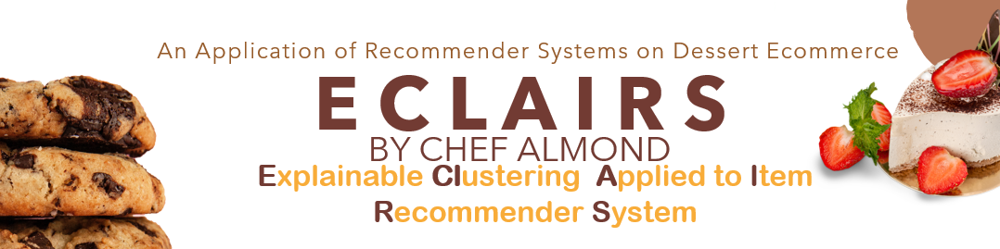

# <center>An Application of Recommender Systems on Dessert Ecommerce</center>

In [2]:
# For Data Prep
import numpy as np
import pandas as pd
import ast
import sqlite3
from sqlalchemy import create_engine
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from collections import Counter
import datetime
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MultiLabelBinarizer
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
from tqdm import trange

# For data scaling
from sklearn.preprocessing import StandardScaler
from scipy.stats import norm

# For Dimensionality Reduction
from sklearn.decomposition import PCA, TruncatedSVD

# For Representative-Based Clustering
from sklearn.cluster import KMeans
from pyclustering.cluster.kmedoids import kmedoids
from sklearn.base import clone
from sklearn.metrics import calinski_harabasz_score, silhouette_score
from sklearn.metrics import davies_bouldin_score
from scipy.spatial.distance import euclidean, cityblock

# For Heirarchical
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import fcluster
from fastcluster import linkage

# For Density-Based Clustering
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS, cluster_optics_dbscan

# For Gaussian Mixture Clustering
from sklearn.mixture import GaussianMixture as GMM

# For Recommender System
from surprise import (Reader, Dataset, KNNWithMeans, SVD)
import recmetrics
from surprise import (accuracy)
from sklearn.metrics import ndcg_score
# ! pip install recmetrics

# For FIM
import fim

# For Plotting
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle
import matplotlib.cm as cm
from plotly.subplots import make_subplots
import plotly.graph_objects as gob
from matplotlib import pyplot
import seaborn as sns

# For Deep Learning + SFIT
from statsmodels.stats.proportion import binom_test
from keras.initializers import glorot_normal
import keras.backend as K
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN, SpectralClustering
from sklearn.cluster import AgglomerativeClustering, OPTICS, KMeans
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from keras.models import Model, load_model
from keras.optimizers import Adam
from keras.layers import Input, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.utils import np_utils
import tensorflow as tf
from sfit import *

In [3]:
# Note: No Gap statistic to lessen runtime

def cluster_range(X, clusterer, k_start, k_stop, actual=None):
    '''
    Accepts the design matrix, the clustering object, the initial and final
    values to step through, and, optionally, actual labels and returns a
    dictionary of the cluster labels, cluster centers, internal validation
    values and, if actual labels is given, external validation values,
    for every k.
    '''
    ys = []
    centers = []
    inertias = []
    chs = []
    scs = []
    dbs = []
    gss = []
    gssds = []
    ps = []
    amis = []
    ars = []
    for k in range(k_start, k_stop+1):
        clusterer_k = clone(clusterer)
        clusterer_k.n_clusters = k
        clusterer_k.fit(X)
        y = clusterer_k.labels_
        ys.append(y)
        chs.append(calinski_harabasz_score(X, y))
        scs.append(silhouette_score(X, y, random_state=1337))
        dbs.append(davies_bouldin_score(X, y))
   
        centers.append(clusterer_k.cluster_centers_)
        inertias.append(clusterer_k.inertia_)
        
        if actual is not None:
            ps.append(purity(actual, y))
            amis.append(adjusted_mutual_info_score(actual, y))
            ars.append(adjusted_rand_score(actual, y))
            
    ret_dict = {'ys': ys, 'centers': centers, 'inertias': inertias,
                'chs': chs, 'scs': scs, 'dbs': dbs}
    
    if actual is not None:
        ret_dict['ps'] = ps
        ret_dict['amis'] = amis
        ret_dict['ars'] = ars
    
    return ret_dict

def plot_clusters(X, ys, centers):
    """Plot clusters given the design matrix and cluster labels"""
    k_max = len(ys) + 1
    k_mid = k_max//2 + 2
    fig, ax = plt.subplots(2, k_max//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(16,9))
    for k, y in zip(range(2, k_max+1), ys):
        if k < k_mid:
            ax[0][k%k_mid-2].scatter(X[:,0], X[:,1], c=y, s=24, alpha=0.6,
                                     cmap='flare');
            ax[0][k%k_mid-2].set_title('$k=%d$ clusters'%k, size=18)
        else:
            ax[1][k%k_mid].scatter(X[:,0], X[:,1], c=y, s=24, alpha=0.6,
                                   cmap='flare');
            ax[1][k%k_mid].set_title('$k=%d$ clusters'%k, size=18)
    return ax

def plot_internal(inertias, chs, scs, dbs, gss=None, gssds=None):
    """Plot internal validation values"""
    fig, ax = plt.subplots()
    ks = np.arange(2, len(inertias)+2)
    ax.plot(ks, inertias, '-o', label='Sum of Squared Error',
            c='xkcd:chestnut')
    ax.plot(ks, chs, '-^', label='Calinski-Harabasz index',
            c='xkcd:peach')
    ax.set_xlabel('$k$ clusters', size=14)
    ax.set_ylabel('SSE/CH', size=14)
    lines, labels = ax.get_legend_handles_labels()
    ax2 = ax.twinx()
    ax2.plot(ks, scs, '-x', label='Silhouette coefficient',
             c='xkcd:dark pink')
    ax2.plot(ks, dbs, '-d', label='Davies-Bouldin index',
             c='xkcd:indigo')
    ax2.set_ylabel('Silhouette/DB', size=14)
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines+lines2, labels+labels2)
    return ax

def pooled_within_ssd(X, y, centroids, dist):
    """
    Compute pooled within-cluster sum of squares around the cluster mean
    """

    dist2 = []
    X = np.array(X)
    y = np.array(y)
    for x in np.unique(y):
        distance = [dist(i, centroids[y[index]])**2 for index,
                    i in enumerate(X) if y[index] == x]
        dist2.append(distance)
    
    w_k = sum([np.sum(i)/(2*len(i)) for i in dist2])
    return w_k

def cluster_range_kmedoids(X, k_start, k_stop, actual=None):
    """
    Accepts the design matrix, the initial and final values to step through,
    and, optionally, actual labels and returns a dictionary of the cluster
    labels, cluster centers, internal validation values, and external
    validation values if actual labels is given, for every k.
    """
    ys = []
    cs = []
    inertias = []
    chs = []
    scs = []
    dbs = []
    gss = []
    gssds = []
    ps = []
    amis = []
    ars = []
    for k in range(k_start, k_stop+1):
        clusterer_k = kmedoids(X, np.arange(k), ccore=True)
        clusterer_k.process()
        y = np.zeros(len(X), dtype=int)
        clusters = clusterer_k.get_clusters()
        for cluster, point in enumerate(clusters):
            y[point] = cluster
        centers = X[clusterer_k.get_medoids()]
        
        se = [euclidean(x, centers[y[i]]) ** 2 for i, x in enumerate(X)]
        sse = np.sum(se)
        ys.append(y)
        cs.append(centers)
        inertias.append(sse)
        chs.append(calinski_harabasz_score(X, y))
        scs.append(silhouette_score(X, y))
        dbs.append(davies_bouldin_score(X, y))

        if actual is not None:
                ps.append(purity(actual, y))
                amis.append(adjusted_mutual_info_score(actual, y))
                ars.append(adjusted_rand_score(actual, y))
                
    out = {
        'ys': ys,
        'centers': cs,
        'inertias': inertias,
        'chs': chs,
        'scs': scs,
        'dbs': dbs,
    }

    if actual is not None:
        out['ps'] = ps
        out['amis'] = amis
        out['ars'] = ars
    return out

def plot1(Z):
    '''
    Accepts a hierarchical clustering encoded as a linkage matrix and
    returns a truncated dendogram plot
    '''
    fig, ax = plt.subplots()
    dn = dendrogram(Z, ax=ax, truncate_mode='level', p=4)
    ax.set_ylabel(r'$\Delta$');
    
    return fig

def ave_nn_dist(n_neighbors, data):
    '''
    Accepts the n_neighbors to consider and the data then returns the average
    distance of a point to its  𝑘=1 nearest neighbor up to  𝑘=𝑛_𝑛𝑒𝑖𝑔ℎ𝑏𝑜𝑟𝑠 
    nearest neighbor as a sorted list.
    '''

    kNN = NearestNeighbors(n_neighbors=n_neighbors)
    kNN.fit(data)
    d = kNN.kneighbors()[0].mean(axis=1)
    
    return np.sort(d).tolist()

def plot_clusters_year(X, ys, centers):
    """Plot clusters given the design matrix and cluster labels"""
    k_max = len(ys) + 1
    k_mid = k_max//2 + 2
    fig, ax = plt.subplots(1, k_max-1, dpi=150, sharex=True, sharey=True, 
                           figsize=(7,4), subplot_kw=dict(aspect='equal'),
                           gridspec_kw=dict(wspace=0.01))
    for k, y in zip(range(2, k_max+1), ys):
            ax[k%k_mid-2].scatter(X[:,0], X[:,1], c=y, s=1, alpha=0.8);
            ax[k%k_mid-2].set_title('$k=%d$'%k)
    return ax

def plot_gmm(gmm, X, label=True, ax=None):
    """
    Plot gmm score.
    """
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)

    wfactor = 0.2 / gmm.weights.max()
    for pos, covar, w in zip(gmm.means, gmm.covariances, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * wfactor)
    plt.title("GMM with %d components"%len(gmm.means), fontsize=(20))
    plt.xlabel("U.A.")
    plt.ylabel("U.A.")


def SelBest(arr:list, X:int)->list:
    '''
    Returns the set of X configurations with shorter distance.
    '''
    dx=np.argsort(arr)[:X]
    return arr[dx]

def recsys(df_melt, rating_scale, method, user_list, df_name):
    '''
    Accepts a user rating dataframe, tuple of rating scale, 
    predition method, and list of user to give recommendations
    then returns a dataframe of the top 5 liked and recommended
    items per user based on the prediction method passed.
    '''
    df_rating = df_melt.pivot_table(values='rating', index='user_id',
                                    columns='recipe_id')
    reader = Reader(rating_scale=rating_scale)
    dataset = Dataset.load_from_df(df_melt, reader)
    method.fit(dataset.build_full_trainset())
    predictions = method.test(method.trainset.build_anti_testset())

    df_reco_user = pd.DataFrame()
    for user in user_list: # Get reco for N users
        top_n = []
        for uid, iid, true_r, est, _ in predictions:
            if uid == user:
                top_n.append((iid, est))
        
        # Get top N reco
        reco_list = sorted(top_n, key=lambda x: (-x[1], x[0]))[:10] 
        top = [i[0] for i in reco_list]
        reco = df_name.loc[top].reset_index(drop=True)\
                                .rename(columns={"name": user}).T
        x = df_name.loc[top].reset_index(drop=True)['name'].to_list()[:5]
        likes = df_rating.loc[user].dropna()\
                                    .sort_values(ascending=False).index
        y = df_name.loc[likes].reset_index(drop=True)['name'].to_list()[:5]
        assets = [user]
        Asset_feature = ['Likes', 'Recommends']
        index = ['Top1', 'Top2', 'Top3', 'Top4', 'Top5']

        midx = pd.MultiIndex.from_product([assets, Asset_feature])
        reco = pd.DataFrame([y,x], index=midx, columns=index).T
        df_reco_user = pd.concat([df_reco_user, reco], axis=1)

    return df_reco_user, predictions

def get_users_predictions(user_id, n, model):
    """
    Get user prediction.
    """
    recommended_items = pd.DataFrame(model.loc[user_id])
    recommended_items.columns = ["predicted_rating"]
    recommended_items = recommended_items.sort_values('predicted_rating',
                                                      ascending=False)    
    recommended_items = recommended_items.head(n)
    return recommended_items.index.tolist()

def prepare_data(df, add_intercept=True):
    """
    Add intercepts to data.
    """
    if add_intercept:
        df.insert(loc=0, column='intercept', value=1)
    msk = np.random.rand(len(df)) < 0.7
    train = df[msk]
    val_test = df[~msk]
    msk = np.random.rand(len(val_test)) < 0.66
    val = val_test[msk]
    test = val_test[~msk]
    print('Number of observations in train set: {0}'.format(train.shape[0]))
    print('Number of observations in validation set: {0}'\
          .format(val.shape[0]))
    print('Number of observations in test set: {0}'.format(test.shape[0]))
    print('Total number of observations: {0}'.format(train.shape[0] +
                                                     val.shape[0] +
                                                     test.shape[0]))
    X_train = train.iloc[:, 0:-1]
    Y_train = train.iloc[:, -1]
    X_val = val.iloc[:, 0:-1]
    Y_val = val.iloc[:, -1]
    X_test = test.iloc[:, 0:-1]
    Y_test = test.iloc[:, -1]
    return X_train, Y_train, X_val, Y_val, X_test, Y_test


def absolute_loss(predicted_y, true_y):
    """
    Compute the absolute value of the difference between two given
    real vectors of size N

    Parameters
    ----------
    predicted_y : numpy array of shape (N, 1)
        The predicted outcomes
    true_y : numpy array of shape (N, )
        The true outcomes

    Returns
    -------
    absolute_loss
        a numpy array of shape (N, )
    """
    return np.abs(true_y - np.squeeze(predicted_y))


def binary_cross_entropy_loss(predicted_y, true_y):
    """Compute the binary cross entropy loss between a vector of labels of
    size N and a vector of probabilities of same size

    Parameters
    ----------
    predicted_y : numpy array of shape (N, 1)
        The predicted probabilities
    true_y : numpy array of shape (N, )
        The true labels

    Returns
    -------
    binary_cross_entropy_loss
        a numpy array of shape (N, )
    """
    x = np.squeeze(predicted_y)
    return -np.log(x)*true_y - np.log(1 - x)*(1 - true_y)


def categorical_cross_entropy_loss(predicted_y, true_y):
    """Compute the categorical cross entropy loss between a vector of
    labels of size (N,C) and a vector of probabilities of same size

    Parameters
    ----------
    predicted_y : numpy array of shape (N, 1)
        The predicted probabilities
    true_y : numpy array of shape (N, )
        The true labels

    Returns
    -------
    categorical_cross_entropy_loss
        a numpy array of shape (N, )
    """
    return -np.sum(np.multiply(np.log(np.maximum(predicted_y, 1e-6)),
                               true_y), axis=1)


def compute_errors_first(loss, model, n, p, x, y):
    """Error computation"""
    x_intercept = np.copy(x)
    x_intercept[:, range(1, p)] = 0
    predicted_y = model.predict(x_intercept)
    errors = np.zeros((n, p))
    errors[:, 0] = loss(predicted_y, y)
    for j in range(1, p):
        x_j = np.copy(x)
        indices = [i for i in range(1, p) if i != j]
        x_j[:, indices] = 0
        predicted_y_j = model.predict(x_j)
        errors[:, j] = loss(predicted_y_j, y)
    return errors


def sign_test_first(alpha, beta, errors, n, p):
    """Sign test"""
    c_1 = {}
    s_1 = []
    u_1 = []
    p_values = np.zeros(p - 1)
    for j in range(1, p):
        delta_j = (1 - beta) * errors[:, 0] - errors[:, j]
        n_j = np.sum(delta_j > 0)
        p_values[j - 1] = binom_test(n_j, n, 0.5, 'larger')
        if binom_test(n_j, n, 0.5, 'larger') < alpha:
            q = norm.ppf(1 - alpha / 2, 0, 1)
            lower = int(np.floor((n + 1) / 2 - q * np.sqrt(n) / 2))
            upper = int(np.ceil((n + 1) / 2 + q * np.sqrt(n) / 2))
            ordered_delta_j = np.sort(delta_j)
            s_1.append(j)
            c_1[j] = (np.median(delta_j), (ordered_delta_j[lower],
                                           ordered_delta_j[upper]))
        else:
            u_1.append(j)
    return c_1, p_values, s_1, u_1


def sfit_first_order(model, loss, x, y, alpha, beta=None, verbose=0):
    """
    Compute the first-order SFIT method to test what are the
    first-order significant variables within x toward the prediction
    of y as learned by the model.

    Parameters
    ----------
    model :
        A predictive model that can return predicted y given x by calling its
        method model.predict
    loss : function
        Function that computes the pointwise loss between 2 numpy arrays of
        outcomes, its first argument should be the predicted outcomes and its
        second should be the true ones.
    x: numpy array of shape (N, p)
        Input data used to perform the tests
    y: numpy array of shape (N, )
        True outcomes
    alpha : float
        Significance level of the test
    beta: float
        Regularization amount of the test. If set to None, the optimal beta
        parameter is found using the randomization procedure described in the
        original SFIT paper (works only when model is a Keras model).
    verbose: boolean
        The summary of the test procedure is printed if true (default)
        but no printing if false.
    Returns
    -------
    s_1 : list
        the list of first-order significant variables (indexed from 1 to p)
    c_1 : dictionary
        dictionary whose keys are the first-order significant variables ;
        for each key, its value is a tuple whose first element is the test
        statistic value and second element is its (1 - alpha)%
        confidence interval
    u_1 : list
        the list of first-order non-significant variables
        (indexed from 1 to p)
    p_values : numpy array of shape (p, )
        array containing the p-values associated with each variables.
    second_order_significance : boolean
        If true, indicates the presence of significant second-order effects
        which suggests to use second-order SFIT.
    opt_beta : float
        Equals to beta if beta is passed as argument, otherwise equals
        to the optimal beta found from randomization
        procedure.
    """
    (n, p) = x.shape
    assert np.array_equal(x[:, 0], np.ones(n)), 'As an intercept, all the '\
                                            'entries of the first column '\
                                            'of x should be equal to 1.'
    errors = compute_errors_first(loss, model, n, p, x, y)
    if beta is not None:
        opt_beta = beta
        c_1, p_values, s_1, u_1 = sign_test_first(alpha, beta, errors, n, p)
    else:
        print('Compute optimal beta')
        beta = 1e-7
        mean_nr_significants = 1
        initial_weights = model.get_weights()
        k_eval = lambda placeholder: placeholder.eval(session=K.get_session())
        nr_simulations = 20
        x_val, x_test, y_val, y_test = train_test_split(x, y, test_size=0.5)
        n_val = x_val.shape[0]
        n_test = x_test.shape[0]
        while mean_nr_significants > alpha:
            beta = beta*10
            nr_significants_per_sim = np.zeros(nr_simulations)
            for i in range(nr_simulations):
                new_weights = [k_eval(glorot_normal()(w.shape)) \
                               for w in initial_weights]
                model.set_weights(new_weights)
                errors_i = compute_errors_first(loss, model, n_val, p,
                                                x_val, y_val)
                c_1_i, p_values_i, s_1_i, u_1_i = sign_test_first(alpha,
                                                                  beta,
                                                                  errors_i,
                                                                  n_val, p)
                nr_significants_per_sim[i] = len(s_1_i)/p
            mean_nr_significants = np.mean(nr_significants_per_sim)
        opt_beta = beta
        print('Optimal beta found: {0}'.format(opt_beta))
        model.set_weights(initial_weights)
        errors = compute_errors_first(loss, model, n_test, p, x_test, y_test)
        c_1, p_values, s_1, u_1 = sign_test_first(alpha, beta, errors,
                                                  n_test, p)
    if verbose:
        print('Summary of first-order SFIT\n'
              '------------------------------------------------\n'
              'First-order significant variables:')
        for key in c_1.keys():
            print('- Variable {0}:'.format(key))
            print('\t Median: {0}'.format(np.round(c_1[key][0], 3)))
            print('\t {0}% confidence interval: {1}'\
                  .format(int(100*(1-alpha)), np.round(c_1[key][1], 3)))
        print('------------------------------------------------\n'
              'First-order non-significant variables: {0}'.format(u_1))

    # Test for presence of any second-order significance:
    second_order_significance = False
    x_first = np.copy(x)
    indices = [i for i in range(1, p) if i in u_1]
    x_first[:, indices] = 0
    predicted_y_first = model.predict(x_first)
    model_first_errors = loss(predicted_y_first, y)
    predicted_y_all = model.predict(x)
    model_all_errors = loss(predicted_y_all, y)
    delta_j = model_first_errors - model_all_errors
    n_j = np.sum(delta_j > 0)
    if binom_test(n_j, n, 0.5, 'larger') < alpha:
        second_order_significance = True
        if verbose:
            print('------------------------------------------------\n'
                  'There are some significant second-order variables: '\
                  'recommended to run second-order SFIT.')
    else:
        if verbose:
            print('------------------------------------------------\n'
                  'There are no significant second-order variables.')
    if verbose:
        print('------------------------------------------------ \n'
              '------------------------------------------------ \n')
    return s_1, c_1, u_1, p_values, second_order_significance, opt_beta


def sfit_second_order(model, loss, alpha, beta, x, y, s_1, u_1, verbose=0):
    """Compute the second-order SFIT method to test what are the second-order
    significant variables within x toward the prediction of y as learned
    by the model.

    Parameters
    ----------
    model :
        A predictive model that can return predicted y given x by calling
        its method model.predict
    loss : function
        Function that computes the pointwise loss between 2 numpy arrays of
        outcomes, its first argument should be the predicted outcomes and
        its second should be the true ones.
    alpha : float
        Significance level of the test
    beta: float
        Regularization amount of the test
    x: numpy array of shape (N, p)
        Input data used to perform the tests
    y: numpy array of shape (N, )
        True outcomes
    s_1 : list
        the list of first-order significant variables as returned by
        sfit_first_order
    u_1 : list
        the list of first-order non-significant variables as returned by
        sfit_first_order
    verbose: boolean
        The summary of the test procedure is printed if true (default) but
        no printing if false.

    Returns
    -------
    s_2: list
        the list of second-order significant variables (indexed from 1 to p)
    c_2 : dictionary
        dictionary whose keys are the second-order significant pairs pf
        variables ; for each key, its value is a tuple whose first element
        is the test statistic value and second element is its (1 - alpha)%
        confidence interval
    u_2 : list
        the list of second-order non-significant variables
        (indexed from 1 to p)
    third_order_significance : boolean
        If true, indicates the presence of significant third-order effects.
    """
    s_2 = []
    c_2 = {}
    u_2 = []
    (n, p) = x.shape
    assert np.array_equal(x[:, 0], np.ones(n)), 'As an intercept, all the '\
    'entries of the first column of x should be equal to 1.'
    x_intercept = np.copy(x)
    x_intercept[:, range(1, p)] = 0
    predicted_y_intercept = model.predict(x_intercept)
    baseline_model_errors = loss(predicted_y_intercept, y)
    for j in u_1:
        for k in range(1, p):
            x_jk = np.copy(x)
            indices = [i for i in range(1, p) if (i != j and i != k)]
            x_jk[:, indices] = 0
            predicted_y_jk = model.predict(x_jk)
            model_jk_errors = loss(predicted_y_jk, y)
            if k in s_1:
                x_k = np.copy(x)
                indices = [i for i in range(1, p) if i != k]
                x_k[:, indices] = 0
                predicted_y_k = model.predict(x_k)
                model_k_errors = loss(predicted_y_k, y)
                delta_jk = (1-beta)*model_k_errors - model_jk_errors
            else:
                delta_jk = (1-beta)*baseline_model_errors - model_jk_errors
            n_jk = np.sum(delta_jk > 0)
            if binom_test(n_jk, n, 0.5, 'larger') < alpha:
                q = norm.ppf(1-alpha/2, 0, 1)
                lower = int(np.floor((n+1)/2 - q*np.sqrt(n)/2))
                upper = int(np.ceil((n+1)/2 + q*np.sqrt(n)/2))
                ordered_delta_jk = np.sort(delta_jk)
                if j not in s_2:
                    s_2.append(j)
                c_2[(j, k)] = (np.median(delta_jk), (ordered_delta_jk[lower],
                                                     ordered_delta_jk[upper]))
        if j not in s_2:
            u_2.append(j)
    if verbose:
        print('Summary of second-order SFIT\n'
              '------------------------------------------------\n'
              'Second-order significant variables:')
        for key in c_2.keys():
            print('- Variable {0}:'.format(key))
            print('\t Median: {0}'.format(np.round(c_2[key][0], 3)))
            print('\t {0}% confidence interval: {1}'\
                  .format(int(100*(1-alpha)), np.round(c_2[key][1], 3)))
        print('------------------------------------------------\n'
              'Second-order non-significant variables: {0}'.format(u_2))

    # Test for presence of any third-order significance:
    x_second = np.copy(x)
    indices = [i for i in range(1, p) if i in u_2]
    x_second[:, indices] = 0
    predicted_y_second = model.predict(x_second)
    model_second_errors = loss(predicted_y_second, y)
    predicted_y_all = model.predict(x)
    model_all_errors = loss(predicted_y_all, y)
    delta_j = model_second_errors - model_all_errors
    n_j = np.sum(delta_j > 0)
    third_order_significance = False
    if binom_test(n_j, n, 0.5, 'larger') < 0.05:
        third_order_significance = True
        if verbose:
            print('------------------------------------------------\n'
                  'There are some significant third-order variables: '\
                  'recommended to run third-order SFIT.')
    else:
        if verbose:
            print('------------------------------------------------\n'
                  'There are no significant third-order variables.')
    if verbose:
        print('------------------------------------------------ \n'
              '------------------------------------------------ \n')

    return s_2, c_2, u_2, third_order_significance


# Executive Summary

If you're a foodie like LT7 members, you know the struggle of deciding what to cook for your next meal. With thousands of recipes available online, it can be overwhelming to choose just one. That's where a personalized recommendation system comes in handy. And that's precisely what this project aims to achieve for dessert lovers on food.com!

The pandemic has led to a surge in home cooking, and food.com has become a go-to destination for many recipe seekers. However, the platform lacks a recommendation system to help users navigate through the vast collection of recipes available. This project addresses that gap by creating a recommender system based on user preferences.

Using a Kaggle dataset of scraped recipes and user interactions from food.com, the team implemented a comprehensive data science pipeline to generate personalized recommendations for clustered users and items. The dataset was pre-processed to remove duplicates and filter out unnecessary data, and dimensionality reduction techniques were applied to manage computational efficiency and memory constraints. The team used clustering techniques to identify user and item clusters, and various collaborative filtering methods were used to generate recommendations based on user ratings.

The study found that the most effective was the latent-factor-based collaborative filtering technique which provided personalized recommendations with high coverage, balanced novelty score, and high intra-list similarity score. This means that users can get recommendations that are tailored to their preferences while still exploring new options. The study also recommends further improvements by applying other clustering techniques and algorithms, content-based collaborative filtering, and exploring other food categories.

With this project, food.com users can enjoy a personalized recommendation system that improves their experience and engagement on the platform. Whether you're a dessert enthusiast or a curious recipe seeker, this recommender system will help you find your next favorite dessert recipe in no time!

# Background

The recent pandemic has led to a renewed interest in home cooking. With the closure of food establishments, people were left with little choice but to prepare their meals. According to a survey conducted by Hunter [1], a food and beverage marketing agency, 54% of Americans said they were cooking more at home since the pandemic started, 67% had increased confidence in their cooking abilities, and 48% said they were trying new recipes. A similar survey conducted by the International Food Information Council [2] reflected similar results, with 60% of respondents saying they are cooking at home more often.

Food recipe websites played a crucial role in this trend. They provided quick access to a wide selection of recipes, allowing users to search for recipes based on the available ingredients and cooking materials they had. In addition, with concerns about health and wellness during the pandemic, many people turned to these websites for ideas on how to prepare healthy meals. Food websites also offered resources on healthy eating, including tips on portion control and developing meal plans. The more popular websites also include forums and comment sections where users can discuss with one another. These gave home cooks a sense of community during a time of extended isolation.

Among the most popular food websites is food.com [3]. Founded in 2004, food.com is a collaborative platform where home cooks can share their favorite recipes and culinary creations. It has one of the largest and still growing collections of recipes online, rivaled only by other big food websites such as allrecipes.com and foodnetwork.com. It has one of the most active communities of users who rate and review recipes that they have tried, as well as share cooking tips and tricks with beginners. More recently, food.com introduced a meal planning tool and a shopping list tool wherein users can choose recipes from the collection and these tools will return a schedule of dishes for each day and a list of ingredients to buy.

One of the shortcomings of food.com is its lack of a personalized recommendation system. Such a system helps users on streaming websites like YouTube and Netflix to decide on what to watch next, with the latter going as far as offering a $1 million prize for developers who can beat its algorithm back in 2006 [4]. Recommender systems are commonly used by e-commerce platforms such as Amazon and Shopee to suggest products to their users based on their browsing and purchase history. This helps to increase customer satisfaction, reduce search costs, and improve sales.

# Problem Statement

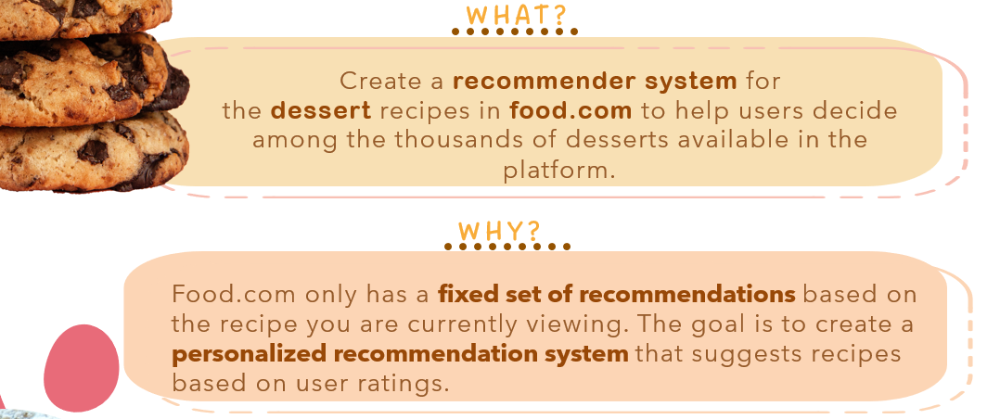

<span style="font-size: 12px">
    <center>Figure 1. Overview of the Problem</center>
</span>

# Motivation

Currently, food.com has a fixed set of recommendations based on the current recipe that a user is viewing. With the thousands of recipes available on the platform, users will benefit from a system that recommends recipes based on the previous recipes that a user has rated well.  For beginners, recommending similar recipes will help them achieve mastery of a certain type of dish instead of doing a mediocre job on a wide variety of dishes. This is especially true for desserts since they are known to have a higher learning curve compared to other types of dishes. Recommending the correct recipes makes them more likely to continue cooking and in turn, continue visiting the website. Recommended recipes with similar ingredients also help in managing stock and reducing spoilage. More importantly, such systems help in increasing website traffic and user engagement by minimizing the user's search fatigue—showing users what they want to see with minimal effort on their part. The less time users spend on searching, the more time they can allot to writing reviews, posting comments in the forums, and trying out the website's lesser-known features.

The choice of focus is intentional. Recommender systems work best when there is high variability in the recommendable items in the system. This makes it more challenging to create such systems in niche-specific applications. The team wanted to modify the usual algorithms in recommender systems to include clustering techniques. The effect of the modification will not be apparent if the data already performs well for vanilla implementations.

There is no difference between recommender systems for food recipes and recommender systems for food orders. Naturally, this work can be extended to dessert e-commerce shops. The team was able to identify two local shops that will benefit greatly from a recommender system: Kukido [5] and Lacher Patisserie [6]. Both stores have an e-commerce platform, but they do not provide customized product recommendations to their users. Instead, they only display their monthly best sellers. This is a missed opportunity for returning customers who have a hard time deciding what else to buy. Having personalized recommendations will improve user experience and increase the companies' sales.

# Data Source

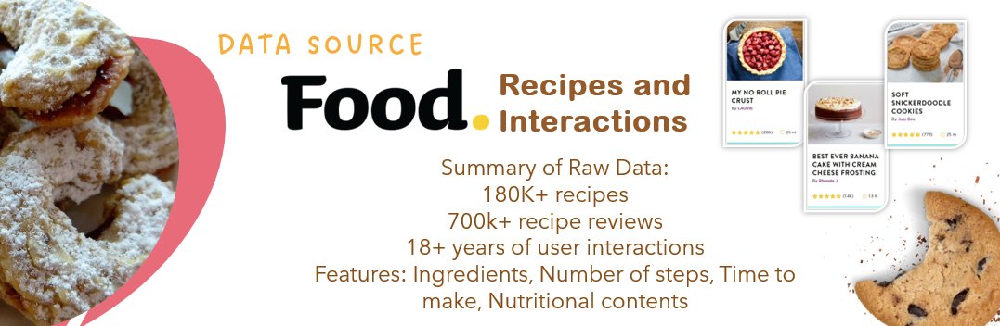

<span style="font-size: 12px">
    <center>Figure 2. Overview of the Data Source</center>
</span>

The dataset comes from a Kaggle dataset of scraped recipes and user interactions from food.com. The dataset is available in the jojie public dataset repository.

**Filepath:** /mnt/data/public/food-com-recipes

**Dataset Summary:**
- 180K+ recipes
- 700k+ recipe reviews
- 18+ years of user interactions

**Original Data Source:**
This dataset consists of 180K+ recipes and 700K+ recipe reviews covering 18 years of user interactions and uploads on Food.com (formerly GeniusKitchen). It was used in the following paper:

Generating Personalized Recipes from Historical User Preferences <br>
Bodhisattwa Prasad Majumder*, Shuyang Li*, Jianmo Ni, Julian McAuley <br>
EMNLP, 2019 <br>
https://www.aclweb.org/anthology/D19-1613/

The dataset can be downloaded from Kaggle: https://www.kaggle.com/datasets/shuyangli94/food-com-recipes-and-user-interactions

**Content:**
This dataset contains three sets of data from Food.com:

**Interaction Splits:**
- interactions_test.csv
- interactions_validation.csv
- interactions_train.csv

**Preprocessed data for result reproduction:**

In this format, the recipe text metadata is tokenized via the GPT subword tokenizer with start-of-step, etc. tokens.

- PP_recipes.csv
- PP_users.csv

**Raw data:**
- RAW_interactions.csv
- RAW_recipes.csv

<h3><u>PP_Recipes Dataset</u></h3>

- This dataset contains the preprocessed data for recipes.


<h3><u>PP_users Dataset</u></h3>

- This dataset contains the preprocessed data for user information.

<h3><u>RAW_interactions Dataset</u></h3>

- This dataset contains the raw data for interactions.


<h3><u>RAW_recipes Dataset</u></h3>

- This dataset contains the raw data for recipes.

<h3><u>interactions_test Dataset</u></h3>

- This dataset contains the test split for recipe interactions ("reviews").

<h3><u>interactions_train Dataset</u></h3>

- This dataset contains the training split for recipe interactions ("reviews").


<h3><u>interactions_validation Dataset</u></h3>

- This dataset contains the validation split for recipe interactions ("reviews")

<br />

# Data Exploration

<span style="font-size: 16px">
    <center><b><u>Raw Data Description</u></b></center>
</span>

<span style="font-size: 16px">
    <center><b>Table 1. PP_Recipes Raw Data Description</b></center>
</span>
    
<center>Rows: 178,265<br>
Columns: 8<br>
No Null Values</center>
    
|<center>Variable Name</center>|<center>Data type</center>|<center>Variable Caterogy</center>|<center>Description</center>
|:---|:---|:---|:---|
|id|integer|nominal|Recipe ID
|i|integer|nominal|Recipe ID mapped to contiguous integers from 0
|name_tokens|object|list(string)|BPE-tokenized recipe name
|ingredient_tokens|object|list(string)|BPE-tokenized ingredients list (list of lists)
|steps_tokens|integer|list(string)|BPE-tokenized steps
|techniques|integer|list(string)|List of techniques used in recipe
|calorie_level|integer|categorical|Calorie level in ascending order
|ingredient_ids|object|list(string)|IDs of ingredients in recipe



|       |     id |        i |   calorie_level |
|:------|-------:|---------:|----------------:|
| count | 178265 | 178265   |   178265        |
| mean  | 213462 |  89132   |        0.863192 |
| std   | 138267 |  51460.8 |        0.791486 |
| min   |     38 |      0   |        0        |
| 25%   |  94576 |  44566   |        0        |
| 50%   | 196312 |  89132   |        1        |
| 75%   | 320562 | 133698   |        2        |
| max   | 537716 | 178264   |        2        |

<span style="font-size: 16px">
    <center><b>Table 2. PP_Users Raw Data Description</b></center>
</span>
    
<center>Rows: 25,076<br>
Columns: 6<br>
No Null Values</center>

|<center>Variable Name</center>|<center>Data type</center>|<center>Variable Category</center>|<center>Description</center>
|:---|:---|:---|:---|
|u|integer|ordinal|User ID mapped to contiguous integer sequence from 0
|techniques|object|list(string)|Cooking techniques encountered by user
|items|object|list(string)|Recipes interacted with, in order
|n_items|integer|nominal|Number of recipes reviewed
|ratings|object|list(string)|Ratings given to each recipe encountered by this user
|n_ratings|integer|nominal|Number of ratings in total



|       |        u |    n_items |   n_ratings |
|:------|---------:|-----------:|------------:|
| count | 25076    | 25076      |  25076      |
| mean  | 12537.5  |    27.8713 |     27.8713 |
| std   |  7238.96 |   122.729  |    122.729  |
| min   |     0    |     2      |      2      |
| 25%   |  6268.75 |     3      |      3      |
| 50%   | 12537.5  |     6      |      6      |
| 75%   | 18806.2  |    16      |     16      |
| max   | 25075    |  6437      |   6437      |

<span style="font-size: 16px">
    <center><b>Table 3. RAW_Interactions Raw Data Description</b></center>
</span>

<center>Rows: 1,132,367<br>
Columns: 5<br>
review: 169 null values</center>

|<center>Variable Name</center>|<center>Data type</center>|<center>Variable Category</center>|<center>Description</center>
|:---|:---|:---|:---|
|user_id|integer|nominal|User ID
|recipe_id|integer|nominal|Recipe ID
|date|string|string|Date of interaction
|rating|integer|nominal|Rating given
|review|string|string|Review text



|       |          user_id |        recipe_id |      rating |
|:------|-----------------:|-----------------:|------------:|
| count |      1.13237e+06 |      1.13237e+06 | 1.13237e+06 |
| mean  |      1.38429e+08 | 160897           | 4.41102     |
| std   |      5.01427e+08 | 130399           | 1.26475     |
| min   |   1533           |     38           | 0           |
| 25%   | 135470           |  54257           | 4           |
| 50%   | 330937           | 120547           | 5           |
| 75%   | 804550           | 243852           | 5           |
| max   |      2.00237e+09 | 537716           | 5           |

<span style="font-size: 16px">
    <center><b>Table 4. RAW_Recipes Raw Data Description</b></center>
</span>

<center>Rows: 231,637<br>
Columns: 12<br>
name: 1 null value<br>
description: 4,979 null values</center>

|<center>Variable Name</center>|<center>Data type</center>|<center>Variable Category</center>|<center>Description</center>
|:---|:---|:---|:---|
|name|string|string|Recipe name
|id|integer|nominal|Recipe ID
|minutes|integer|nominal|Minutes to prepare recipe
|contributor_id|integer|nominal|User ID who submitted this recipe
|submitted|string|string|Date recipe was submitted
|tags|object|list(string)|Food.com tags for recipe
|nutrition|object|list(string)|Nutrition information
|n_steps|integer|nominal|Number of steps in recipe
|steps|object|list(string)|Text for recipe steps, in order
|description|string|string|User-provided description



|       |     id |          minutes |   contributor_id |      n_steps |   n_ingredients |
|:------|-------:|-----------------:|-----------------:|-------------:|----------------:|
| count | 231637 | 231637           | 231637           | 231637       |    231637       |
| mean  | 222015 |   9398.55        |      5.53489e+06 |      9.7655  |         9.05115 |
| std   | 141207 |      4.46196e+06 |      9.97914e+07 |      5.99513 |         3.7348  |
| min   |     38 |      0           |     27           |      0       |         1       |
| 25%   |  99944 |     20           |  56905           |      6       |         6       |
| 50%   | 207249 |     40           | 173614           |      9       |         9       |
| 75%   | 333816 |     65           | 398275           |     12       |        11       |
| max   | 537716 |      2.14748e+09 |      2.00229e+09 |    145       |        43       |

<span style="font-size: 16px">
    <center><b>Table 5. Interactions_test Raw Data Description</b></center>
</span>

<center>Rows: 12,455<br>
Columns: 6<br>
No Null Values</center>

|<center>Variable Name</center>|<center>Data type</center>|<center>Variable Category</center>|<center>Description</center>
|:---|:---|:---|:---|
|user_id|string|nominal|User ID
|recipe_id|integer|nominal|Recipe ID
|date|string|string|Date of interaction
|rating|float|nominal|Rating given
|u|integer|nominal|User ID, mapped to contiguous integers from 0
|i|integer|nominal|Recipe ID, mapped to contiguous integers from 0



|       |          user_id |   recipe_id |      rating |        u |        i |
|:------|-----------------:|------------:|------------:|---------:|---------:|
| count |  12455           |       12455 | 12455       | 12455    |  12455   |
| mean  |      2.91269e+07 |      209323 |     4.21309 | 12288.5  | 115488   |
| std   |      2.33436e+08 |      135002 |     1.3385  |  6897.75 |  50448.7 |
| min   |   1533           |         120 |     0       |     2    |    102   |
| 25%   | 169842           |       94616 |     4       |  6428.5  |  76904   |
| 50%   | 382954           |      195040 |     5       | 12023    | 127793   |
| 75%   | 801637           |      314928 |     5       | 17985.5  | 160024   |
| max   |      2.00225e+09 |      537716 |     5       | 25074    | 178264   |

<span style="font-size: 16px">
    <center><b>Table 6. Interactions_train Raw Data Description</b></center>
</span>

<center>Rows: 698,901<br>
Columns: 6<br>
No Null Values</center>

|<center>Variable Name</center>|<center>Data type</center>|<center>Variable Category</center>|<center>Description</center>
|:---|:---|:---|:---|
|user_id|string|nominal|User ID
|recipe_id|integer|nominal|Recipe ID
|date|string|string|Date of interaction
|rating|float|nominal|Rating given
|u|integer|nominal|User ID, mapped to contiguous integers from 0
|i|integer|nominal|Recipe ID, mapped to contiguous integers from 0


 
|       |          user_id |   recipe_id |        rating |         u |        i |
|:------|-----------------:|------------:|--------------:|----------:|---------:|
| count | 698901           |      698901 | 698901        | 698901    | 698901   |
| mean  |      1.24769e+07 |      156173 |      4.57409  |   4249.33 |  87519.3 |
| std   |      1.52503e+08 |      126595 |      0.959022 |   5522.6  |  51290.4 |
| min   |   1533           |          38 |      0        |      0    |      0   |
| 25%   | 105988           |       53169 |      4        |    455    |  42988   |
| 50%   | 230102           |      116484 |      5        |   1737    |  87424   |
| 75%   | 480195           |      234516 |      5        |   5919    | 131731   |
| max   |      2.00231e+09 |      537458 |      5        |  25075    | 178262   |


<span style="font-size: 16px">
    <center><b>Table 7. Interactions_validation Raw Data Description</b></center>
</span>

<center>Rows: 7,023<br>
Columns: 6<br>
No Null Values</center>

|<center>Variable Name</center>|<center>Data type</center>|<center>Variable Category</center>|<center>Description</center>
|:---|:---|:---|:---|
|user_id|string|nominal|User ID
|recipe_id|integer|nominal|Recipe ID
|date|string|string|Date of interaction
|rating|float|nominal|Rating given
|u|integer|nominal|User ID, mapped to contiguous integers from 0
|i|integer|nominal|Recipe ID, mapped to contiguous integers from 0



|       |          user_id |   recipe_id |     rating |       u |        i |
|:------|-----------------:|------------:|-----------:|--------:|---------:|
| count |   7023           |      7023   | 7023       |  7023   |   7023   |
| mean  |      1.94779e+07 |    206406   |    4.23281 | 10298   | 100122   |
| std   |      1.90469e+08 |    135238   |    1.30291 |  6709.5 |  52051.1 |
| min   |   1533           |       120   |    0       |     5   |    144   |
| 25%   | 159119           |     89851.5 |    4       |  4569.5 |  56227   |
| 50%   | 352834           |    192146   |    5       |  9248   | 104819   |
| 75%   | 737332           |    311632   |    5       | 15637.5 | 146690   |
| max   |      2.00223e+09 |    536464   |    5       | 25055   | 178263   |

<span style="font-size: 16px">
    <center><b><u>Final Data Description</u></b></center>
</span>

<span style="font-size: 16px">
    <center><b>Table 8. User Rating Data Description</b></center>
</span>
    
<center>
Matrix Type: Sparse<br>
Rows: 927 Users<br>
Columns: 4557 Recipe Profiles<br>
No Null Values</center>

<span style="font-size: 16px">
    <center><b>Table 9. Recipe Profile Data Description</b></center>
</span>
    
<center>
Matrix Type: Sparse<br>
Rows: 4557 Profiles <br>
Columns: 50 Features<br>
No Null Values</center>

### Loading Recipe Data

In [4]:
pd.read_csv('./RAW_recipes.csv',
            index_col='id').head(5)

,name,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients
id,,,,,,,,,,,
137739,arriba baked winter squash mexican style,55,47892,2005-09-16,"['60-minutes-or-less', 'time-to-make', 'course...","[51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0]",11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7
31490,a bit different breakfast pizza,30,26278,2002-06-17,"['30-minutes-or-less', 'time-to-make', 'course...","[173.4, 18.0, 0.0, 17.0, 22.0, 35.0, 1.0]",9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6
112140,all in the kitchen chili,130,196586,2005-02-25,"['time-to-make', 'course', 'preparation', 'mai...","[269.8, 22.0, 32.0, 48.0, 39.0, 27.0, 5.0]",6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13
59389,alouette potatoes,45,68585,2003-04-14,"['60-minutes-or-less', 'time-to-make', 'course...","[368.1, 17.0, 10.0, 2.0, 14.0, 8.0, 20.0]",11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11
44061,amish tomato ketchup for canning,190,41706,2002-10-25,"['weeknight', 'time-to-make', 'course', 'main-...","[352.9, 1.0, 337.0, 23.0, 3.0, 0.0, 28.0]",5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8


<span style="font-size: 12px">
    <center>Table 10. Unprocessed Recipe Information Dataset Sample</center>
</span>

### Loading User Rating Data

In [5]:
pd.read_csv('./RAW_interactions.csv', index_col='user_id').head(5)

,recipe_id,date,rating,review
user_id,,,,
38094,40893,2003-02-17,4,Great with a salad. Cooked on top of stove for...
1293707,40893,2011-12-21,5,"So simple, so delicious! Great for chilly fall..."
8937,44394,2002-12-01,4,This worked very well and is EASY. I used not...
126440,85009,2010-02-27,5,I made the Mexican topping and took it to bunk...
57222,85009,2011-10-01,5,"Made the cheddar bacon topping, adding a sprin..."


<span style="font-size: 12px">
    <center>Table 11. Unprocessed User Rating Dataset Sample</center>
</span>

<h3 style="color:#000000">Data Pre-Processing</h3>

Several pre-processing steps were undertaken to achieve the desired item profile matrix and utility matrix to be used in the recommender system:

+ The item profile matrix was scaled per feature.
+ The utility matrix was mean-centered per user. This is to factor out the differences in the users' perception of a 3-star rating or a 4-star rating.
+ Included data from 2008 onwards.
+ Included only quick desserts (< 90mins to make).
+ Included only users with more than 5 ratings.


In [117]:
# filter foods tagged as dessert
df = pd.read_csv('./RAW_recipes.csv', index_col='id')
cols = ['minutes', 'tags', 'nutrition', 'n_steps', 'ingredients']
df_dessert = df.loc[df['tags'].str.contains("dessert", case=False)][cols]
df_dessert = df_dessert.loc[(df['minutes'] <= 90) & (df['n_steps'] <= 7)]

# Store id vs name of dessert
df_name = df.loc[df['tags'].str.contains("dessert", case=False)][['name']]

# Extracting columns from nutrition list
df_dessert['nutrition'] = df_dessert['nutrition'].apply(ast.literal_eval) 
df_dessert['ingredients'] = df_dessert['ingredients'].apply(ast.literal_eval)
df_dessert['ingredients'] = [', '.join(map(str, l)) \
                             for l in df_dessert['ingredients']]
col_nutri = ['calories', 'total_fat', 'sugar_pvd', 'sodium_pvd',
             'protein_pvd', 'sat_fat_pvd', 'carbs_pvd']
df_nutri = pd.DataFrame(df_dessert['nutrition'].to_list(), columns=col_nutri,
                        index=df_dessert.index)
df_dessert2 = df_dessert.join(df_nutri).drop(['nutrition', 'tags'], axis=1)

# Extracting columns from ingredient's list then onehot encode ingredients
tfidf = TfidfVectorizer(
    analyzer=lambda d: d.split(', '),
    stop_words='english',
    max_df=0.9,
    min_df=0.03
)
ingredients = tfidf.fit_transform(df_dessert2['ingredients'])
df_recipe = pd.DataFrame(ingredients.todense(),
                         columns=tfidf.get_feature_names_out(),
                         index=df_dessert.index)
df_dessert3 = df_dessert2.join(df_recipe).drop('ingredients', axis=1)
df_dessert_all = df_dessert3.drop(index=46942)

In [7]:
# Store recipe id's from our items profile
food_list = df_dessert_all.index.tolist()

# Load Raw Interactions Dataset
file_path = './RAW_interactions.csv'
df_pp_recipes = pd.read_csv(file_path)

# Parse dates from string to datetime
df_pp_recipes['date'] = pd.to_datetime(df_pp_recipes['date'],
                                       format='%Y-%m-%d')

# Filter users who rated from 2012 to 2018
filtered_df = df_pp_recipes.loc[(df_pp_recipes['date'] >= '2008-01-01')]
# filtered_df = df_pp_recipes.copy()

# Filter users who rated for items in the items profile
filtered_df = filtered_df[filtered_df['recipe_id'].isin(food_list)]
filtered_df = filtered_df[filtered_df.groupby('user_id')['user_id']\
                          .transform('size') >= 5]

# Create utility matrix
df_user_ratings = pd.pivot_table(filtered_df,
                                values='rating',
                                index='user_id',
                                columns='recipe_id')

df_user_ratings

recipe_id,124,128,281,345,352,355,387,407,520,779,...,515888,516300,517744,519541,521251,527687,528546,532655,532736,532740
user_id,,,,,,,,,,,,,,,,,,,,,
1535,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4470,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4740,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1803786474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000431901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001102678,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<span style="font-size: 12px">
    <center>Table 12. Final User Profile Dataset</center>
</span>

In [8]:
# Filtering recipes matrix to retain only items rated by users
rated_items = (df_user_ratings.columns.tolist())
df_dessert_final = df_dessert_all.loc[df_dessert_all.index.isin(rated_items)]
df_dessert_final

,minutes,n_steps,calories,total_fat,sugar_pvd,sodium_pvd,protein_pvd,sat_fat_pvd,carbs_pvd,all-purpose flour,...,shortening,sour cream,sugar,sweetened condensed milk,vanilla,vanilla extract,vegetable oil,walnuts,water,white sugar
id,,,,,,,,,,,,,,,,,,,,,
23933,15,4,232.7,21.0,77.0,4.0,6.0,38.0,8.0,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
67664,10,3,164.6,3.0,5.0,1.0,4.0,6.0,11.0,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
40237,40,7,2252.6,130.0,802.0,101.0,44.0,54.0,117.0,0.000000,...,0.0,0.0,0.228796,0.0,0.280123,0.000000,0.499522,0.000000,0.362322,0.000000
124286,35,5,3987.2,245.0,1306.0,260.0,106.0,369.0,205.0,0.000000,...,0.0,0.0,0.246249,0.0,0.301491,0.000000,0.000000,0.000000,0.389961,0.000000
118843,20,3,5286.9,427.0,1630.0,159.0,163.0,656.0,224.0,0.000000,...,0.0,0.0,0.000000,0.0,0.241829,0.000000,0.000000,0.000000,0.000000,0.408645
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26525,55,7,305.9,26.0,102.0,8.0,7.0,12.0,11.0,0.000000,...,0.0,0.0,0.211417,0.0,0.258845,0.000000,0.461579,0.414826,0.000000,0.000000
243190,90,7,569.5,51.0,139.0,19.0,14.0,23.0,20.0,0.000000,...,0.0,0.0,0.212637,0.0,0.260339,0.000000,0.000000,0.000000,0.000000,0.000000
18693,80,7,310.2,25.0,96.0,10.0,7.0,28.0,13.0,0.000000,...,0.0,0.0,0.193680,0.0,0.237129,0.000000,0.422854,0.380023,0.000000,0.000000


<span style="font-size: 12px">
    <center>Table 13. Final Item Profile Dataset</center>
</span>

<h3 style="color:#000000">Insights from the Data</h3>

<span style="font-size: 18px">
    The most common ingredients in desserts are <b>Brown Sugar</b> and <b>Baking Soda</b>.
</span>

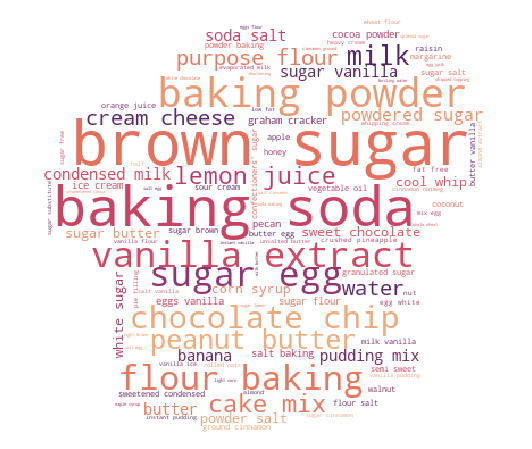

In [9]:
text_list = df_dessert['ingredients'].to_list()
text = ''.join(text_list)

mask = np.array(Image.open("chef.png"))

wc = WordCloud(width = 3000, height = 2000, random_state=1,
               max_words = 100, max_font_size = 500,
               background_color='white', colormap='flare',
               stopwords = STOPWORDS, mask=mask)
wc.generate(text)

plt.figure( figsize=(16,8))
plt.imshow(wc, interpolation="None")
plt.axis('off')
plt.show()

<span style="font-size: 12px">
    <center>Figure 3. Wordcloud of the Ingredients of the Desserts</center>
</span>

<span style="font-size: 18px">
    The most common dessert names are those with <b>Chocolate</b> and <b>Apple</b>. <br>
    While <b>Cake</b> and <b>Cookie</b> are the most common dessert type.
</span>

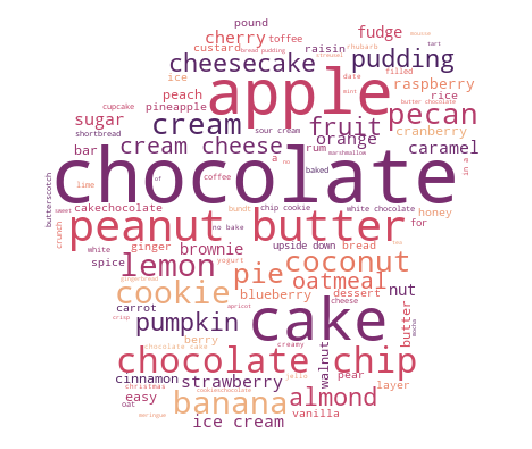

In [10]:
text_list = df_name['name'].to_list()
text = ''.join(text_list)

mask = np.array(Image.open("chef.png"))
STOPWORDS = ['S', 'and', 'or', 'with']
wc = WordCloud(width = 3000, height = 2000, random_state=1,
               max_words = 100, max_font_size = 500,
               background_color='white', colormap='flare',
               stopwords = STOPWORDS, mask=mask)
wc.generate(text)

plt.figure( figsize=(16,8))
plt.imshow(wc, interpolation="None")
plt.axis('off')
plt.show()

<span style="font-size: 12px">
    <center>Figure 4. Wordcloud of the Dessert Names</center>
</span>

<span style="font-size: 18px">
    <b>10,012</b> ratings are <b>5.0</b> which is <b>76%</b> of the total rows.
</span>

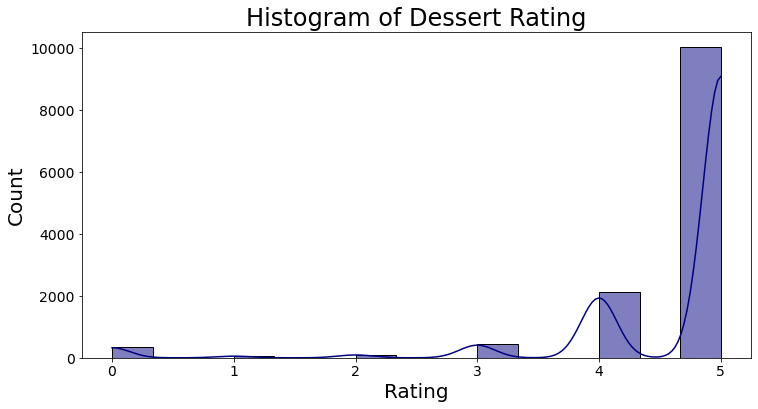

In [11]:
a4_dims = (12, 6)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sns.histplot(data=filtered_df,
             x='rating',
             kde=True,
             color='navy',)
 
plt.xlabel("Rating", fontsize = 20)
plt.ylabel("Count", fontsize = 20)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.title("Histogram of Dessert Rating", fontsize = 24);

<span style="font-size: 12px">
    <center>Figure 5. Histogram of the Dessert Ratings</center>
</span>

<span style="font-size: 18px">
    <b>3,372</b> items have only <b>one</b> rating which is <b>59%</b> of the total dataset.
</span>

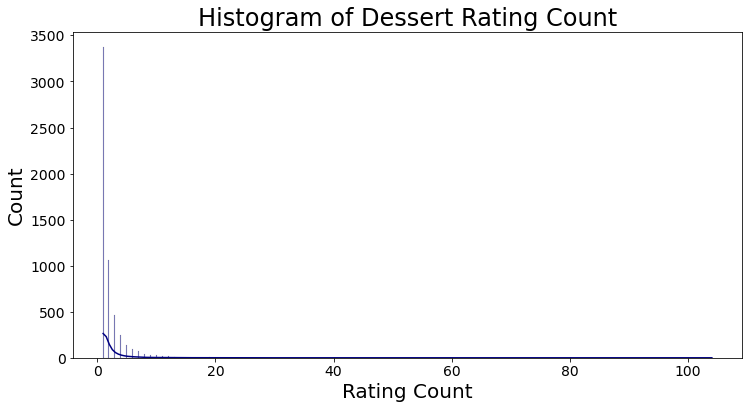

In [12]:
count = filtered_df.groupby('recipe_id')['rating'].count()\
                                                .sort_values(ascending=False)

a4_dims = (12, 6)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sns.histplot(data=count.reset_index(),
             x='rating',
             kde=True,
             color='navy',)
 
plt.xlabel("Rating Count", fontsize = 20)
plt.ylabel("Count", fontsize = 20)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.title("Histogram of Dessert Rating Count", fontsize = 24);

<span style="font-size: 12px">
    <center>Figure 6. Histogram of the Dessert Rating Count</center>
</span>

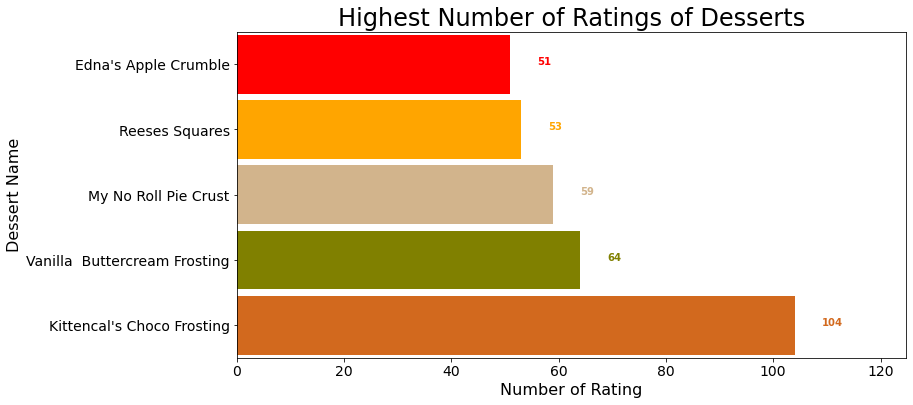

In [13]:
labels = ["Kittencal's Choco Frosting",
          'Vanilla  Buttercream Frosting',
          'My No Roll Pie Crust',
          'Reeses Squares',
          "Edna's Apple Crumble"]
colors = ['chocolate', 'olive', 'tan', 'orange', 'red']
values = count[:5].values

height = 0.9
plt.figure(figsize=(12, 6))
plt.barh(y=labels, width=values, height=height, color=colors, align='center')
plt.xlim(0, max(values) * 1.2)
plt.ylim(-0.5, len(labels) - 0.5)
for i, v in enumerate(values):
    plt.text(v+5, i, str(v), color=colors[i], fontweight='bold')
plt.title('Highest Number of Ratings of Desserts',
          fontdict={'fontsize': 24,
                  'verticalalignment': 'baseline'})
plt.xlabel("Number of Rating", fontsize=16)
plt.ylabel("Dessert Name", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.show()

<span style="font-size: 12px">
    <center>Figure 7. Bar Plot of the Desserts with Highest Number of Ratings</center>
</span>

# Methodology

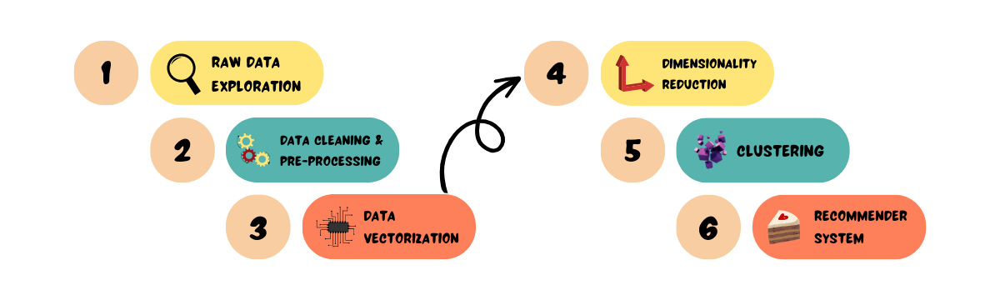

<span style="font-size: 12px">
    <center>Figure 8. Overview of the Methodology</center>
</span>

## Methodology Pipeline

**1. Raw Data Exploration**
  - Examine data structure and characteristics
  - Check for null data
  - Check for unwanted outliers
  
**2. Data Cleaning and Preprocessing**
  - Perform null value imputation
  - Perform removal of duplicate data
  - Filter the `user` data to:
    * Users who rated from 2009 to 2018
    * Users who rated 5 or more items
  - Filter the `recipe` data to:
    * Recipes that have been rated by the selected users.
  
**3. Data Vectorization**
  - Vectorize `recipe` data using TF-IDF vectorizer to convert the recipes into features.
  
**4. Dimensionality Reduction**
  - Perform dimensionality reduction by Singular Vector Decomposition (SVD) on `user` data.
  - Perform dimensionality reduction by Singular Vector Decomposition (SVD) on `recipe` data.

**5. Clustering**
  - Perform various clustering techniques on `user` data.
    * Representative-based clustering
      - K-means
      - K-medoids
    * Agglomerative clustering
      - Single Linkage
      - Average Linkage
      - Complete Linkage
      - Ward's Linkage
    * Density-based clustering
      - DBSCAN
      - OPTICS
    * Probabilistic clustering
      - Gaussian Mixture
  - Perform various clustering techniques on `recipe` data.
    * Representative-based clustering
      - K-means
      - K-medoids
    * Agglomerative clustering
      - Single Linkage
      - Average Linkage
      - Complete Linkage
      - Ward's Linkage
    * Density-based clustering
      - DBSCAN
      - OPTICS
    * Probabilistic clustering
      - Gaussian Mixture
      
**6. Recommender System**
  - Create a recommender system using various collaborative filtering methods.
    * User-based Collaborative Filtering
    * Item-based Collaborative Filtering
    * Latent Factor-based Collaborative Filtering
  - Generating User-cluster-specific recommendations
    * For Cluster 0
    * For Cluster 1
  - Generate Item-cluster-specific recommendations
    * For cluster 0
    * For Cluster 1
  - Generate recommendations based on user preference
  - Comparison of Evaluation Metrics
    * Error Score (RMSE, MSE)
    * Coverage SCore
    * Novelty Score
    * Personalization Score
    * Intra-list Similarity Score
    * Metrics Radar Plot Summary
  - Recommendation for clustered users and Items

# Main Body

Although it is possible to cluster the data using various clustering techniques at the onset, it is highly recommended to perform dimensionality reduction to reduce computational complexity. It is possible to get away with decent results without performing dimensionality reduction, however, this is not the case for data of high dimensionality. This is what we call the curse of dimensionality, a phenomenon that leads to poor clustering performance.

In this specific context, we perform Singular Vector Decomposition (SVD) to both the user data and the recipe data. The choice of dimensionality reduction technique will depend on the nature of the data, in this case, however, SVD is more fitting, especially when data is sparse.

## Dimensionality Reduction

We then check the number of singular vectors to retain if we want to preserve at least 80% of the information. This can be measured by the cumulative variance explained. Refer to the plot below.

### Users Ratings

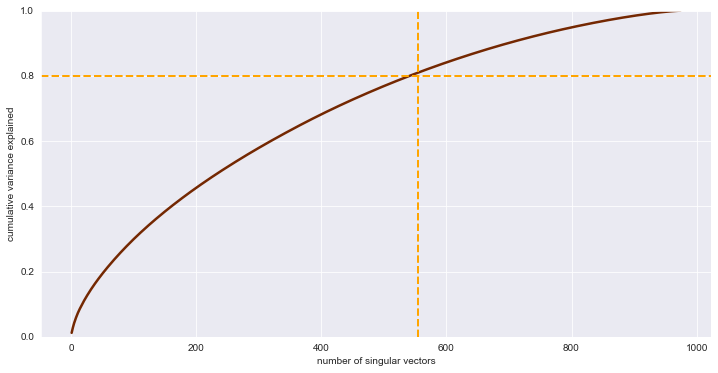

In [14]:
# 
sns.set_style({'axes.grid' : False})
palette = sns.color_palette('flare')
sns.set_style('darkgrid')
# sns.set(rc={'figure.figsize': (20, 6)})

# Perform SVD (untruncated)
df_user_rating_0 = df_user_ratings.fillna(-1)
df_user_rating_0

# Scaling Dataset

standard_scaler = StandardScaler()
X_user = standard_scaler.fit_transform(df_user_rating_0.T).T

n_components = len(df_user_rating_0.columns)-1
svd_user = TruncatedSVD(n_components=n_components, random_state=1337)
X_svd_user = svd_user.fit_transform(X_user)
variance_explained_user = svd_user.explained_variance_ratio_
p_svd_user = svd_user.components_

# Plotting the cumulative variance explained
fig, ax = plt.subplots(figsize=(12, 6))
plt.plot(range(1, len(variance_explained_user)+1), 
         variance_explained_user.cumsum(), '-', c='xkcd:chestnut',
         linewidth=2.5)
plt.ylim(0,1)
plt.xlabel('number of singular vectors')
plt.ylabel('cumulative variance explained')
plt.axhline(y=0.8, color='orange', linestyle='--', linewidth=2)
plt.axvline(x=np.where(variance_explained_user.cumsum() > 0.81)[0][0],
            color='orange', linestyle='--', linewidth=2);

<span style="font-size: 12px">
    <center>Figure 9. Line Graph of the Explained Variance per Singular Vectors Retained for User Profile</center>
</span>

By plotting the first two Singular Vectors, we can visualize what the data looks like in two-dimensional space. Normally, the first two singular vectors should contain most of the information, but in this case, the first two singular vectors only represent approximately **2%** of the information.

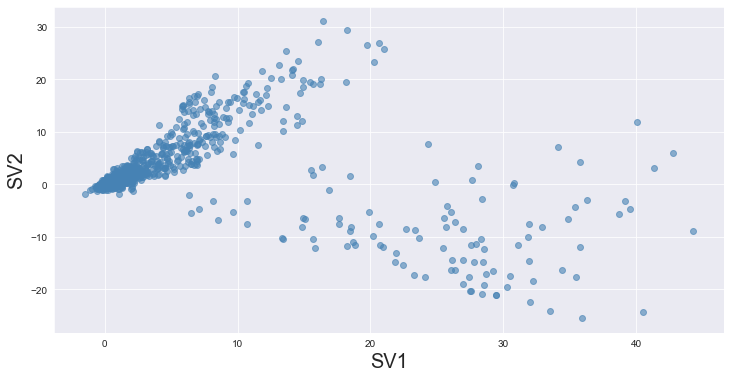

In [15]:
# Perform TruncatedSVD

component_user = np.where(variance_explained_user.cumsum() > 0.8)[0][0]
svd_user = TruncatedSVD(n_components=component_user, random_state=1337)
X_svd_user = svd_user.fit_transform(X_user)

# Plotting the first two Singular Vectors
fig, ax = plt.subplots(figsize=(12, 6))
plt.scatter(X_svd_user[:,0], X_svd_user[:,1], c='steelblue', alpha=0.6)
plt.xlabel('SV1', size=20)
plt.ylabel('SV2', size=20);

<span style="font-size: 12px">
    <center>Figure 10. Scatter Plot of the User Profile Projected to the First Two Singular Vectors</center>
</span>

Next, we plot the most important features of the first five singular vectors. By doing so, we can visualize the contributions of each feature to the overall information contained in the dataset.

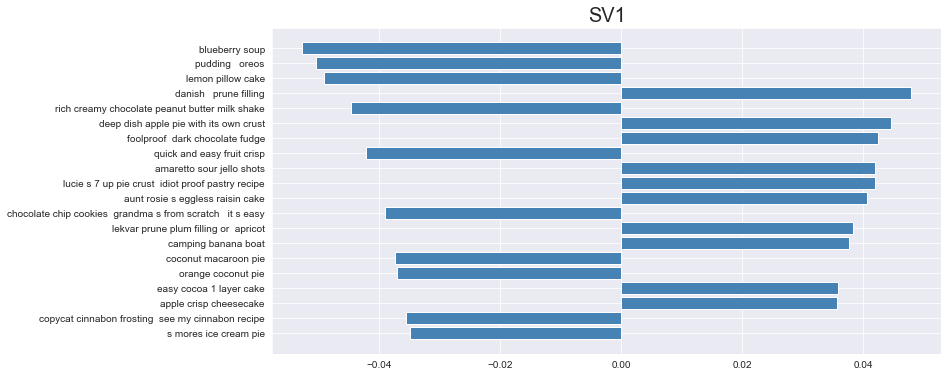

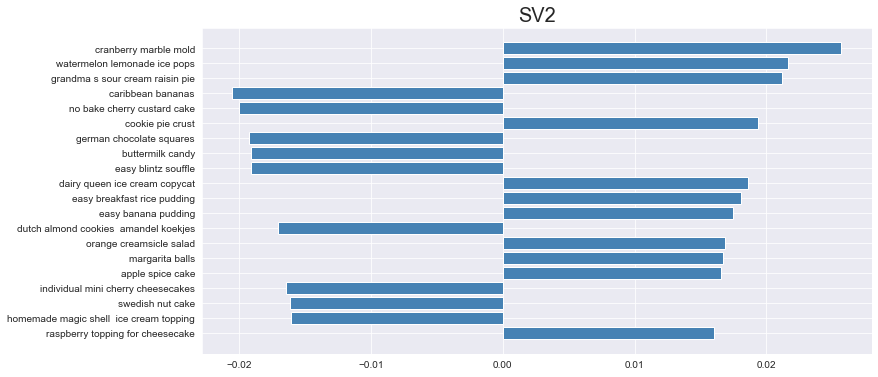

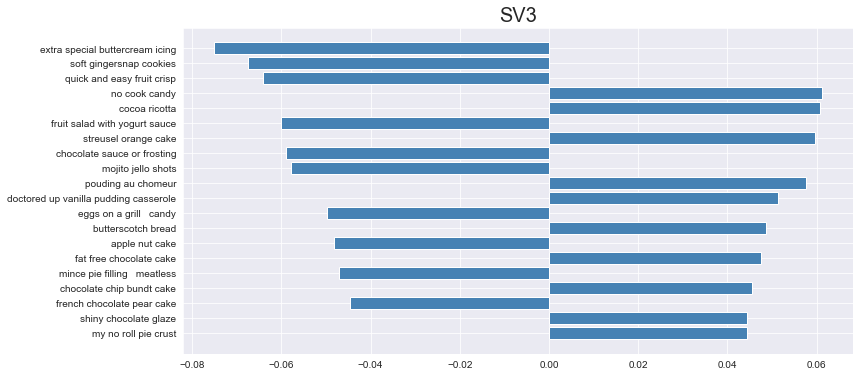

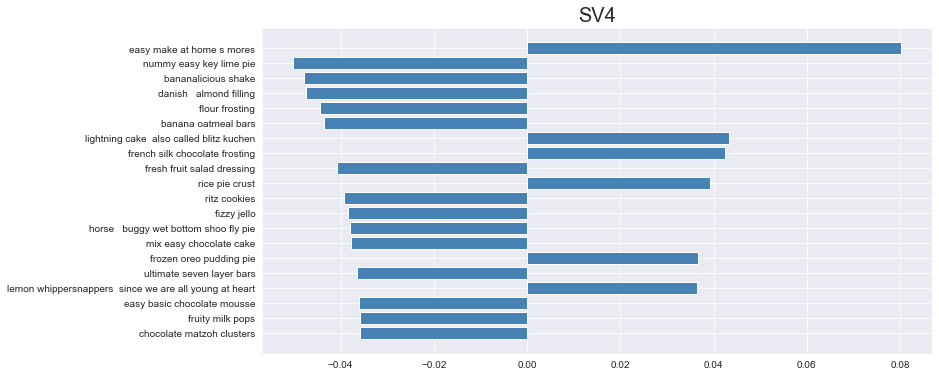

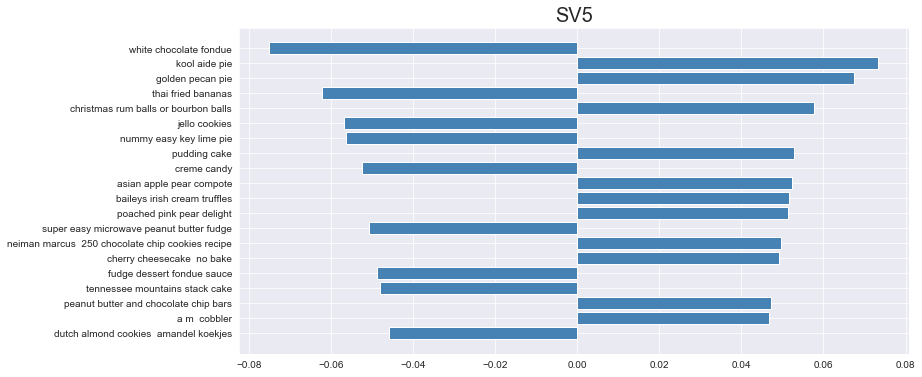

In [16]:

feature_names = df_user_ratings.columns
for i in range(5):
    fig, ax = plt.subplots(figsize=(12, 6))
    order = np.argsort(np.abs(p_svd_user[:, i]))[-20:]
    ax.barh([df_name.loc[feature_names[o]][0] for o in order],
            p_svd_user[order, i], color='steelblue')
    ax.set_title(f'SV{i+1}', size=20)

<span style="font-size: 12px">
    <center>Figure 11. Bar Plot of the Top 20 Important User Features of the First Five Singular Vectors</center>
</span>

### Recipe

Again, we perform Singular Vector Decomposition, but this time, we apply it to the recipe dataset. We also decided to retain at least 80% of the information which is about 31 singular vectors.

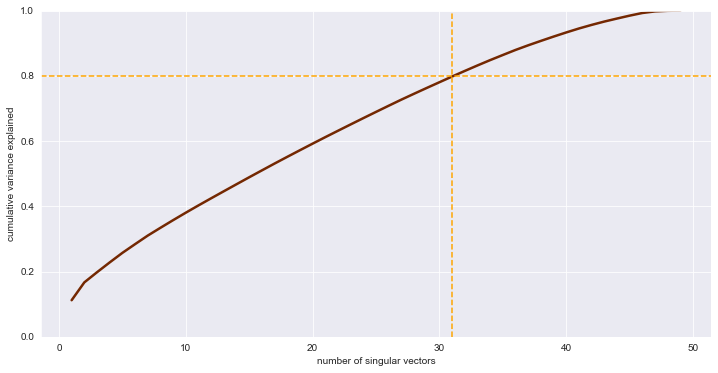

In [17]:
# Perform SVD (untruncated)

# Scaling Dataset
standard_scaler = StandardScaler()
X_item = standard_scaler.fit_transform(df_dessert_final)

n_components = len(df_dessert_final.columns)-1
svd_item = TruncatedSVD(n_components=n_components, random_state=1337)
X_svd_item = svd_item.fit_transform(X_item)
variance_explained_item = svd_item.explained_variance_ratio_
p_svd_item = svd_item.components_

# Plotting the cumulative variance explained
fig, ax = plt.subplots(figsize=(12, 6))
plt.plot(range(1, len(variance_explained_item)+1), 
         variance_explained_item.cumsum(), '-', c='xkcd:chestnut',
         linewidth=2.5)
plt.ylim(0,1)
plt.xlabel('number of singular vectors')
plt.ylabel('cumulative variance explained')
plt.axhline(y = 0.8, color = 'orange', linestyle = '--')
plt.axvline(x = np.where(variance_explained_item.cumsum() > 0.81)[0][0],
            color = 'orange', linestyle = '--');

<span style="font-size: 12px">
    <center>Figure 12. Line Graph of the Explained Variance per Singular Vectors Retained for Item Profile</center>
</span>

For purposes of visualization, we plot the first two singular vectors, this equates to about 17% of the information. Again, this plot does not capture the true nature of the data.

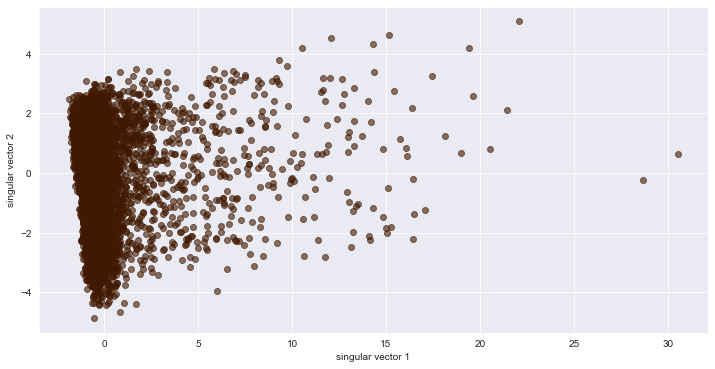

In [18]:
# Perform TruncatedSVD
component_item = np.where(variance_explained_item.cumsum() > 0.8)[0][0]
svd_item = TruncatedSVD(n_components=component_item, random_state=1337)
X_svd_item = svd_item.fit_transform(X_item)

# Plotting the first two Singular Vectors
fig, ax = plt.subplots(figsize=(12, 6))
plt.scatter(X_svd_item[:,0], X_svd_item[:,1], c='xkcd:chocolate brown',
            alpha=0.6)
plt.xlabel('singular vector 1')
plt.ylabel('singular vector 2');

<span style="font-size: 12px">
    <center>Figure 13. Scatter Plot of the Item Profile Projected to the First Two Singular Vectors</center>
</span>

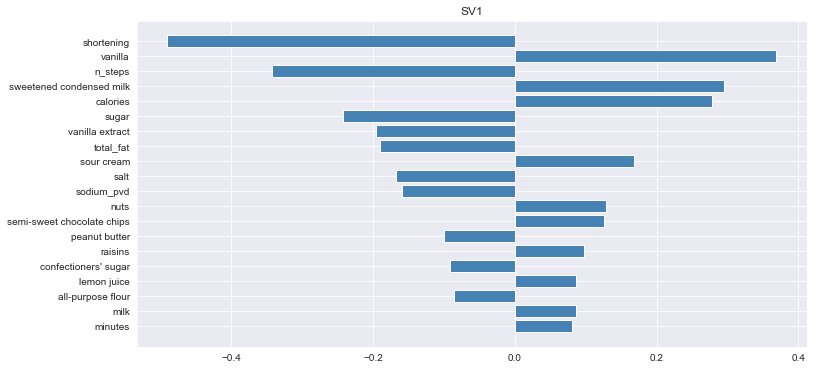

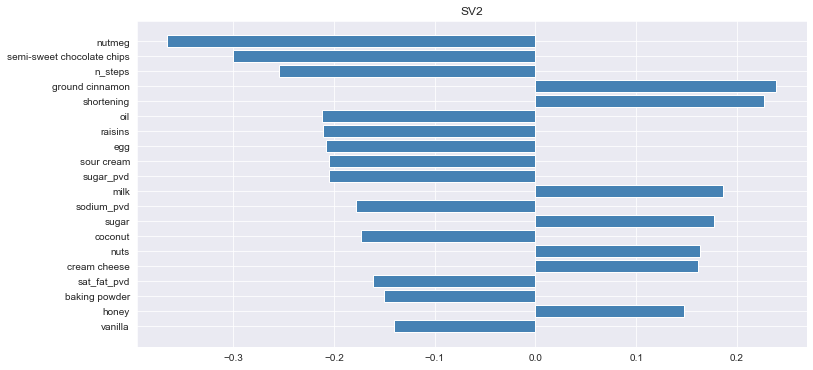

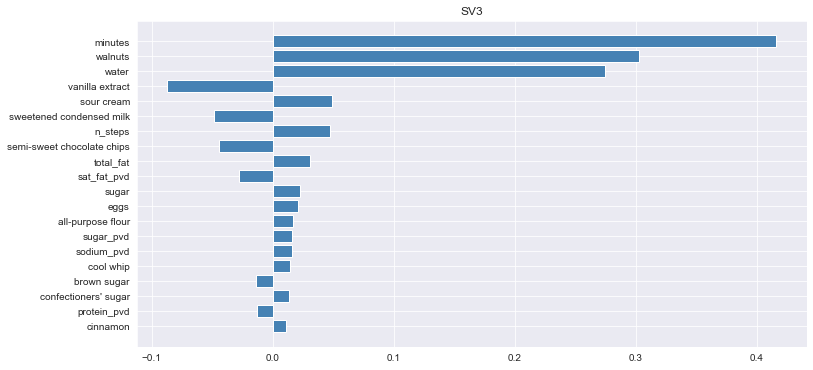

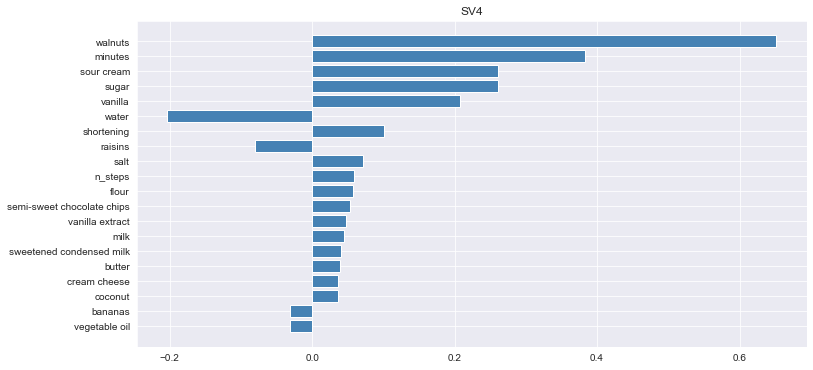

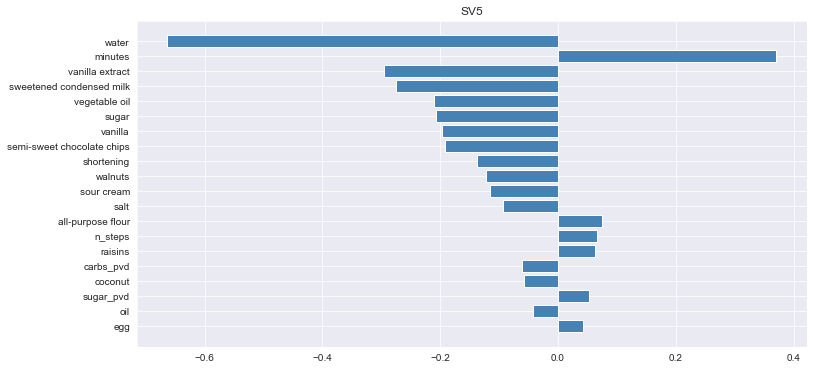

In [19]:
feature_names = df_dessert_final.columns
for i in range(5):
    fig, ax = plt.subplots(figsize=(12, 6))
    order = np.argsort(np.abs(p_svd_item[:, i]))[-20:]
    ax.barh([feature_names[o] for o in order], p_svd_item[order, i],
            color='steelblue')
    ax.set_title(f'SV{i+1}')

<span style="font-size: 12px">
    <center>Figure 14. Bar Plot of the Top 20 Important Item Features of the First Five Singular Vectors</center>
</span>

Quick checkpoint: Let us summarize why we needed to perform dimensionality reduction is necessary:

1. Curse of Dimensionality
2. Computational Complexity
3. Redundant Features

Dimensionality reduction helps address these issues by reducing the number of dimensions in the data while preserving the most important information. In general, this improves the performance of clustering algorithms through the following:

1. Reducing computational complexity
2. Improving the quality of clustering
3. Makes it easier to identify the most important features of the data.

## Clustering the Users

Now that we have performed dimensionality reduction, we can now perform clustering knowing that we are going to get higher quality clusters. We must take note that in selecting the optimal number of clusters, we must rely on the internal validation scores instead of the plot visualization. The plot only represents a relatively small amount of information, hence judging the clusters visually can lead to poor conclusions.

For clustering, we have decided to perform the following techniques:
Note: we only showed three clustering techniques in the main body. The other techniques have been moved over to the appendices.

**1. Representative-based Clustering**
 - K-means
 - K-medoids
 
**2. Hierarchical Clustering**
 - Single Linkage
 - Average Linkage
 - Complete Linkage
 - Ward's Linkage
 
**3. Density-based Clustering**
 - Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
 - Ordering points to identify the clustering structure (OPTICS)
 
**4. Probabilistic Clustering**
 - Gaussian Mixture
 
First, we perform various clustering algorithms on the user dataset. Please refer to **exhibit 1** for other clustering techniques performed on the user dataset.

### K-means Clustering

For our clustering technique, we ultimately decided to use K-means clustering as it provides the following advantages:

1. Highly interpretable
2. Efficient (Fast run time)
3. Simple
4. Scalable
5. Robust

We performed hyperparameter tuning using a simple grid-search algorithm where we perform clustering using a range of values to search for the best number of clusters.

Here is a summary of the scores:

1. SSE - We want to look for the elbow. Inconclusive, all scores are approximately the same.
2. Calinski-Harabasz Index - We want the highest score. Inconclusive, all scores are approximately the same.
3. Silhouette Coefficient - We want a score closest to 0.5. Inconclusive, all scores are approximately the same.
4. Davies-Bouldin Index - We want a score that is close to zero, but not zero. k=2 has a DB index closest to zero.

Using the DB index, we identified that our optimal number of clusters is k=2.

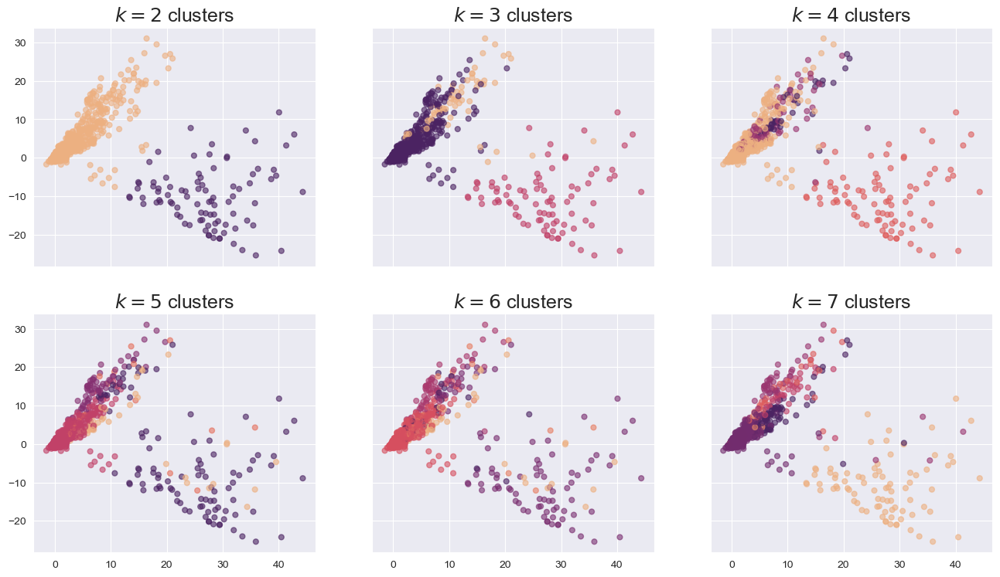

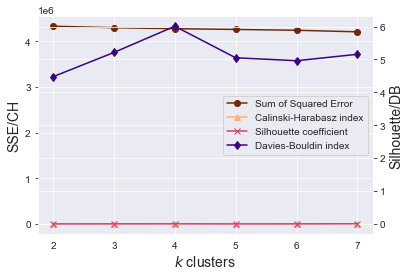

In [20]:
# KMeans

res_users = cluster_range(X_svd_user, KMeans(random_state=1337), 2, 7)
plot_clusters(X_svd_user, res_users['ys'], res_users['centers']);

plot_internal(res_users['inertias'], res_users['chs'], res_users['scs'],
              res_users['dbs']);

<span style="font-size: 12px">
    <center>Figure 15. User Profile Scatter Plot of the KMeans Clustering with the Plot of Internal Validation Metrics for Each Iteration</center>
</span>

### Kmedoids Clustering

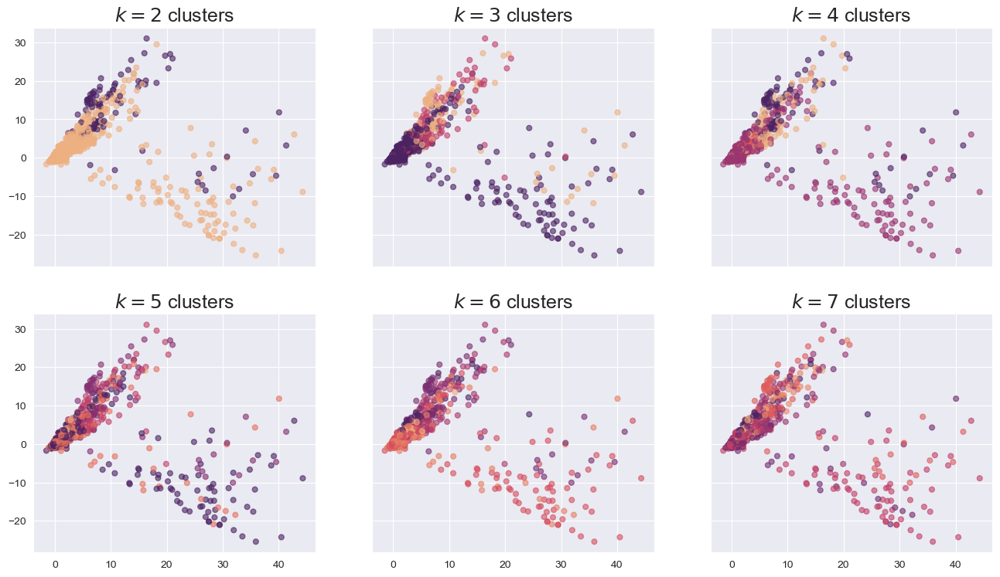

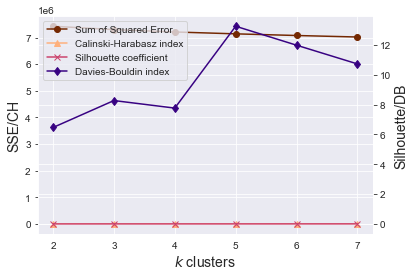

In [21]:
# # KMedoid

res_users2 = cluster_range_kmedoids(X_svd_user, 2, 7)
plot_clusters(X_svd_user, res_users2['ys'], res_users2['centers']);

plot_internal(res_users2['inertias'], res_users2['chs'], res_users2['scs'],
              res_users2['dbs']);

<span style="font-size: 12px">
    <center>Figure 16. User Profile Scatter Plot of the KMedoid Clustering with the Plot of Internal Validation Metrics for Each Iteration</center>
</span>

### Gaussian Mixture Clustering

In [22]:
def plot_clusters(X, ys, centers):
    """Plot clusters given the design matrix and cluster labels"""
    k_max = len(ys) + 1
    k_mid = k_max//2 + 2
    fig, ax = plt.subplots(2, k_max//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(16,9))
    for k, y in zip(range(2, k_max+1), ys):
        if k < k_mid:
            ax[0][k%k_mid-2].scatter(X[:,0], X[:,1], c=y, s=24, alpha=0.6,
                                     cmap='flare');
            ax[0][k%k_mid-2].set_title('$k=%d$ clusters'%k, size=18)
        else:
            ax[1][k%k_mid].scatter(X[:,0], X[:,1], c=y, s=24, alpha=0.6,
                                   cmap='flare');
            ax[1][k%k_mid].set_title('$k=%d$ clusters'%k, size=18)
    return ax

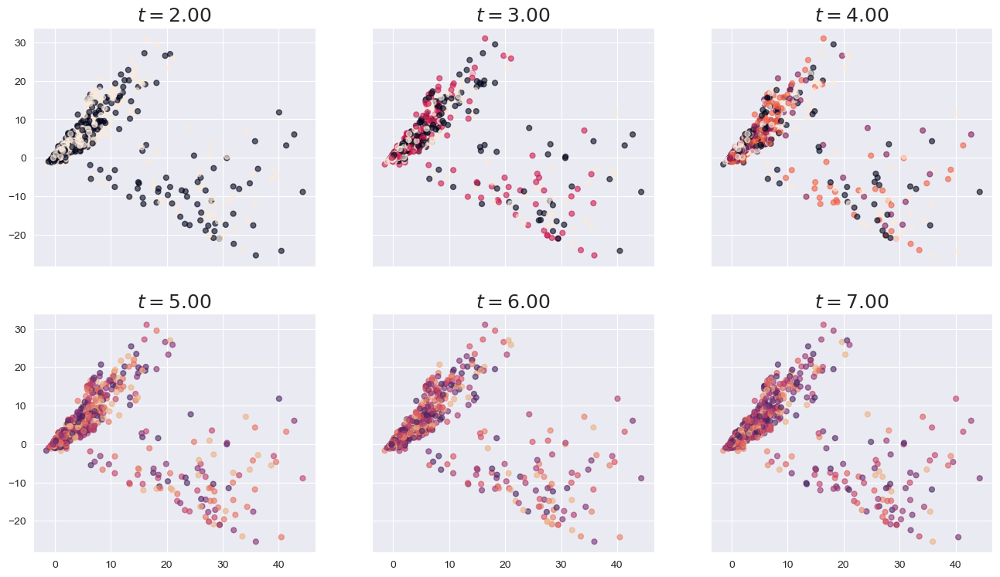

In [23]:
cost = range(2, 8)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(16,9))

for index, t in enumerate(cost):
    y_predict_dessert = GMM(n_components=t,
                            init_params='random',
                            covariance_type='full',
                            tol=1e-2,
                            max_iter=100,
                            n_init=1).fit_predict(X_svd_user)
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1],
                             c=y_predict_dessert, s=24, alpha=0.6)
        ax[0][index].set_title('$t=%.2f$'%t, size=18)
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=y_predict_dessert, s=24,
                                          alpha=0.6, cmap='flare')
        ax[1][index-len(cost)//2].set_title('$t=%.2f$'%t, size=18)

<span style="font-size: 12px">
    <center>Figure 17. User Profile Scatter Plot of the Gaussian Mixture Clustering for Each Iteration</center>
</span>

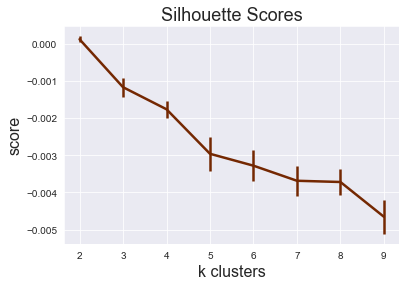

In [24]:
n_clusters=np.arange(2, 10)
sils=[]
sils_err=[]
iterations=10
for n in n_clusters:
    tmp_sil=[]
    for _ in range(iterations):
        gmm=GMM(n_components=n,
                init_params='random',
                covariance_type='full',
                tol=1e-2,
                max_iter=100,
                n_init=1).fit(X_svd_user)
        labels=gmm.predict(X_svd_user)
        sil=silhouette_score(X_svd_user, labels, metric='euclidean')
        tmp_sil.append(sil)
    val=np.mean(SelBest(np.array(tmp_sil), int(iterations/5)))
    err=np.std(tmp_sil)
    sils.append(val)
    sils_err.append(err)

plt.errorbar(n_clusters, sils, yerr=sils_err, c='xkcd:chestnut',
         linewidth=2.5)
plt.title("Silhouette Scores", fontsize=18)
plt.xticks(n_clusters)
plt.xlabel("k clusters", size=16)
plt.ylabel("score", size=16);

<span style="font-size: 12px">
    <center>Figure 18. User Profile Line Plot of the Silhouette Score for Each Iteration of Gaussian Mixture Clustering</center>
</span>

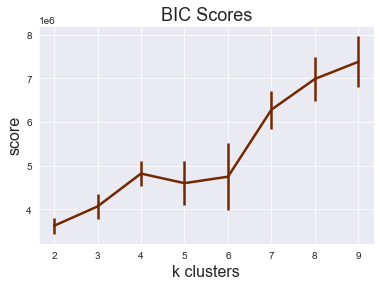

In [25]:
n_clusters=np.arange(2, 10)
bics=[]
bics_err=[]
iterations=10
for n in n_clusters:
    tmp_bic=[]
    for _ in range(iterations):
        gmm=GMM(n, n_init=2).fit(X_svd_user) 
        
        tmp_bic.append(gmm.bic(X_svd_user))
    val=np.mean(SelBest(np.array(tmp_bic), int(iterations/5)))
    err=np.std(tmp_bic)
    bics.append(val)
    bics_err.append(err)

plt.errorbar(n_clusters,bics, yerr=bics_err, c='xkcd:chestnut',
         linewidth=2.5)
plt.title("BIC Scores", fontsize=18)
plt.xticks(n_clusters)
plt.xlabel("k clusters", size=16)
plt.ylabel("score", size=16);
# plt.legend();

<span style="font-size: 12px">
    <center>Figure 19. User Profile Line Plot of the BIC Score for Each Iteration of Gaussian Mixture Clustering</center>
</span>

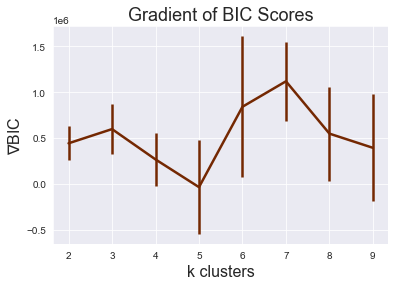

In [26]:
plt.errorbar(n_clusters, np.gradient(bics), yerr=bics_err, c='xkcd:chestnut',
         linewidth=2.5)
plt.title("Gradient of BIC Scores", fontsize=18)
plt.xticks(n_clusters)
plt.xlabel("k clusters", size=16)
plt.ylabel(r"$\nabla$BIC", size=16);
# plt.legend();

<span style="font-size: 12px">
    <center>Figure 20. User Profile Line Plot of the Gradient of BIC Score for Each Iteration of Gaussian Mixture Clustering</center>
</span>

### Analyzing the Optimal Cluster for User

As an extra step, we analyze the result of our clustering at k number of clusters k=2. Here are our observations:

**Cluster 0**
 - 884 samples
 - 4.54 mean rating
 - 0.93 standard deviation
 - 2.12 mean rating count
 
**Cluster 1**
 - 90 samples
 - 4.48 mean rating
 - 1.10 standard deviation
 - 0.17 mean rating count
 
For the other observations, refer to the information found in the tables and plots below.

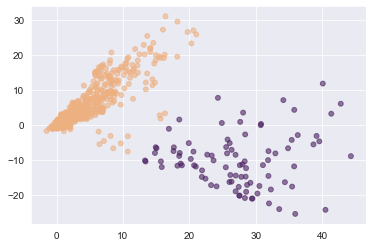

In [27]:
standard_scaler = StandardScaler()
X_user_final = standard_scaler.fit_transform(df_user_rating_0.T).T
svd_user_final = TruncatedSVD(n_components=component_user, random_state=1337)
user_new_svd = svd_user_final.fit_transform(X_user_final)
cluster_label_user = KMeans(2, random_state=1337).fit_predict(user_new_svd)
plt.scatter(user_new_svd[:,0], user_new_svd[:,1], c=cluster_label_user, s=24,
            alpha=0.6, cmap='flare');

<span style="font-size: 12px">
    <center>Figure 21. User Profile Scatter Plot of Optimal Clustering with KMeans</center>
</span>

In [28]:
df_user_cluster = df_user_ratings.copy()
df_user_cluster['cluster'] = cluster_label_user
pd.DataFrame(zip(df_user_cluster.value_counts('cluster'),
                df_user_cluster.groupby('cluster').count().mean(axis=1),
                df_user_cluster.groupby('cluster').mean().mean(axis=1),
                df_user_cluster.groupby('cluster').mean().std(axis=1)),
             columns=['sample_count', 'mean_rating_count', 'mean_rating',
                      'std_rating'])

,sample_count,mean_rating_count,mean_rating,std_rating
0,884,2.123511,4.535502,0.927936
1,90,0.172915,4.481924,1.096093


<span style="font-size: 12px">
    <center>Table 14. Comparison Between the Two Clusters for User Profile</center>
</span>

#### Cluster 0

In [29]:
user_cluster0_count = df_user_cluster.groupby('cluster').count()\
                                .loc[0].sort_values(ascending=False).head(10)
user_cluster0_mean = df_user_cluster.groupby('cluster')\
                                .mean().loc[0].loc[user_cluster0_count.index]
names = df_name.loc[user_cluster0_count.index]['name']
pd.DataFrame(zip(names.values, user_cluster0_count.values,
                 user_cluster0_mean.values),
             columns=['item', 'user_count', 'mean_rating'])

,item,user_count,mean_rating
0,vanilla buttercream frosting from sprinkles ...,52,4.653846
1,reeses squares 5 ingredients no bake reese s,48,4.812500
2,my no roll pie crust,47,4.574468
3,edna s apple crumble aka apple crisp,45,4.577778
4,deb s favorite way to eat fresh fruit,39,4.897436
5,kittencal s bakery buttercream frosting icing,36,4.694444
6,big grandma s best peanut butter cookies,34,4.705882
7,soft batch chocolate chip cookies,32,4.437500
8,most incredible no fail pie crust,31,4.677419
9,the best peanut butter oatmeal cookies,29,4.413793


<span style="font-size: 12px">
    <center>Table 15. Overview for Cluster 0 of the User Profile</center>
</span>

#### Cluster 1

In [30]:
user_cluster1_count = df_user_cluster.groupby('cluster')\
                        .count().loc[1].sort_values(ascending=False).head(10)
user_cluster1_mean = df_user_cluster.groupby('cluster')\
                        .mean().loc[1].loc[user_cluster1_count.index]
names = df_name.loc[user_cluster1_count.index]['name']
pd.DataFrame(zip(names.values, user_cluster1_count.values,
                 user_cluster1_mean.values),
             columns=['item', 'user_count', 'mean_rating'])

,item,user_count,mean_rating
0,kittencal s chocolate frosting icing,90,4.911111
1,kittencal s bakery buttercream frosting icing,12,4.750000
2,vanilla buttercream frosting from sprinkles ...,12,4.833333
3,my no roll pie crust,12,3.666667
4,most incredible no fail pie crust,8,3.875000
5,quick yellow cake,8,4.000000
6,peanut butter chocolate chunk cookies,8,4.750000
7,big grandma s best peanut butter cookies,7,4.714286
8,edna s apple crumble aka apple crisp,6,4.000000
9,1 pan fudge cake,6,4.666667


<span style="font-size: 12px">
    <center>Table 16. Overview for Cluster 1 of the User Profile</center>
</span>

Looking at the plots, the labels can be as follows:

Cluster 0
1. Relative high number of rating count
2. High number of data points

Cluster 1
1. Relative low number of rating count
2. Low number of data points

Based on this information, we can then label our clusters. 

- **Cluster 0** - Standard Users
- **Cluster 1** - New Users

## Clustering the Items

We also perform clustering to the recipe data following the same clustering method we applied to the user data.
It must also be noted that reliance on visualizations is a big red flag. Instead, we must choose our optimal number of clusters using the internal validation criteria.

Please refer to **exhibit 2** the other clustering techniques performed on the recipe dataset.

### K-means Clustering

We also performed hyperparameter tuning using a simple grid-search algorithm where we perform clustering using a range of values to search for the best number of clusters.

Here is a summary of the scores:

1. SSE - We want to look for the elbow. Inconclusive, all scores are approximately the same.
2. Calinski-Harabasz Index - We want the highest score. Inconclusive, all scores are approximately the same.
3. Silhouette Coefficient - We want a score closest to 0.5. k=2 has a score closest to 0.5
4. Davies-Bouldin Index - We want a score that is close to zero, but not zero. k=2 has a DB index closest to zero.

Using the DB index and Silhouette coefficient, we identified that our optimal number of clusters is k=2.

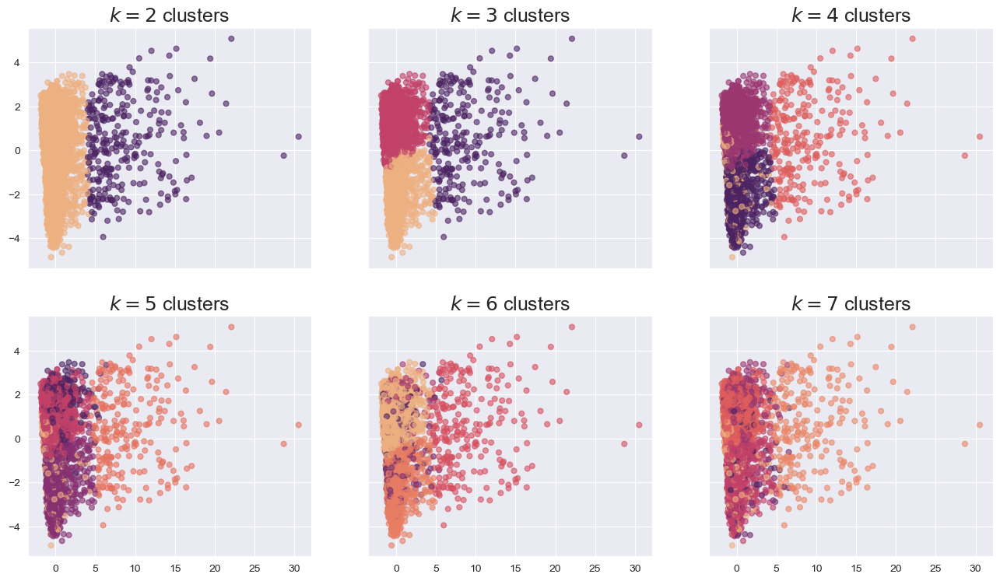

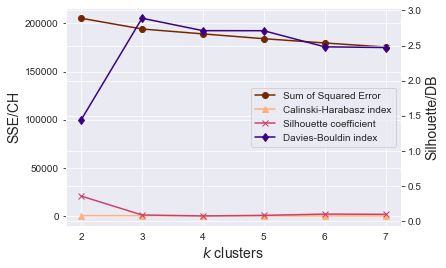

In [31]:
# KMeans

res_item = cluster_range(X_svd_item, KMeans(random_state=1337), 2, 7)
plot_clusters(X_svd_item, res_item['ys'], res_item['centers']);

plot_internal(res_item['inertias'], res_item['chs'], res_item['scs'],
              res_item['dbs']);

<span style="font-size: 12px">
    <center>Figure 22. Item Profile Scatter Plot of the KMeans Clustering with the Plot of Internal Validation Metrics for Each Iteration</center>
</span>

### K-medoids Clustering

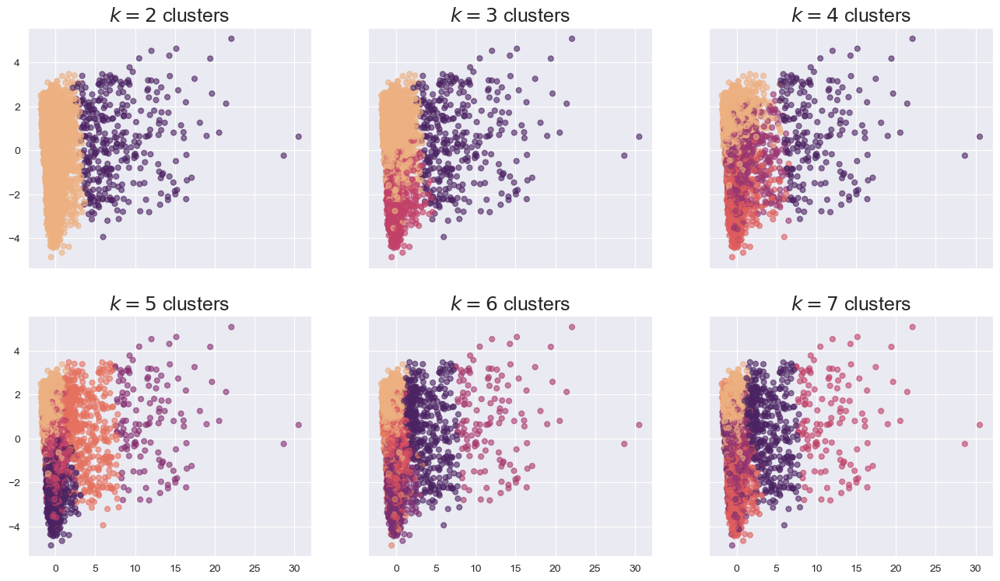

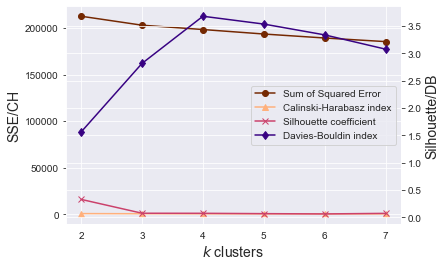

In [32]:
res_item2 = cluster_range_kmedoids(X_svd_item, 2, 7)
plot_clusters(X_svd_item, res_item2['ys'], res_item2['centers']);

plot_internal(res_item2['inertias'], res_item2['chs'], res_item2['scs'],
              res_item2['dbs']);

<span style="font-size: 12px">
    <center>Figure 23. Item Profile Scatter Plot of the KMedoid Clustering with the Plot of Internal Validation Metrics for Each Iteration</center>
</span>

### Gaussian Mixture Clustering

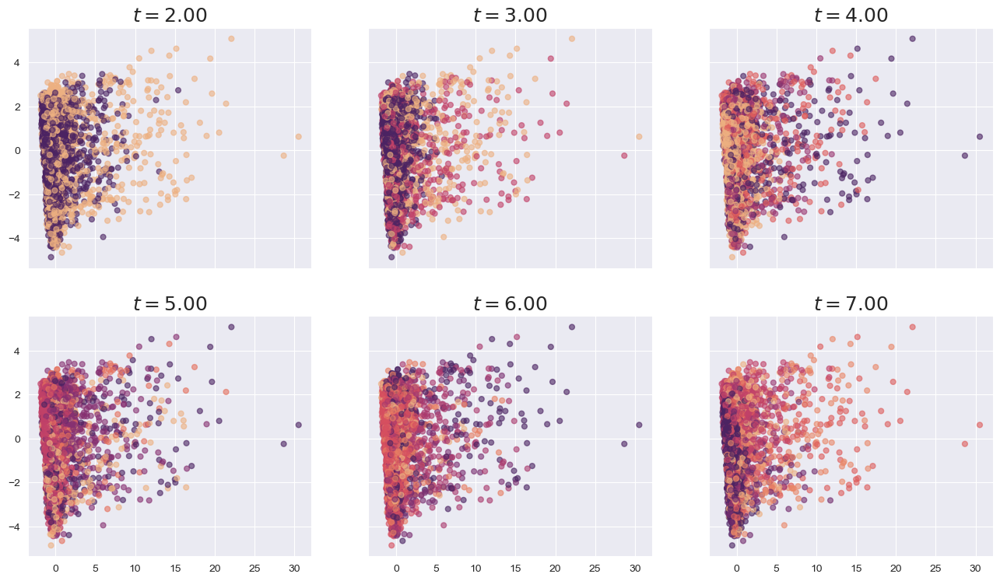

In [33]:
cost = range(2, 8)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(16,9))

for index, t in enumerate(cost):
    y_predict_dessert = GMM(n_components=t,
                            init_params='random',
                            covariance_type='full',
                            tol=1e-2,
                            max_iter=100,
                            n_init=1).fit_predict(X_svd_item)
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=y_predict_dessert, s=24, alpha=0.6,
                             cmap='flare')
        ax[0][index].set_title('$t=%.2f$'%t, size=18)
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=y_predict_dessert, s=24,
                                          alpha=0.6, cmap='flare')
        ax[1][index-len(cost)//2].set_title('$t=%.2f$'%t, size=18)

<span style="font-size: 12px">
    <center>Figure 24. Item Profile Scatter Plot for Each Iteration of Gaussian Mixture Clustering</center>
</span>

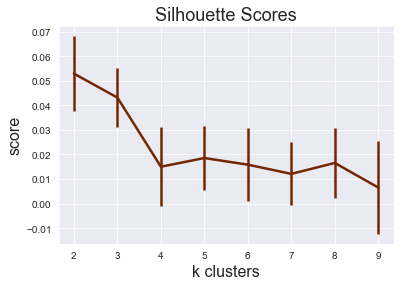

In [34]:
n_clusters=np.arange(2, 10)
sils=[]
sils_err=[]
iterations=10
for n in n_clusters:
    tmp_sil=[]
    for _ in range(iterations):
        gmm=GMM(n_components=n,
                init_params='random',
                covariance_type='full',
                tol=1e-2,
                max_iter=100,
                n_init=1).fit(X_svd_item)
        labels=gmm.predict(X_svd_item)
        sil=silhouette_score(X_svd_item, labels, metric='euclidean')
        tmp_sil.append(sil)
    val=np.mean(SelBest(np.array(tmp_sil), int(iterations/5)))
    err=np.std(tmp_sil)
    sils.append(val)
    sils_err.append(err)

plt.errorbar(n_clusters, sils, yerr=sils_err, c='xkcd:chestnut',
         linewidth=2.5)
plt.title("Silhouette Scores", fontsize=18)
plt.xticks(n_clusters)
plt.xlabel("k clusters", size=16)
plt.ylabel("score", size=16);

<span style="font-size: 12px">
    <center>Figure 25. Item Profile Line Plot of the Silhouette Score for Each Iteration of Gaussian Mixture Clustering</center>
</span>

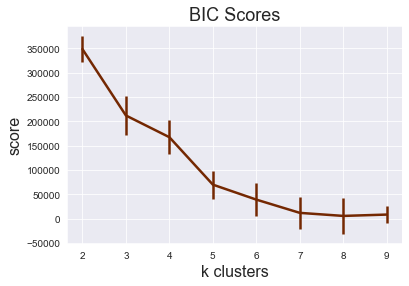

In [35]:
n_clusters=np.arange(2, 10)
bics=[]
bics_err=[]
iterations=10
for n in n_clusters:
    tmp_bic=[]
    for _ in range(iterations):
        gmm=GMM(n, n_init=2).fit(X_svd_item) 
        
        tmp_bic.append(gmm.bic(X_svd_item))
    val=np.mean(SelBest(np.array(tmp_bic), int(iterations/5)))
    err=np.std(tmp_bic)
    bics.append(val)
    bics_err.append(err)

plt.errorbar(n_clusters,bics, yerr=bics_err, c='xkcd:chestnut',
         linewidth=2.5)
plt.title("BIC Scores", fontsize=18)
plt.xticks(n_clusters)
plt.xlabel("k clusters", size=16)
plt.ylabel("score", size=16);
# plt.legend();

<span style="font-size: 12px">
    <center>Figure 26. Item Profile Line Plot of the BIC Score for Each Iteration of Gaussian Mixture Clustering</center>
</span>

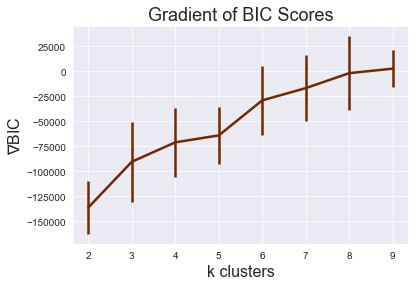

In [36]:
plt.errorbar(n_clusters, np.gradient(bics), yerr=bics_err, c='xkcd:chestnut',
         linewidth=2.5)
plt.title("Gradient of BIC Scores", fontsize=18)
plt.xticks(n_clusters)
plt.xlabel("k clusters", size=16)
plt.ylabel(r"$\nabla$BIC", size=16);
# plt.legend();

<span style="font-size: 12px">
    <center>Figure 27. Item Profile Line Plot of the Gradient of BIC Score for Each Iteration of Gaussian Mixture Clustering</center>
</span>

### Analyzing the Optimal Cluster for Items

Now that we have identified the optimal number of clusters at k=2, let us further explore the characteristics of our clusters by performing a simple analysis. For each cluster, let us take the mean of each feature. This will give us a grasp of the characteristics of the data points contained within each cluster. Here are our observations:

**Cluster 0**
1. Average calories is approximately 332 (Low-calorie dessert)
2. Average sugar content is approximately 126 (Low sugar dessert)
3. Average carbohydrate content is approximately 15 (Low carb dessert)

**Cluster 1**
1. Average calories is approximately 3,551 (High-calorie dessert)
2. Average sugar content is approximately 1,333 (High sugar dessert)
3. Average carbohydrate content is approximately 157 (High carb dessert)

From this, we can infer that cluster 1 is comprised of high-nutrient desserts whereas cluster 0 is comprised of low-fat desserts. Of course, this method is not entirely reliable, as we are only looking at the raw values taken from the mean of each cluster. Hence in the next step, we will perform hypothesis testing to identify the significant features of each cluster.

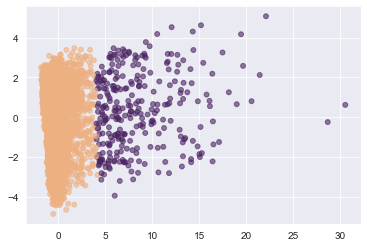

In [37]:
standard_scaler = StandardScaler()
X_item_final = standard_scaler.fit_transform(df_dessert_final)
svd_item_final = TruncatedSVD(n_components=component_item, random_state=1337)
item_new_svd = svd_item_final.fit_transform(X_item_final)
cluster_label_item = KMeans(2, random_state=1337).fit_predict(item_new_svd)
plt.scatter(item_new_svd[:,0], item_new_svd[:,1], c=cluster_label_item, s=24,
            alpha=0.6, cmap='flare');

<span style="font-size: 12px">
    <center>Figure 28. Item Profile Scatter Plot of Optimal Clustering with KMeans</center>
</span>

In [38]:
df_dessert_cluster = df_dessert_final.copy()
df_dessert_cluster['cluster'] = cluster_label_item
df_dessert_cluster.groupby('cluster').mean()

,minutes,n_steps,calories,total_fat,sugar_pvd,sodium_pvd,protein_pvd,sat_fat_pvd,carbs_pvd,all-purpose flour,...,shortening,sour cream,sugar,sweetened condensed milk,vanilla,vanilla extract,vegetable oil,walnuts,water,white sugar
cluster,,,,,,,,,,,,,,,,,,,,,
0,27.941318,5.254844,331.798819,22.916221,126.231039,7.581473,8.950729,34.458203,15.018638,0.025838,...,0.013848,0.019654,0.128239,0.020571,0.078402,0.053085,0.017715,0.025228,0.054689,0.018798
1,37.702422,5.307958,3551.284429,271.453287,1333.211073,104.422145,82.352941,356.038062,156.837370,0.047068,...,0.044164,0.026814,0.131160,0.029583,0.124157,0.052186,0.027115,0.025177,0.039620,0.034243


<span style="font-size: 12px">
    <center>Table 17. Comparison Between the Two Clusters for Item Profile</center>
</span>

## Cluster Explainability

If you've taken an advanced statistics class, chances are, your professor may have mentioned this along the lines of his/her discussion:

**"In statistics, we do NOT eyeball"**

Hypothesis testing is an essential statistical tool used to make decisions about a population based on sample data. It allows us to test whether an observed effect is statistically significant or whether it could have occurred by chance.

Our chosen statistical test is the SFIT method. The Single Feature Introduction Test (SFIT) is a simple and computationally efficient significance test for the features of a machine learning model. It identifies the statistically significant features as well as feature interactions of any order in a hierarchical manner. [14][15]

### Training a 3-Hidden-Layer Neural Network and Performing the Single Feature Introduction Test (SFIT) for Explainable Clustering

Before we can perform classification, we first labeled each company using its cluster assignment from our chosen clustering algorithm (K-means, at k=2).

To perform classification on the clusters, we trained a 3-hidden-layer neural network that has ReLU activation functions, a first hidden size of 100, a second hidden size of 50, and a third hidden size of 25. The network is trained for at most 50 epochs using the Adam optimizer which has pruning capabilities.

After running the classification, we perform the Single Feature Introduction Test (SFIT) on the trained network by only using the data for a specific cluster, and returning a cluster's most important features. 

In [39]:
if __name__ == "__main__":
    np.random.seed(10)
    tf.compat.v1.random.set_random_seed(10)

    # read csv
    df = df_dessert_final.copy()

    print('Total number of observations: {0}'.format(df.shape[0]))
    print('Number of features: {0}'.format(df.shape[1]))
    df_means = df.mean()
    df_stds = df.std()
    df = (df - df_means) / df_stds

    print('Cluster data:')
    nr_clusters = 2
    clustering = KMeans(n_clusters=nr_clusters, random_state=1337)
    labels = clustering.fit_predict(df.values)

    dict_clusters = {}
    for idx, label in enumerate(clustering.labels_):
        if label in dict_clusters:
            dict_clusters[label].append(df.iloc[idx].name)
        else:
            dict_clusters[label] = [df.iloc[idx].name]
    for key in dict_clusters:
        print('Cluster {0} has {1} samples'.format(key,
                                                   len(dict_clusters[key])))


    print('Prepare data for classification:')
    df['label'] = labels
    X_train, Y_train, X_val, Y_val, X_test, Y_test = prepare_data(df,
                                                        add_intercept=True)
    Y_train_trans = np_utils.to_categorical(Y_train)
    Y_val_trans = np_utils.to_categorical(Y_val)
    Y_test_trans = np_utils.to_categorical(Y_test)

    print('Fit neural network')
    # Fit 3 hidden layers neural network:
    d = X_train.shape[1]
    nhidden1 = 100
    nhidden2 = 50
    nhidden3 = 25
    batch_size = 32
    nr_epochs = 50
    dropout_rate = 0.3
    inputs = Input(shape=(d,))
    hidden1 = Dense(nhidden1, activation='relu')(inputs)
    # hidden1 = BatchNormalization()(hidden1)
    # hidden1 = Dropout(rate=dropout_rate)(hidden1)
    hidden2 = Dense(nhidden2, activation='relu')(hidden1)
    # hidden2 = BatchNormalization()(hidden2)
    # hidden2 = Dropout(rate=dropout_rate)(hidden2)
    hidden3 = Dense(nhidden3, activation='relu')(hidden2)
    output = Dense(nr_clusters, activation='sigmoid')(hidden3)
    early_stop = EarlyStopping(monitor='val_categorical_accuracy',
                               min_delta=0.001,
                               patience=20)
    reduce_lr = ReduceLROnPlateau(monitor='val_categorical_accuracy',
                                  factor=0.1, min_delta=0.0001,
                                  patience=5, min_lr=1e-7)
    model = Model(inputs=inputs, outputs=output)
    optimizer = Adam(lr=1e-3, beta_1=0.9, beta_2=0.999, epsilon=None,
                     amsgrad=False)
    model.compile(optimizer='adam', loss='categorical_crossentropy',
                  metrics=['categorical_accuracy'])

    model.fit(x=X_train,
              y=Y_train_trans,
              batch_size=batch_size,
              epochs=nr_epochs,
              validation_data=(X_val, Y_val_trans),
              callbacks=[early_stop, reduce_lr],
              verbose=0)

    Y_val_predicted = np.argmax(model.predict(X_val), axis=1)
    nn_val_acc = accuracy_score(Y_val, Y_val_predicted)
    nn_val_bal_acc = balanced_accuracy_score(Y_val, Y_val_predicted)

    print('Neural network accuracy on val set: {0} \n'\
          .format(np.round(nn_val_acc, 2)))
    print('Neural network bal acc on val set: {0} \n'\
          .format(np.round(nn_val_bal_acc, 2)))

    Y_test_predicted = np.argmax(model.predict(X_test), axis=1)
    nn_test_acc = accuracy_score(Y_test, Y_test_predicted)
    nn_test_bal_acc = balanced_accuracy_score(Y_test, Y_test_predicted)

    print('Neural network acc on test set: {0} \n'\
          .format(np.round(nn_test_acc, 2)))
    print('Neural network bal acc on test set: {0} \n'\
          .format(np.round(nn_test_bal_acc, 2)))

    print('Overall SFIT analysis:')
    
    # Compute SFIT on neural network model:
    alpha = 0.05
    beta = 1e-6
    results_sfit_lin = sfit_first_order(model=model,
                                        loss=categorical_cross_entropy_loss,
                                        x=X_test.values,
                                        y=Y_test_trans,
                                        alpha=alpha,
                                        beta=beta,
                                        verbose=0)

    significant_var = results_sfit_lin[0]
    median = []
    lower = []
    upper = []
    for key in results_sfit_lin[1]:
        median.append(results_sfit_lin[1][key][0])
        lower.append(results_sfit_lin[1][key][1][0])
        upper.append(results_sfit_lin[1][key][1][1])

    df_dict = {}
    df_dict['variable'] = X_train.columns[significant_var]
    df_dict['median'] = median
    df_dict['CI_lower_bound'] = lower
    df_dict['CI_upper_bound'] = upper
    results = pd.DataFrame.from_dict(df_dict)
    results.sort_values(by='median', ascending=False, inplace=True)
    print(results)

    print('SFIT analysis per cluster:')
    for c in dict_clusters:
        if len(dict_clusters[c]) > 10:
            mask = df['label'] == c
            X = df.iloc[:, 0:-1]
            X = X.loc[mask]
            Y = df.iloc[:, -1]
            Y = np_utils.to_categorical(Y)
            Y = Y[mask]
            results_sfit_lin = sfit_first_order(model=model,
                                        loss=categorical_cross_entropy_loss,
                                        x=X.values,
                                        y=Y,
                                        alpha=alpha,
                                        beta=beta,
                                        verbose=0)

            significant_var = results_sfit_lin[0]
            median = []
            lower = []
            upper = []
            for key in results_sfit_lin[1]:
                median.append(results_sfit_lin[1][key][0])
                lower.append(results_sfit_lin[1][key][1][0])
                upper.append(results_sfit_lin[1][key][1][1])

            df_dict = {}
            df_dict['variable'] = X.columns[significant_var]
            df_dict['median'] = median
            df_dict['CI_lower_bound'] = lower
            df_dict['CI_upper_bound'] = upper
            results = pd.DataFrame.from_dict(df_dict)
            results.sort_values(by='median', ascending=False, inplace=True)
#             results.to_csv('./data/cluster_{0}_sfit_results.csv'.format(c))
            print('Cluster {0}'.format(c))
            print(results)


Total number of observations: 5708
Number of features: 50
Cluster data:
Cluster 1 has 5418 samples
Cluster 0 has 290 samples
Prepare data for classification:
Number of observations in train set: 4051
Number of observations in validation set: 1129
Number of observations in test set: 528
Total number of observations: 5708
Fit neural network
36/36 [==============================] - 0s 1ms/step
Neural network accuracy on val set: 0.99 

Neural network bal acc on val set: 0.96 

17/17 [==============================] - 0s 1ms/step
Neural network acc on test set: 0.99 

Neural network bal acc on test set: 0.95 

Overall SFIT analysis:
17/17 [==============================] - 0s 1ms/step
                      variable    median  CI_lower_bound  CI_upper_bound
22                        eggs  0.022137        0.022137        0.022137
40                     vanilla  0.019781        0.019781        0.019781
2                     calories  0.019462        0.018577        0.021031
0                 

Here are the five most important features of each cluster:

**Cluster 0**
- calories
- sodium_pvd
- sat_fat_pvd
- carbs_pvd
- protein_pvd

**Cluster 1**
- eggs
- vanilla
- calories
- minutes
- sugar_pvd

These features are what separate one cluster from the other. However, the results do not tell us exactly why these features are considered the most important. It does not tell us the feature's abundance or lack thereof.

Since we are comparing only two clusters, it is likely to get common significant features for both clusters. In our case, we got calories as a common significant feature. This could mean that for the calorie feature, both clusters are likely to demonstrate a significant difference in their mean or median.

To augment our results from the SFIT method, we can check the values for each of these features for both clusters. If you remember, earlier, we took a look at the mean/median of calories and saturated fat for both features, and truly, these clusters are significantly different in terms of calories and saturated fat.

**Recap:**

**Cluster 0**
1. Average calories is approximately 332 (Low-calorie dessert)
2. Average sugar content is approximately 126 (Low sugar dessert)
3. Average carbohydrate content is approximately 15 (Low carb dessert)

**Cluster 1**
1. Average calories is approximately 3,551 (High-calorie dessert)
2. Average sugar content is approximately 1,333 (High sugar dessert)
3. Average carbohydrate content is approximately 157 (High carb dessert)

Now that we have this information, we can then label our clusters. 

- **Cluster 0** - Low-fat Dessert
- **Cluster 1** - High-fat Dessert


## Building the Recommender System

This section is the most important part of this study. This section directly answers the problem statement (why this study exists).
Let us recap:

**What?**

- Create a **recommender system** for the **dessert** recipes in **food.com** to help users decide among the thousands of desserts available on the platform.

**Why?**

- Food.com only has a **fixed set of recommendations** based on the recipe you are currently viewing. The goal is to create a **personalized recommendation system** that suggests recipes based on user ratings.

Now before we proceed, let us first ask some questions to better understand what recommender systems are and what value they provide to a business.

**What is a recommender system?**

A recommendation system is a subclass of Information filtering Systems that seeks to predict the rating or the preference a user might give to an item. In simple words, it is an algorithm that suggests relevant items to users. Eg: In the case of Netflix which movie to watch, In the case of e-commerce which product to buy, or In the case of kindle which book to read, etc. [16]

**Why are recommender systems important?**

Recommender systems are important because they help users discover and engage with content or products that are most relevant and interesting to them. In an era of information overload, recommender systems play a critical role in filtering and personalizing content for individual users.

**Here are some specific reasons why recommender systems are important:**

1. Personalization
2. Increased Sales and Revenue
3. Efficient Use of Resources
4. Enhanced User Experience

To summarize, recommender systems are powerful business tools that provide personalized recommendations to users. It helps users discover new content and products that they may not have found otherwise, while also driving sales and revenue for businesses.

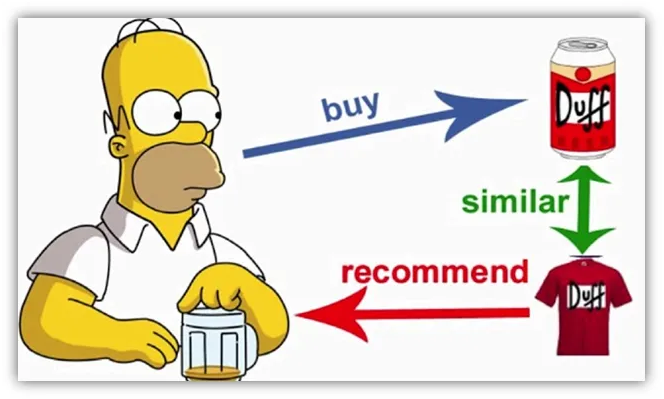

<span style="font-size: 12px">
    <center>Figure 29. A simple representation of a recommender system</center>
    <center>Source: https://nafeea3000.medium.com/recommender-systems-c8db209dd0d3</center>
</span>

There are many types of recommender systems and we can go all day talking about them. However, for this study, we need to help Chef Almond choose the best type of recommender system out of the following:

1. User-based Collaborative Filtering
2. Item-based Collaborative Filtering
3. Latent Factor-based Collaborative Filtering

For this study, we will be using the Scikit-Surprise Library. The scikit-surprise library is a popular Python library for building recommender systems using collaborative filtering techniques. We algorithms we decided to use user-based kNN, item-based kNN, and SVD. Here's a comparison of the user-based k-NN, item-based k-NN, and SVD algorithms in the scikit-surprise library:

1. User-based kNN
2. Item-based kNN
3. SVD (Latent Factor)

After implementing the three aforementioned algorithms, we will then evaluate each model and identify which of the three performs the best.

### User-based Collaborative Filtering

This algorithm is an implementation of user-based collaborative filtering using k-NN. It computes similarities between users and uses the k-nearest neighbors to make recommendations. User-based k-NN can be fast and effective for small to medium-sized datasets but can suffer from scalability and sparsity issues for larger datasets.

#### Recommendation Results

In [40]:
df_melt = (df_user_ratings.reset_index()
                    .melt('user_id', var_name='recipe_id',
                          value_name='rating')
                    .dropna())
rating_scale = (0,5)
method = KNNWithMeans(k=5, sim_options={'name': 'pearson',
                                        'user_based': True, 'min_support':5})
user_list = df_user_ratings.index[:5]
user_rec, user_pred = recsys(df_melt, rating_scale, method, user_list,
                             df_name)
display(user_rec)

Computing the pearson similarity matrix...
Done computing similarity matrix.


1535  \
                                  Likes   
Top1  soft batch chocolate chip cookies   
Top2       easy blueberry lemon parfait   
Top3                      frog cupcakes   
Top4                   creamsicle float   
Top5         perfect sugar cookie glaze   

                                               \
                                   Recommends   
Top1  catherine s excellent yorkshire pudding   
Top2                 caramel apple milkshakes   
Top3                         french pecan pie   
Top4                  mashed sweet potato pie   
Top5                  banana orange ice cream   

                                                4291  \
                                               Likes   
Top1                       almond joy fudge brownies   
Top2                      soft and chewy m m cookies   
Top3           doctored up vanilla pudding casserole   
Top4  kittencal s bakery buttercream  frosting icing   
Top5                  grandma may s molasses cookies   

                                                                      4439  \
                                   Recommends                        Likes   
Top1  catherine s excellent yorkshire pudding           simple apple crisp   
Top2                 caramel apple milkshakes     rice krispies bundt cake   
Top3                         french pecan pie       toffee almond blondies   
Top4                  mashed sweet potato pie    ms  lamorte s apple crisp   
Top5                  banana orange ice cream  fruitcake cookies made easy   

                                               \
                                   Recommends   
Top1  catherine s excellent yorkshire pudding   
Top2                 caramel apple milkshakes   
Top3                         french pecan pie   
Top4                  mashed sweet potato pie   
Top5                  banana orange ice cream   

                                               4470  \
                                              Likes   
Top1               apple raisin sauce for baked ham   
Top2                            papaya yogurt boats   
Top3                          peppered strawberries   
Top4  fruit and fiber parfait   ww friendly 1 point   
Top5                       non alcoholic hard sauce   

                                               \
                                   Recommends   
Top1  catherine s excellent yorkshire pudding   
Top2                 caramel apple milkshakes   
Top3                         french pecan pie   
Top4                  mashed sweet potato pie   
Top5                  banana orange ice cream   

                                                4740  \
                                               Likes   
Top1          5 minute toasted almond cheesecake pie   
Top2  real honest to goodness indoor s mores  really   
Top3                           sopaipilla cheesecake   
Top4              burger king s hershey s sundae pie   
Top5       unknownchef86 s instant pudding ice cream   

                                               
                                   Recommends  
Top1  catherine s excellent yorkshire pudding  
Top2                 caramel apple milkshakes  
Top3                         french pecan pie  
Top4                  mashed sweet potato pie  
Top5                  banana orange ice cream

<span style="font-size: 12px">
    <center>Table 18. Overview of Likes and Recommendations for User-Based Collaborative Filtering</center>
</span>

#### Evaluating the model with MSE and RMSE

In [41]:
df_user_pred = pd.DataFrame(user_pred)
df_user_pred.drop("details", inplace=True, axis=1)
df_user_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_user_pred.head()
user_mse = recmetrics.mse(df_user_pred.actual, df_user_pred.user_predictions)
user_rmse = recmetrics.rmse(df_user_pred.actual,
                            df_user_pred.user_predictions)
print("MSE: ", user_mse)
print("RMSE: ", user_rmse)

MSE:  0.29790148804741673
RMSE:  0.5458035251328235


#### Evaluating the Model Prediction Coverage

In [42]:
user_model = df_user_pred.pivot_table(index='user_id', columns='recipe_id',
                                      values='user_predictions').fillna(0)

df_user_pred = df_user_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_user_pred = df_user_pred.set_index("user_id")

user_recs = [] = []
for user in df_user_pred.index:
    user_predictions = get_users_predictions(user, 10, user_model)
    user_recs.append(user_predictions)
        
df_user_pred['user_predictions'] = user_recs

catalog = df_melt.recipe_id.unique().tolist()
user_coverage = recmetrics.prediction_coverage(user_recs, catalog)
print("Coverage: ", user_coverage)

Coverage:  5.38


### Item-based Collaborative Filtering

This algorithm is an implementation of item-based collaborative filtering using k-NN. It computes similarities between items and uses the k-nearest neighbors to make recommendations. Item-based k-NN can be faster and more scalable than user-based k-NN and can handle sparsity better. However, it may not work as well for datasets with a large number of items.

In [43]:
df_melt = (df_user_ratings.reset_index()
                    .melt('user_id', var_name='recipe_id',
                          value_name='rating')
                    .dropna())
rating_scale = (0,5)
method = KNNWithMeans(k=5, sim_options={'name': 'pearson',
                                        'user_based': False, 'min_support':5})
user_list = df_user_ratings.index[:5]

item_rec, item_pred = recsys(df_melt, rating_scale, method, user_list,
                             df_name)
display(item_rec)

Computing the pearson similarity matrix...
Done computing similarity matrix.


1535  \
                                  Likes   
Top1  soft batch chocolate chip cookies   
Top2       easy blueberry lemon parfait   
Top3                      frog cupcakes   
Top4                   creamsicle float   
Top5         perfect sugar cookie glaze   

                                               \
                                   Recommends   
Top1  catherine s excellent yorkshire pudding   
Top2                 caramel apple milkshakes   
Top3                         french pecan pie   
Top4                  mashed sweet potato pie   
Top5                  banana orange ice cream   

                                                4291  \
                                               Likes   
Top1                       almond joy fudge brownies   
Top2                      soft and chewy m m cookies   
Top3           doctored up vanilla pudding casserole   
Top4  kittencal s bakery buttercream  frosting icing   
Top5                  grandma may s molasses cookies   

                                                                      4439  \
                                   Recommends                        Likes   
Top1  catherine s excellent yorkshire pudding           simple apple crisp   
Top2                 caramel apple milkshakes     rice krispies bundt cake   
Top3                         french pecan pie       toffee almond blondies   
Top4                  mashed sweet potato pie    ms  lamorte s apple crisp   
Top5                  banana orange ice cream  fruitcake cookies made easy   

                                               \
                                   Recommends   
Top1  catherine s excellent yorkshire pudding   
Top2                 caramel apple milkshakes   
Top3                         french pecan pie   
Top4                  mashed sweet potato pie   
Top5                  banana orange ice cream   

                                               4470  \
                                              Likes   
Top1               apple raisin sauce for baked ham   
Top2                            papaya yogurt boats   
Top3                          peppered strawberries   
Top4  fruit and fiber parfait   ww friendly 1 point   
Top5                       non alcoholic hard sauce   

                                               \
                                   Recommends   
Top1  catherine s excellent yorkshire pudding   
Top2                 caramel apple milkshakes   
Top3                         french pecan pie   
Top4                  mashed sweet potato pie   
Top5                  banana orange ice cream   

                                                4740  \
                                               Likes   
Top1          5 minute toasted almond cheesecake pie   
Top2  real honest to goodness indoor s mores  really   
Top3                           sopaipilla cheesecake   
Top4              burger king s hershey s sundae pie   
Top5       unknownchef86 s instant pudding ice cream   

                                               
                                   Recommends  
Top1  catherine s excellent yorkshire pudding  
Top2                 caramel apple milkshakes  
Top3                         french pecan pie  
Top4                  mashed sweet potato pie  
Top5                  banana orange ice cream

<span style="font-size: 12px">
    <center>Table 19. Overview of Likes and Recommendation for Item-Based Collaborative Filtering</center>
</span>

#### Evaluating the model with MSE and RMSE

In [44]:
df_item_pred = pd.DataFrame(item_pred)
df_item_pred.drop("details", inplace=True, axis=1)
df_item_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_item_pred.head()
item_mse = recmetrics.mse(df_item_pred.actual, df_item_pred.user_predictions)
item_rmse = recmetrics.rmse(df_item_pred.actual,
                            df_item_pred.user_predictions)

print("MSE: ", item_mse)
print("RMSE: ", item_rmse)

MSE:  0.8885198523637632
RMSE:  0.9426133100926186


#### Evaluating the Model Prediction Coverage

In [45]:
item_model = df_item_pred.pivot_table(index='user_id', columns='recipe_id',
                                      values='user_predictions').fillna(0)

df_item_pred = df_item_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_item_pred = df_item_pred.set_index("user_id")

item_recs = [] = []
for user in df_item_pred.index:
    item_predictions = get_users_predictions(user, 10, item_model)
    item_recs.append(item_predictions)
        
df_item_pred['user_predictions'] = item_recs

catalog = df_melt.recipe_id.unique().tolist()
item_coverage = recmetrics.prediction_coverage(item_recs, catalog)
print("Coverage: ", item_coverage)

Coverage:  1.45


### Latent Factor-based Collaborative Filtering

The SVD algorithm is a latent factor-based collaborative filtering algorithm that uses matrix factorization to learn latent factors that capture user preferences and item characteristics. It can handle large datasets and sparse data well and can be more accurate than k-NN methods in many cases. However, it can be slower to train and can be more difficult to interpret.

In [46]:
df_melt = (df_user_ratings.reset_index()
                    .melt('user_id', var_name='recipe_id',
                          value_name='rating')
                    .dropna())
rating_scale = (0,5)
method = SVD(random_state=69)
user_list = df_user_ratings.index[:5]

svd_rec, svd_pred = recsys(df_melt, rating_scale, method, user_list, df_name)
display(svd_rec)

1535  \
                                  Likes   
Top1  soft batch chocolate chip cookies   
Top2       easy blueberry lemon parfait   
Top3                      frog cupcakes   
Top4                   creamsicle float   
Top5         perfect sugar cookie glaze   

                                                      \
                                          Recommends   
Top1             kittencal s easy creamy white glaze   
Top2  strawberries stuffed with cranberry mascarpone   
Top3                             syrniki with potato   
Top4                 hershey s chocolate crumb crust   
Top5             avocado and berry pudding  raw food   

                                                4291  \
                                               Likes   
Top1                       almond joy fudge brownies   
Top2                      soft and chewy m m cookies   
Top3           doctored up vanilla pudding casserole   
Top4  kittencal s bakery buttercream  frosting icing   
Top5                  grandma may s molasses cookies   

                                                             4439  \
                          Recommends                        Likes   
Top1          berry sherbet surprise           simple apple crisp   
Top2     apple or pear crisp for one     rice krispies bundt cake   
Top3  julie s chocolate chip cookies       toffee almond blondies   
Top4     chocolate orange bundt cake    ms  lamorte s apple crisp   
Top5                  blueberry cake  fruitcake cookies made easy   

                                          \
                              Recommends   
Top1   oatmeal chocolate chip cookies ii   
Top2               easy cake mix cookies   
Top3                 coconut creme fudge   
Top4  individual mini cherry cheesecakes   
Top5        amish country strawberry pie   

                                               4470  \
                                              Likes   
Top1               apple raisin sauce for baked ham   
Top2                            papaya yogurt boats   
Top3                          peppered strawberries   
Top4  fruit and fiber parfait   ww friendly 1 point   
Top5                       non alcoholic hard sauce   

                                            \
                                Recommends   
Top1                apple filling for pies   
Top2           apple or pear crisp for one   
Top3  christmas rum balls or bourbon balls   
Top4            blueberry filling for pies   
Top5                   french pear pudding   

                                                4740  \
                                               Likes   
Top1          5 minute toasted almond cheesecake pie   
Top2  real honest to goodness indoor s mores  really   
Top3                           sopaipilla cheesecake   
Top4              burger king s hershey s sundae pie   
Top5       unknownchef86 s instant pudding ice cream   

                                                         
                                             Recommends  
Top1                              pumpkin bundt cake ii  
Top2               christmas rum balls or bourbon balls  
Top3  reeses squares   5 ingredients   no bake  reese s  
Top4                     brown sugar brownies  blondies  
Top5                                  get up   go  bars

<span style="font-size: 12px">
    <center>Table 20. Overview of Likes and Recommendation for Latent Factor-Based Collaborative Filtering</center>
</span>

#### Evaluating the model with MSE and RMSE

In [47]:
df_svd_pred = pd.DataFrame(svd_pred)
df_svd_pred.drop("details", inplace=True, axis=1)
df_svd_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_svd_pred.head()
svd_mse = recmetrics.mse(df_svd_pred.actual, df_svd_pred.user_predictions)
svd_rmse = recmetrics.rmse(df_svd_pred.actual, df_svd_pred.user_predictions)

print("MSE: ", svd_mse)
print("RMSE: ", svd_rmse)

MSE:  0.08926985933597519
RMSE:  0.29878062075036793


#### Evaluating the Model Prediction Coverage

In [48]:
svd_model = df_svd_pred.pivot_table(index='user_id', columns='recipe_id',
                                    values='user_predictions').fillna(0)

df_svd_pred = df_svd_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_svd_pred = df_svd_pred.set_index("user_id")

svd_recs = [] = []
for user in df_svd_pred.index:
    svd_predictions = get_users_predictions(user, 10, svd_model)
    svd_recs.append(svd_predictions)
        
df_svd_pred['user_predictions'] = svd_recs

catalog = df_melt.recipe_id.unique().tolist()
svd_coverage = recmetrics.prediction_coverage(svd_recs, catalog)
print("Coverage: ", svd_coverage)

Coverage:  41.42


### Comparison of Evaluation Metrics

Now that we have finished building the three recommender systems, how do we compare them to each other?

There are debates about how to evaluate a recommender system or what KPIs should be employed to make a good comparison. Recommender systems can be evaluated in many ways using several metrics where each metric group has its purpose. However, for this study, we will be comparing our recommender systems using the following metrics:

1. Errors (MSE and RMSE)
2. Coverage
3. Novelty
4. Personalization
5. Intra-list Similarity

#### Error Scores

Mean Squared Error (MSE) and Root Mean Squared Error (RMSE) are used to evaluate the accuracy of predicted values that such as ratings compared to the true value, y. These can also be used to evaluate the reconstruction of a rating matrix. [13]

$$MSE=\frac{\sum_{i=1}^{N}\left(y_i-{\hat{y}}_i\right)^2}{N}$$

$$RMSE=\sqrt{\frac{\sum_{i=1}^{N}\left(y_i-{\hat{y}}_i\right)^2}{N}}$$

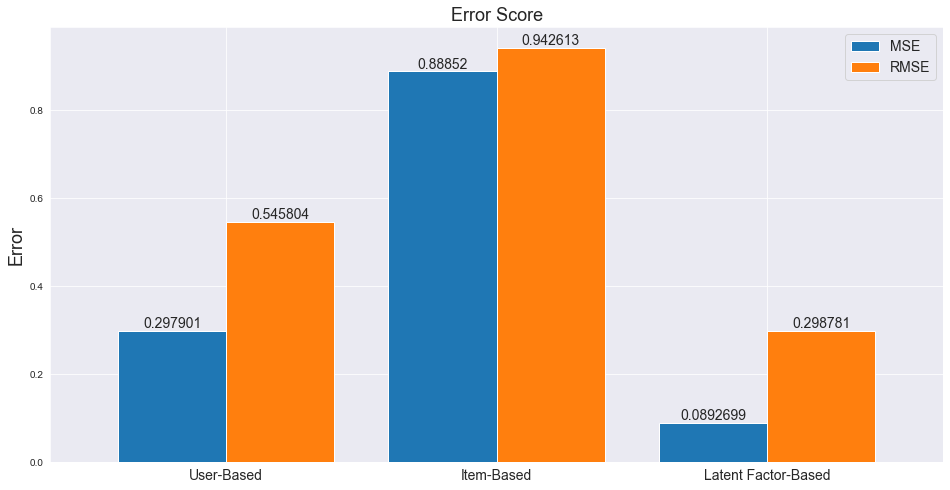

In [49]:
mse_scores = [user_mse, item_mse, svd_mse]
rmse_scores = [user_rmse, item_rmse, svd_rmse]
model_names = ['User-Based', 'Item-Based', 'Latent Factor-Based']

df_error = pd.DataFrame({'MSE': mse_scores,
                   'RMSE': rmse_scores})
df_error['model'] = model_names
fig = df_error.plot(x='model', y=['MSE', 'RMSE'],
                    kind='bar', figsize=(16, 8), width=0.8)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.bar_label((fig.containers[1]), label_type='edge', fontsize=14)
fig.set_xlabel("")
fig.set_ylabel('Error', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.legend(fontsize=14)
plt.xticks(rotation=0)

fig.set_title('Error Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 30. Bar Plot Comparing Error Scores between Different Methods of Recommender System</center>
</span>

#### Coverage Scores

Coverage is the percent of items in the training data the model can recommend on a test set.[9][11]

$$coverage=\frac{I}{N}\times100%$$

Where 'I' is the number of unique items the model recommends in the test data, and 'N' is the total number of unique items in the training data. The catalog coverage is the rate of distinct items recommended over a period of time to the user. For this purpose, the catalog coverage function take also as parameter 'k' the number of observed recommendation lists. In essence, both metrics quantify the proportion of items that the system can work with. [13]

To better understand this, say we have 100 items in our training data, and we set the number of recommendations=10 where the recommendations are always the same set of items for all users. Then this would mean that the coverage is only 10% since it only ever recommends the same 10 items from the original data. In math terms, it is the union of all user recommendations over the total number of items.

Here, the user-based collaborative filtering has an 18.97% coverage, while the item-based collaborative filtering is only able to recommend 1.58% of the items it was trained on. The recommender system with the highest coverage is the latent factor-based collaborative filtering with 41.42% coverage.

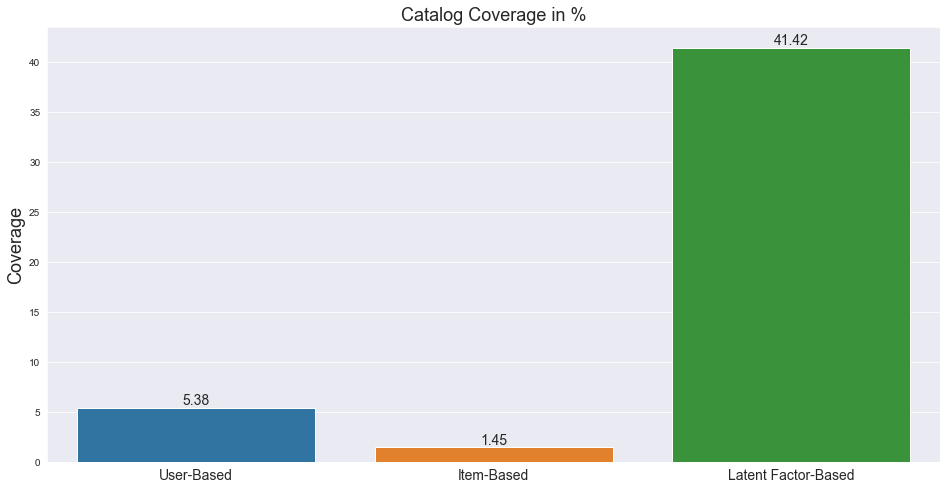

In [50]:
# plot of prediction coverage
coverage_scores = [user_coverage, item_coverage, svd_coverage]
model_names = ['User-Based', 'Item-Based', 'Latent Factor-Based']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=coverage_scores)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.set_ylabel('Coverage', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Catalog Coverage in %', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 31. Bar Plot Comparing Coverage Scores between Different Methods of Recommender System</center>
</span>

#### Novelty Scores

Novelty measures the capacity of a recommender system to propose novel and unexpected items which a user is unlikely to know about already. It uses the self-information of the recommended item and it calculates the mean self-information per top-N recommended list and averages them over all users.[13]

$$novelty=\frac{1}{\left|U\right|}\sum_{\forall u\in U}\sum_{\forall i\in topN}\frac{\log_2\left(\frac{count\left(i\right)}{\left|U\right|}\right)}{\left|N\right|}$$

Where the absolute U is the number of users, count(i) is the number of users who consumed the specific item and N is the length of the recommended list.[13]

The novelty metric in recommender systems measures the degree to which recommended items are new and unexpected to the user. It is a way of quantifying how much the recommendations can introduce the user to new items that they have not previously encountered or considered. [8][10]

The novelty metric is important in recommender systems because it can help to prevent the problem of "filter bubbles," where users are only recommended items that align with their existing preferences and interests. By introducing users to new and unexpected items, recommender systems can help to broaden their horizons and expose them to new ideas and experiences. [8][10]

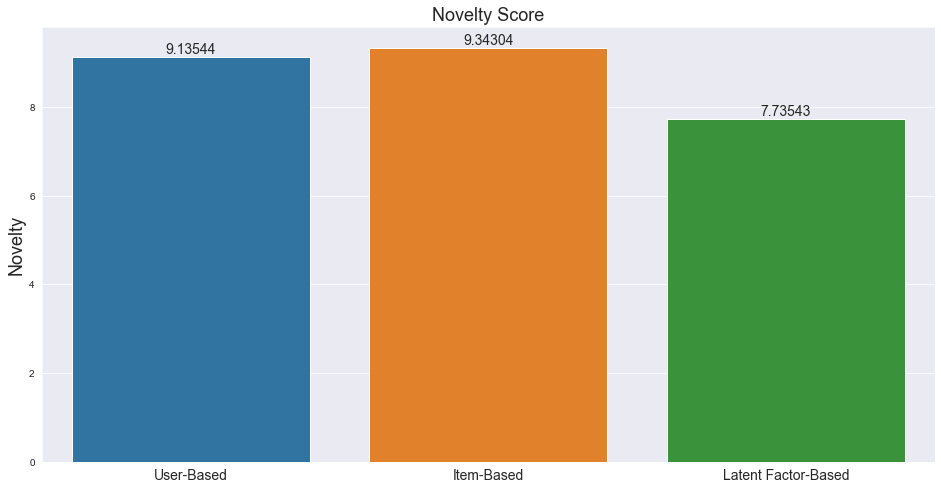

In [51]:
users = df_melt["user_id"].value_counts()
# users = users[users>=5].index.tolist()
users = users.index.tolist()

nov = df_melt.recipe_id.value_counts()
pop = dict(nov)
# pop
user_novelty,user_mselfinfo_list = recmetrics.novelty(user_recs, pop,
                                                      len(users), 10)
item_novelty,item_mselfinfo_list = recmetrics.novelty(item_recs, pop,
                                                      len(users), 10)
svd_novelty,svd_mselfinfo_list = recmetrics.novelty(svd_recs, pop,
                                                    len(users), 10)


novelty_scores = [user_novelty, item_novelty, svd_novelty]
model_names = ['User-Based', 'Item-Based', 'Latent Factor-Based']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=novelty_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Novelty', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Novelty Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 32. Bar Plot Comparing Novelty Scores between Different Methods of Recommender System</center>
</span>

#### Personalization Scores

Personalization is a great way to assess if a model recommends many of the same items to different users. It is the dissimilarity (1- cosine similarity) between a user’s lists of recommendations. An example will best illustrate how personalization is calculated. [9]

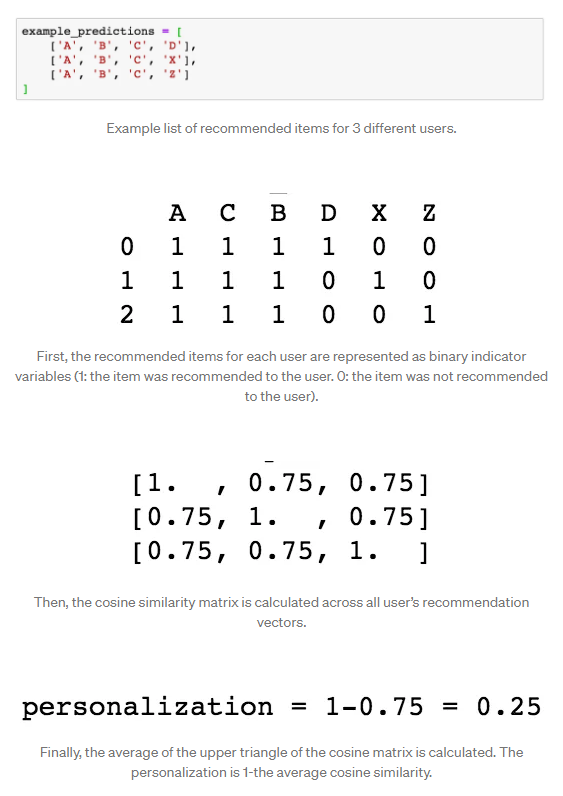

A high personalization score indicates a user’s recommendations are different, meaning the model is offering a personalized experience to each user. [9]

**Summary:**
- A high score indicates good personalization (a user's lists of recommendations are different). 
- A low score indicates poor personalization (a user's lists of recommendations are very similar).
- A model is "personalizing" well if the set of recommendations for each user is different.[12]

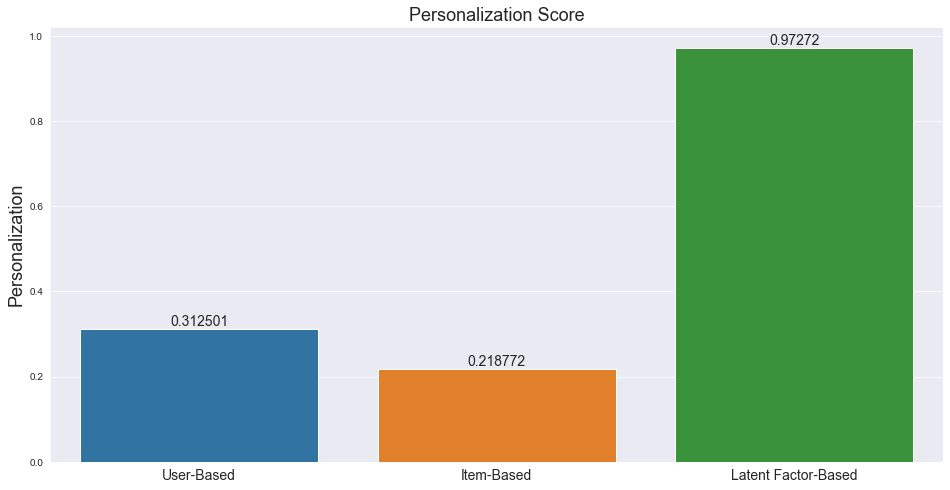

In [52]:
user_personal = recmetrics.personalization(predicted=user_recs)
item_personal = recmetrics.personalization(predicted=item_recs)
svd_personal = recmetrics.personalization(predicted=svd_recs)

personal_scores = [user_personal, item_personal, svd_personal]
model_names = ['User-Based', 'Item-Based', 'Latent Factor-Based']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=personal_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Personalization', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Personalization Score', fontsize=18);

#### Intra-list Similarity Scores

The intra-list similarity is the average cosine similarity of all items in a list of recommendations. This calculation uses features of the recommended items (such as movie genre) to calculate the similarity. This calculation is also best illustrated with an example. [9]

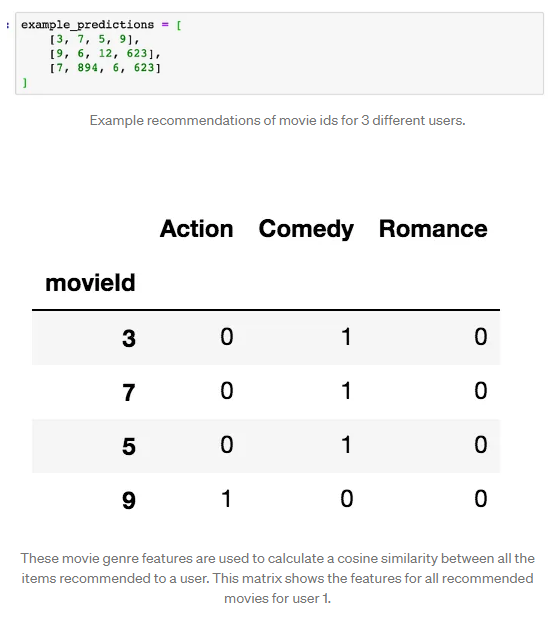

If a recommender system is recommending lists of very similar items to single users (for example, a user receives only recommendations of romance movies), then the intra-list similarity will be high. [9]

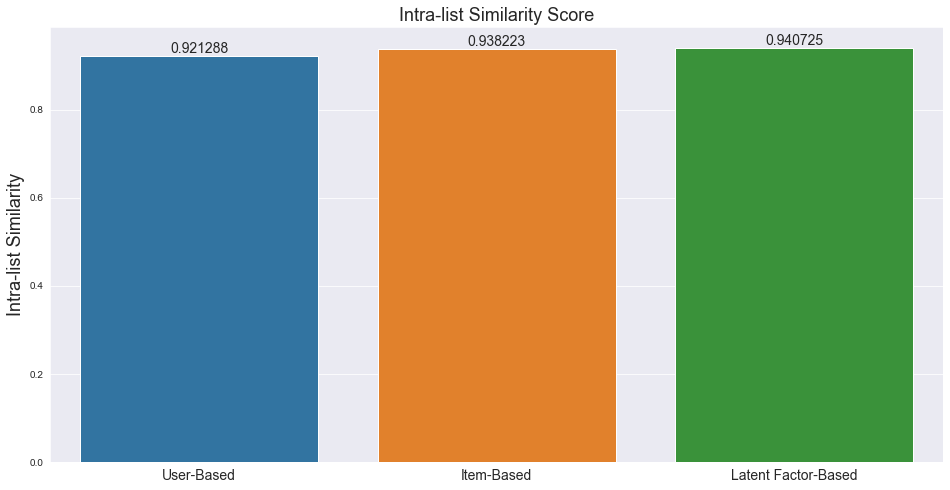

In [53]:
user_intra = recmetrics.intra_list_similarity(user_recs, df_dessert_final)
item_intra = recmetrics.intra_list_similarity(item_recs, df_dessert_final)
svd_intra = recmetrics.intra_list_similarity(svd_recs, df_dessert_final)

intra_scores = [user_intra, item_intra, svd_intra]
model_names = ['User-Based', 'Item-Based', 'Latent Factor-Based']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=intra_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Intra-list Similarity', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Intra-list Similarity Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 33. Bar Plot Comparing Intra-list Similarity Scores between Different Methods of Recommender System</center>
</span>

#### Metrics Radar Plot Summary

Now that we have all the scores for each recommender system, let us compare them using a radar plot. Here, we compare the personalization, coverage, and intra-list similarity. The reason why novelty and error scores are not part of this radar plot is that they operate under a different scale and must be visualized differently. Regardless, let us proceed with the comparison using the radar plot.

How do we know that one model is outperforming the others? In a radar plot, the model that has the largest area is considered to be the best performing.

In this case, the latent-factor-based model outperforms the other two by quite a huge margin, especially in personalization and coverage.

In [54]:
# recmetrics.metrics_plot(model_names=model_names,
#              coverage_scores=coverage_scores,
#              personalization_scores=personal_scores,
#              intra_list_similarity_scores = intra_scores)

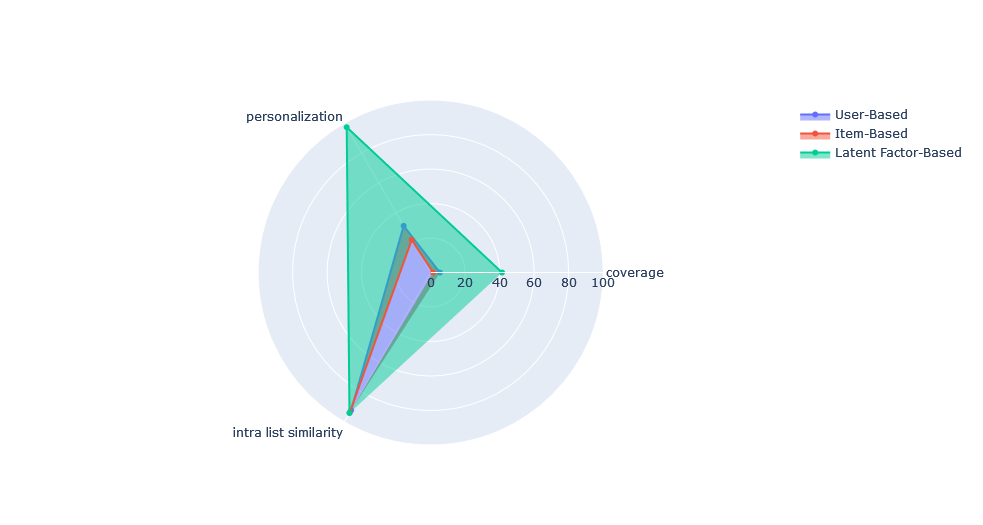

<span style="font-size: 12px">
    <center>Figure 34. Radar Plot Comparing Scores between Different Methods of Recommender System</center>
</span>

#### Metrics Table Summary

Let us put all the values in a single table so we can compare the numbers. Let us summarize these metrics and put them into context:

1. **MSE and RMSE** - *Lower is better*. This measures the accuracy of the recommendations made by the system.
2. **Coverage** - *Higher is better*. This measures the proportion of items in the catalog that are recommended by the system. A high coverage indicates that the system can recommend a large number of items.
3. **Novelty** - *Contextual*. This measures the novelty of the recommendations made by the system. A high novelty indicates that the system recommends items that the user has not seen before. Users however may prefer a more balanced novelty.
4. **Personalization** - *Higher is better*. This measures how personalized the recommendations are for each user. A high personalization metric indicates that the recommendations are tailored to the individual user's preferences and needs, rather than being generic or popular recommendations.
5. **Intra-list-Similarity** - *Higher is better*. This measures the similarity between the items in a list of recommendations. A low intra-list similarity metric indicates that the recommendations are diverse and cover a wide range of items, while a high intra-list similarity metric indicates that the recommendations are similar to each other and may not offer much variety (this is desirable).

In [55]:
model_names = ['User-Based', 'Item-Based', 'Latent Factor-Based']
metric_name = ['MSE', 'RMSE', 'Coverage', 'Novelty',
               'Personalization', 'Intra-list Similarity']
summary_matrics = [mse_scores,
                   rmse_scores,
                   coverage_scores,
                   novelty_scores,
                   personal_scores,
                   intra_scores]

df_summary_base = pd.DataFrame(data=summary_matrics,
                               columns=model_names,
                               index=metric_name)
display(df_summary_base)

,User-Based,Item-Based,Latent Factor-Based
MSE,0.297901,0.888520,0.089270
RMSE,0.545804,0.942613,0.298781
Coverage,5.380000,1.450000,41.420000
Novelty,9.135441,9.343042,7.735434
Personalization,0.312501,0.218772,0.972720
Intra-list Similarity,0.921288,0.938223,0.940725


<span style="font-size: 12px">
    <center>Table 21. Sumamry of Metrics between the Different Methods of Recommender System</center>
</span>

From these values, it is apparent that the **latent-factor-based model** heavily outperforms the other models. Moving forward, we will be using the **latent-factor-based model (SVD)** to conduct cluster-specific recommendations.

## Recommender System per Cluster of Users

Now we do the same thing in the next sections. This time, however, we incorporate clustering with recommender systems. First, we will tackle user-cluster-specific recommendations. What does this mean?

Users are first grouped into clusters based on their preferences or behaviors. Then, recommendations are generated for each user based on the preferences of other users in the same cluster. This approach can help overcome the cold-start problem where new users or items have limited data available for recommendation

### User-cluster-specific recommendation for user_cluster 0

These are the recommendations for User Cluster 0.

In [56]:
user_index_0 = df_user_cluster.loc[df_user_cluster.cluster == 0].index
user_cluster_0 = df_user_ratings.loc[user_index_0].reset_index()\
                                .melt('user_id',var_name='recipe_id',
                                      value_name='rating').dropna()

df_melt = user_cluster_0.copy()
rating_scale = (0,5)
method = SVD(random_state=69)
user_list = user_cluster_0['user_id'].unique()[0:5]

u0_rec, u0_pred = recsys(df_melt, rating_scale, method, user_list, df_name)
display(u0_rec)

804851  \
                                        Likes   
Top1  catherine s excellent yorkshire pudding   
Top2            hidden chocolate mint cookies   
Top3       champorado  chocolate rice pudding   
Top4         aunt gerry s peanut butter fudge   
Top5              linda s frozen fruit sicles   

                                                              804550  \
                                Recommends                     Likes   
Top1                 easy cake mix cookies  caramel apple milkshakes   
Top2          grandma s soft sugar cookies         warm cocoa coffee   
Top3  christmas rum balls or bourbon balls          chocolate panini   
Top4                  creamsicle ice cream             mocha delight   
Top5    individual mini cherry cheesecakes          giggly cow creme   

                                               \
                                   Recommends   
Top1  catherine s excellent yorkshire pudding   
Top2                           apple pie cake   
Top3                       low fat fudge bars   
Top4                        healthy pie crust   
Top5               heloise s cake mix cookies   

                                              723491  \
                                               Likes   
Top1                                french pecan pie   
Top2                       never fail chocolate cake   
Top3  rich creamy chocolate peanut butter milk shake   
Top4  kittencal s bakery buttercream  frosting icing   
Top5                 strawberry rhubarb streusel pie   

                                            \
                                Recommends   
Top1                  lemon sour cream pie   
Top2          easy chocolate dipping sauce   
Top3          black coffee  chocolate cake   
Top4                         easy frosting   
Top5  christmas rum balls or bourbon balls   

                                        162826  \
                                         Likes   
Top1                   mashed sweet potato pie   
Top2  those pretzel things   pecan rollo bites   
Top3        chocolate mocha pudding   low carb   
Top4                 aunt tootsie s lemon cake   
Top5    southern style lemon chess pie filling   

                                                                       294435  \
                                Recommends                              Likes   
Top1            cake mix chocolate cookies            banana orange ice cream   
Top2                quick n easy fruit dip                    sour cherry pie   
Top3          black coffee  chocolate cake           microwave peanut brittle   
Top4                       chewy macaroons  meringue cookies or cloud cookies   
Top5  christmas rum balls or bourbon balls                 chilled fruit soup   

                                            
                                Recommends  
Top1       layer cookies  magic layer bars  
Top2          black coffee  chocolate cake  
Top3  christmas rum balls or bourbon balls  
Top4      orange chocolate ice cream sauce  
Top5   vanilla almond rice krispies treats

<span style="font-size: 12px">
    <center>Table 22. Overview of Likes and Recommendation Specific to Cluster 0 of User Profile</center>
</span>

In [57]:
df_u0_pred = pd.DataFrame(u0_pred)
df_u0_pred.drop("details", inplace=True, axis=1)
df_u0_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_u0_pred.head()
u0_mse = recmetrics.mse(df_u0_pred.actual, df_u0_pred.user_predictions)
u0_rmse = recmetrics.rmse(df_u0_pred.actual, df_u0_pred.user_predictions)

print("MSE: ", u0_mse)
print("RMSE: ", u0_rmse)

MSE:  0.08857668355737312
RMSE:  0.29761835218509813


In [58]:
u0_model = df_u0_pred.pivot_table(index='user_id', columns='recipe_id',
                                  values='user_predictions').fillna(0)

df_u0_pred = df_u0_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_u0_pred = df_u0_pred.set_index("user_id")

u0_recs = [] = []
for user in df_u0_pred.index:
    u0_predictions = get_users_predictions(user, 10, u0_model)
    u0_recs.append(u0_predictions)
        
df_u0_pred['user_predictions'] = u0_recs

catalog = df_melt.recipe_id.unique().tolist()
u0_coverage = recmetrics.prediction_coverage(u0_recs, catalog)
print("Coverage: ", u0_coverage)

Coverage:  42.66


### User-cluster-specific recommendation for user_cluster 1

These are the recommendations for User Cluster 1

In [59]:
user_index_1 = df_user_cluster.loc[df_user_cluster.cluster == 1].index
user_cluster_1 = df_user_ratings.loc[user_index_1].reset_index()\
                                .melt('user_id',var_name='recipe_id',
                                      value_name='rating').dropna()

df_melt = user_cluster_1.copy()
rating_scale = (0,5)
method = SVD(random_state=69)
user_list = user_cluster_1['user_id'].unique()[0:5]

u1_rec, u1_pred = recsys(df_melt, rating_scale, method, user_list, df_name)
display(u1_rec)

324621                                \
                              Likes                    Recommends   
Top1              healthy pie crust         pumpkin bundt cake ii   
Top2        raspberry sherbet punch   coconut condensed milk cake   
Top3   paige s buttercream frosting                cranberry bars   
Top4  caramel cake frosting   icing  no bake vanilla orange balls   
Top5          cake decorating icing       zucchini chocolate cake   

                         198154  \
                          Likes   
Top1     peanut butter blossoms   
Top2           pumpkin cupcakes   
Top3             diet coke cake   
Top4     chocolate yogurt melts   
Top5  4 points   diet soda cake   

                                                     \
                                         Recommends   
Top1                          cappuccino rum shakes   
Top2  chocolate dipped krispies peanut butter balls   
Top3                      chocolate icing  frosting   
Top4                            butterscotch treats   
Top5                              ila s apple crisp   

                                    255179  \
                                     Likes   
Top1  kittencal s chocolate frosting icing   
Top2                        amish brownies   
Top3              cake decorators frosting   
Top4                    chocolate frosting   
Top5            heloise s cake mix cookies   

                                                    \
                                        Recommends   
Top1                        soft coconut macaroons   
Top2         peanut butter chocolate chunk cookies   
Top3                  baileys irish cream truffles   
Top4  hg s quickie caramel custard   ww points   2   
Top5           amish boiled cookies    2 ww points   

                                        8629    \
                                         Likes   
Top1              ultimate chocolate chip bars   
Top2             easy cherry pie filling crisp   
Top3               chocolate glaze or frosting   
Top4  butter cream icing  buttercream frosting   
Top5                              single crepe   

                                                     \
                                         Recommends   
Top1                                  ghost cookies   
Top2  easy chocolate shop microwave chocolate fudge   
Top3                    german chocolate cake icing   
Top4                           graham cracker crust   
Top5                         linda s apple brownies   

                                                 136511  \
                                                  Likes   
Top1                  fast and easy coconut custard pie   
Top2             deep dish apple pie with its own crust   
Top3  pink stuff     cherry pie filling  pineapple d...   
Top4                                 chips ahoy dessert   
Top5                       bisquick chocolate chip bars   

                                          
                              Recommends  
Top1                  sugar cookie icing  
Top2      chocolate covered strawberries  
Top3         coconut condensed milk cake  
Top4  nif s peanut butter banana muffins  
Top5             vegan chocolate pudding

<span style="font-size: 12px">
    <center>Table 23. Overview of Likes and Recommendation Specific to Cluster 1 of User Profile</center>
</span>

In [60]:
df_u1_pred = pd.DataFrame(u1_pred)
df_u1_pred.drop("details", inplace=True, axis=1)
df_u1_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_u1_pred.head()
u1_mse = recmetrics.mse(df_u1_pred.actual, df_u1_pred.user_predictions)
u1_rmse = recmetrics.rmse(df_u1_pred.actual, df_u1_pred.user_predictions)

print("MSE: ", u1_mse)
print("RMSE: ", u1_rmse)

MSE:  0.09002211436803476
RMSE:  0.30003685501623756


In [61]:
u1_model = df_u1_pred.pivot_table(index='user_id', columns='recipe_id',
                                  values='user_predictions').fillna(0)

df_u1_pred = df_u1_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_u1_pred = df_u1_pred.set_index("user_id")

u1_recs = [] = []
for user in df_u1_pred.index:
    u1_predictions = get_users_predictions(user, 10, u1_model)
    u1_recs.append(u1_predictions)
        
df_u1_pred['user_predictions'] = u1_recs

catalog = df_melt.recipe_id.unique().tolist()
u1_coverage = recmetrics.prediction_coverage(u1_recs, catalog)
print("Coverage: ", u1_coverage)

Coverage:  52.97


### Comparison of Evaluation Metrics

These are the evaluation results for each set of recommendations made, for user cluster 0 and user cluster 1.

#### Error Scores

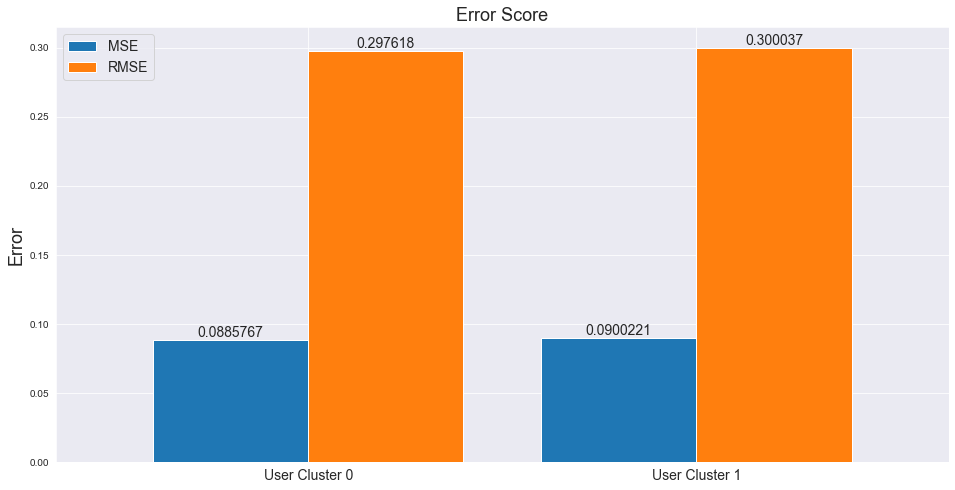

In [62]:
mse_scores = [u0_mse, u1_mse]
rmse_scores = [u0_rmse, u1_rmse,]
model_names = ['User Cluster 0', 'User Cluster 1']

df_error = pd.DataFrame({'MSE': mse_scores,
                   'RMSE': rmse_scores})
df_error['model'] = model_names
fig = df_error.plot(x='model', y=['MSE', 'RMSE'],
                    kind='bar', figsize=(16, 8), width=0.8)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.bar_label((fig.containers[1]), label_type='edge', fontsize=14)
fig.set_xlabel("")
fig.set_ylabel('Error', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.legend(fontsize=14)
plt.xticks(rotation=0)

fig.set_title('Error Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 35. Bar Plot Comparing Error Scores between Recommender System Specific to User Profile Clusters</center>
</span>

#### Coverage Scores

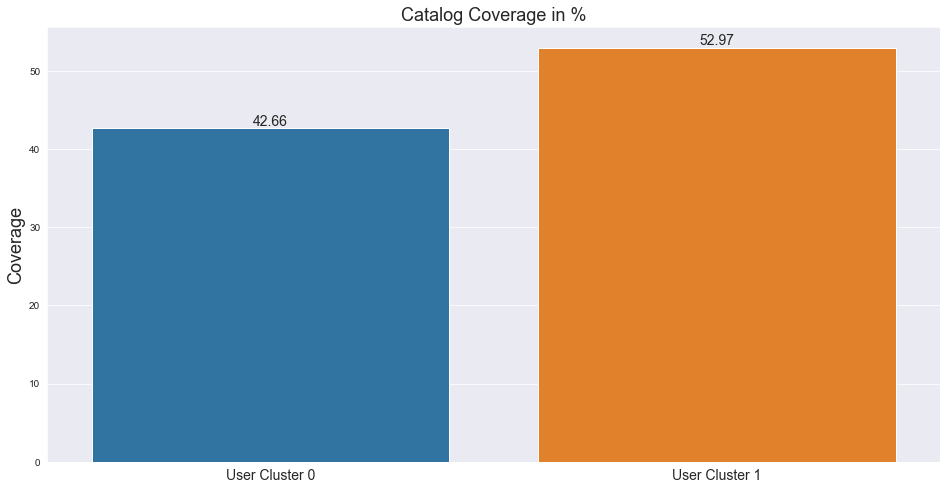

In [63]:
# plot of prediction coverage
coverage_scores = [u0_coverage, u1_coverage]
model_names = ['User Cluster 0', 'User Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=coverage_scores)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.set_ylabel('Coverage', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Catalog Coverage in %', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 36. Bar Plot Comparing Coverage Scores between Recommender System Specific to User Profile Clusters</center>
</span>

#### Novelty Scores

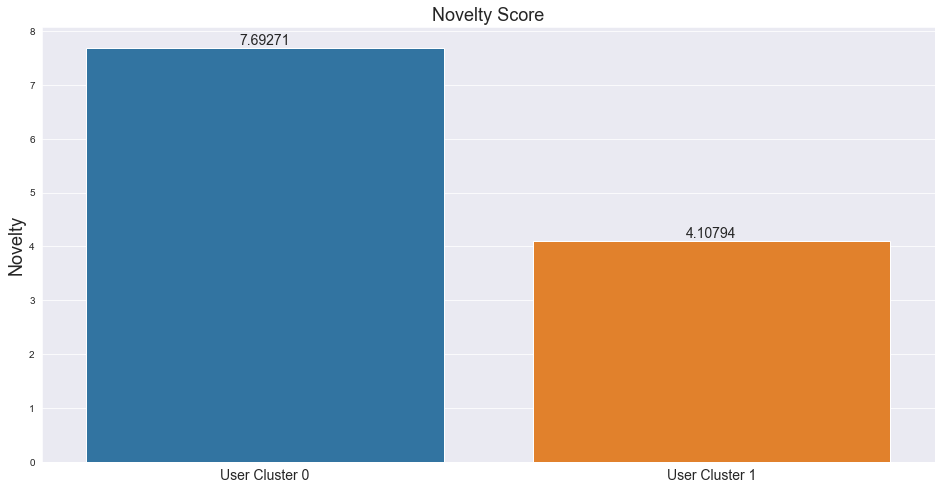

In [64]:
users0 = user_cluster_0["user_id"].value_counts()
users0 = users0.index.tolist()

users1 = user_cluster_1["user_id"].value_counts()
users1 = users1.index.tolist()

nov1 = user_cluster_0.recipe_id.value_counts()
pop1 = dict(nov)

nov2 = user_cluster_1.recipe_id.value_counts()
pop2 = dict(nov)
# pop
u0_novelty,u0_mselfinfo_list = recmetrics.novelty(u0_recs, pop1,
                                                  len(users0), 10)
u1_novelty,u1_mselfinfo_list = recmetrics.novelty(u1_recs, pop2,
                                                  len(users1), 10)

novelty_scores = [u0_novelty, u1_novelty]
model_names = ['User Cluster 0', 'User Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=novelty_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Novelty', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Novelty Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 37. Bar Plot Comparing Novelty Scores between Recommender System Specific to User Profile Clusters</center>
</span>

#### Personalization Scores

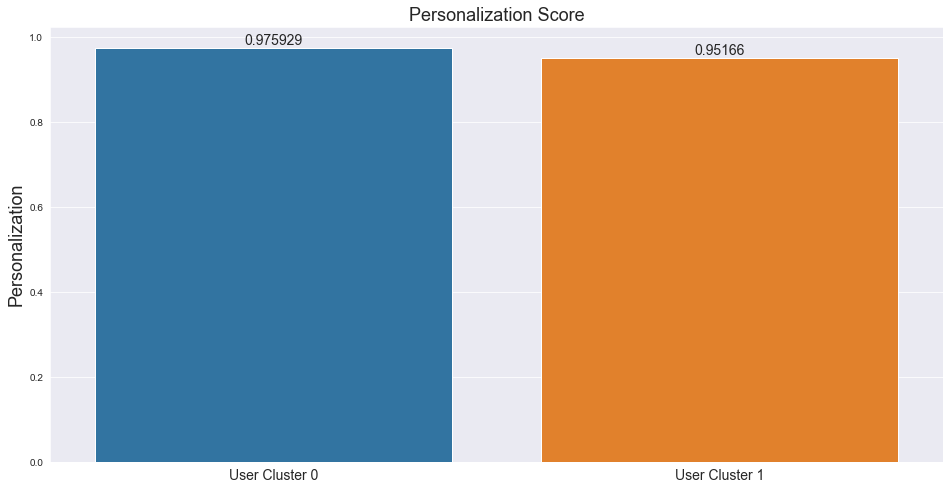

In [65]:
u0_personal = recmetrics.personalization(predicted=u0_recs)
u1_personal = recmetrics.personalization(predicted=u1_recs)


personal_scores = [u0_personal, u1_personal]
model_names = ['User Cluster 0', 'User Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=personal_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Personalization', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Personalization Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 38. Bar Plot Comparing Personalization Scores between Recommender System Specific to User Profile Clusters</center>
</span>

#### Intra-list Similarity Scores

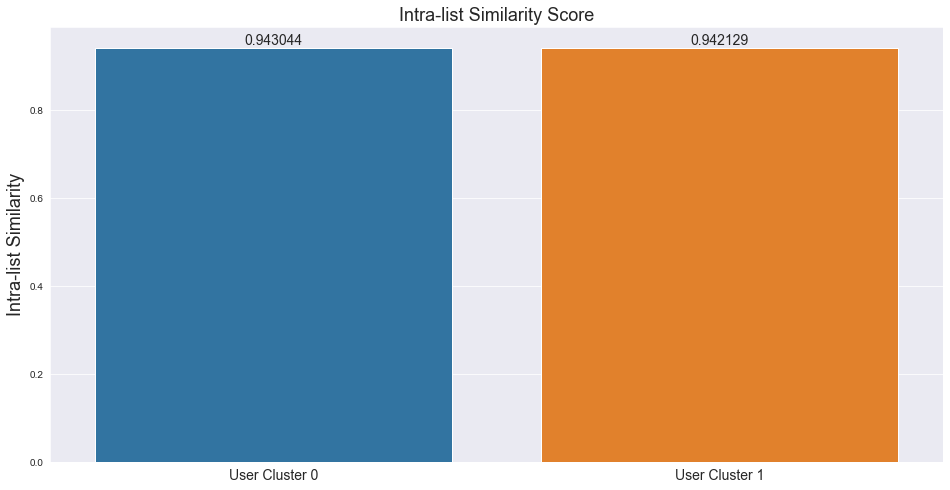

In [66]:
rated_recipe0 = user_cluster_0['recipe_id'].tolist()
item_mat_0 = df_dessert_final.loc[df_dessert_final.index.isin(rated_recipe0)]

rated_recipe1 = user_cluster_1['recipe_id'].tolist()
item_mat_1 = df_dessert_final.loc[df_dessert_final.index.isin(rated_recipe1)]

u0_intra = recmetrics.intra_list_similarity(u0_recs, item_mat_0)
u1_intra = recmetrics.intra_list_similarity(u1_recs, item_mat_1)

intra_scores = [u0_intra, u1_intra]
model_names = ['User Cluster 0', 'User Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=intra_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Intra-list Similarity', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Intra-list Similarity Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 39. Bar Plot Comparing Intra-list Similarity Scores between Recommender System Specific to User Profile Clusters</center>
</span>

#### Metrics Radar Plot Summary

In [67]:
# recmetrics.metrics_plot(model_names=model_names,
#              coverage_scores=coverage_scores,
#              personalization_scores=personal_scores,
#              intra_list_similarity_scores = intra_scores)

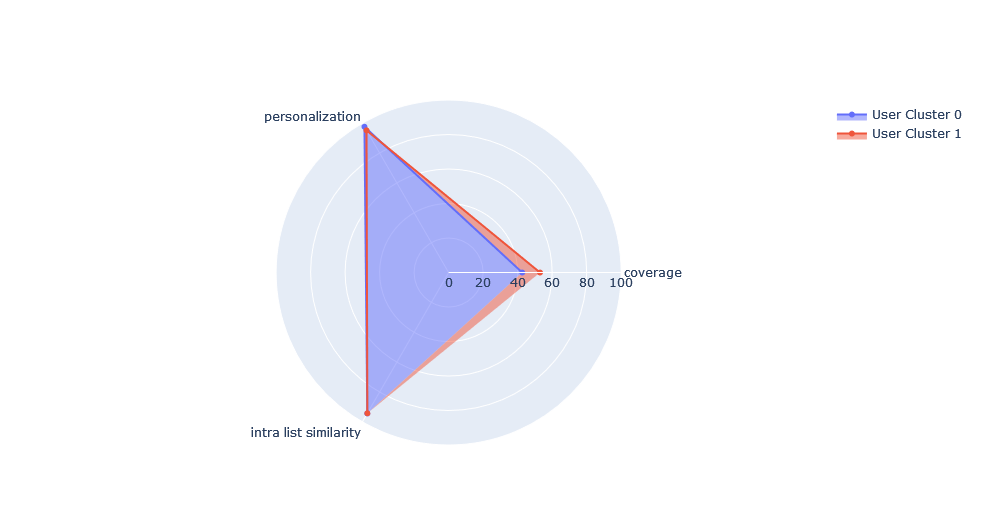

<span style="font-size: 12px">
    <center>Figure 40. Radar Plot Comparing Scores between Recommender System Specific to User Profile Clusters</center>
</span>

## Recommender System per Cluster of Items

Earlier, we did user-cluster-specific recommendations. This time, we will do item-cluster-specific recommendations. What does this mean?

Clustering item profiles are used to group similar items together based on their characteristics and attributes. This helps to improve the accuracy and efficiency of the recommendation process by reducing the amount of computation needed to find relevant items for a user.

By grouping similar items, the system can make recommendations that are more tailored to a user's preferences, since items within a cluster are likely to have similar appeal. Moreover, clustering item profiles can help to address the problem of cold start.

### Item-cluster-specific recommendation for item_cluster 0

These are the recommendations for item cluster 0.

In [68]:
item_index_0 = df_dessert_cluster.loc[df_dessert_cluster.cluster == 0].index
item_cluster_0 = df_user_ratings[item_index_0].reset_index()\
                                .melt('user_id',var_name='recipe_id',
                                      value_name='rating').dropna()
df_melt = item_cluster_0.copy()
rating_scale = (0,5)
method = SVD(random_state=69)
user_list = item_cluster_0['user_id'].unique()[0:5]

i0_rec, i0_pred = recsys(df_melt, rating_scale, method, user_list, df_name)
display(i0_rec)

126440  \
                                                  Likes   
Top1                         microwave scalloped apples   
Top2               christmas rum balls or bourbon balls   
Top3                          austrian strawberry torte   
Top4  chocolate chip cannoli filling  w kahlua   cre...   
Top5   authentic no refrigeration bakery frosting icing   

                                          \
                              Recommends   
Top1             banana orange ice cream   
Top2     chocolate coffee ice cream soda   
Top3  coffee punch with ice cream floats   
Top4          heloise s cake mix cookies   
Top5               pumpkin bundt cake ii   

                                          104295  \
                                           Likes   
Top1      no bake honey   oat peanut butter bars   
Top2                    molasses oatmeal cookies   
Top3                        banana tahini malted   
Top4                        chocolate madeleines   
Top5  weight watchers 1 point ice cream sandwich   

                                                \
                                    Recommends   
Top1                             mocha delight   
Top2  frozen chocolate chip cookie dough balls   
Top3                 diabetic maple cheesecake   
Top4         sauteed strawberries with a twist   
Top5                           caramel filling   

                                       176615                                  \
                                        Likes                      Recommends   
Top1                     lemon sour cream pie                lemon jello cake   
Top2                         almost apple pie  chocolate lovers favorite cake   
Top3    tapioca pudding  using minute tapioca           easy cake mix cookies   
Top4      kittencal s easy creamy white glaze                    fruit sorbet   
Top5  the best oatmeal chocolate chip cookies                  special k bars   

                                    494084  \
                                     Likes   
Top1            door county cherry dessert   
Top2    healthy for them  yogurt popsicles   
Top3           decorator buttercream icing   
Top4  simple mint chocolate chip ice cream   
Top5                  graham cracker crust   

                                                \
                                    Recommends   
Top1  those pretzel things   pecan rollo bites   
Top2                           easy pecan bars   
Top3               best zucchini brownies ever   
Top4       kittencal s easy creamy white glaze   
Top5                   creamy brownie frosting   

                                                 56251   \
                                                  Likes   
Top1                       ultimate chocolate chip bars   
Top2                    lemon pineapple can can dessert   
Top3                            sweet lite fluffy stuff   
Top4                      peanut butter no bake cookies   
Top5  pink stuff     cherry pie filling  pineapple d...   

                                                        
                                            Recommends  
Top1                            quick n easy fruit dip  
Top2                     white chocolate covered oreos  
Top3  nestle  toll house walnut pie  aka black cat pie  
Top4                                creamy fruit salad  
Top5      strawberries with sour cream and brown sugar

<span style="font-size: 12px">
    <center>Table 24. Overview of Likes and Recommendation Specific to Cluster 0 of Item Profile</center>
</span>


In [69]:
df_i0_pred = pd.DataFrame(i0_pred)
df_i0_pred.drop("details", inplace=True, axis=1)
df_i0_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_i0_pred.head()
i0_mse = recmetrics.mse(df_i0_pred.actual, df_i0_pred.user_predictions)
i0_rmse = recmetrics.rmse(df_i0_pred.actual, df_i0_pred.user_predictions)
print("MSE: ", i0_mse)
print("RMSE: ", i0_rmse)

MSE:  0.08758545524004101
RMSE:  0.2959483996240578


In [70]:
i0_model = df_i0_pred.pivot_table(index='user_id', columns='recipe_id',
                                  values='user_predictions').fillna(0)

df_i0_pred = df_i0_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_i0_pred = df_i0_pred.set_index("user_id")

i0_recs = [] = []
for user in df_i0_pred.index:
    i0_predictions = get_users_predictions(user, 10, i0_model)
    i0_recs.append(i0_predictions)
        
df_i0_pred['user_predictions'] = i0_recs

catalog = df_melt.recipe_id.unique().tolist()
i0_coverage = recmetrics.prediction_coverage(i0_recs, catalog)
print("Coverage: ", i0_coverage)

Coverage:  43.22


### Item-cluster-specific recommendation for item_cluster 1

These are the recommendations for item cluster 1.

In [71]:
item_index_1 = df_dessert_cluster.loc[df_dessert_cluster.cluster == 1].index
item_cluster_1 = df_user_ratings[item_index_1].reset_index()\
                                .melt('user_id',var_name='recipe_id',
                                      value_name='rating').dropna()
df_melt = item_cluster_1.copy()
rating_scale = (0,5)
method = SVD(random_state=69)
user_list = item_cluster_1['user_id'].unique()[0:5]

i1_rec, i1_pred = recsys(df_melt, rating_scale, method, user_list, df_name)
display(i1_rec)

68526                                                      \
                  Likes                                         Recommends   
Top1         wacky cake  peanut butter cookies  johnny cash s mother s ...   
Top2  grape nut pudding                              blender chocolate pie   
Top3               None                             sarah s  m   m cookies   
Top4               None                                  nubbly apple cake   
Top5               None                              butternut squash cake   

                 453856                                                  \
                  Likes                                      Recommends   
Top1         wacky cake                               mija  greek candy   
Top2  fall pumpkin cake             out of this world chocolate cookies   
Top3               None          no bake cookies with a measure of love   
Top4               None           paula deen s apple butter pumpkin pie   
Top5               None  chocolate chip bundt cake with chocolate glaze   

                              814629  \
                               Likes   
Top1                      wacky cake   
Top2         sweet potato pie my eye   
Top3  10 minute german chocolate pie   
Top4                            None   
Top5                            None   

                                                         \
                                             Recommends   
Top1                      pumpkin pie   simply the best   
Top2                    my favorite chocolate chip cake   
Top3           eggless  milkless  butterless spice cake   
Top4                                   pig lickin  cake   
Top5  peanut butter cookies  johnny cash s mother s ...   

                             204024                                   \
                              Likes                       Recommends   
Top1        sand castle brownie mix           jeanie s cake frosting   
Top2  pumpkin pie   simply the best                     hurry up pie   
Top3                5 min ice cream       lacy oatmeal crisp cookies   
Top4             100 chocolate cake  my favorite chocolate chip cake   
Top5                           None                 perfect plum pie   

                             452940  \
                              Likes   
Top1          cocada  coconut candy   
Top2       frosty peach pie supreme   
Top3  250 00 chocolate chip cookies   
Top4                           None   
Top5                           None   

                                                  
                                      Recommends  
Top1  ina gartens chocolate buttercream frosting  
Top2              julie s chocolate chip cookies  
Top3                         apple and date loaf  
Top4                             easy apple cake  
Top5                          chocolate frosting

<span style="font-size: 12px">
    <center>Table 25. Overview of Likes and Recommendation Specific to Cluster 1 of Item Profile</center>
</span>

In [72]:
df_i1_pred = pd.DataFrame(i1_pred)
df_i1_pred.drop("details", inplace=True, axis=1)
df_i1_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_i1_pred.head()
i1_mse = recmetrics.mse(df_i1_pred.actual, df_i1_pred.user_predictions)
i1_rmse = recmetrics.rmse(df_i1_pred.actual, df_i1_pred.user_predictions)
print("MSE: ", i1_mse)
print("RMSE: ", i1_rmse)

MSE:  0.03239958567086679
RMSE:  0.1799988490820616


In [73]:
i1_model = df_i1_pred.pivot_table(index='user_id', columns='recipe_id',
                                  values='user_predictions').fillna(0)

df_i1_pred = df_i1_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_i1_pred = df_i1_pred.set_index("user_id")

i1_recs = [] = []
for user in df_i1_pred.index:
    i1_predictions = get_users_predictions(user, 10, i1_model)
    i1_recs.append(i1_predictions)
        
df_i1_pred['user_predictions'] = i1_recs

catalog = df_melt.recipe_id.unique().tolist()
i1_coverage = recmetrics.prediction_coverage(i1_recs, catalog)
print("Coverage: ", i1_coverage)

Coverage:  82.01


### Comparison of Evaluation Metrics

These are the evaluation results for each set of recommendations made, for item cluster 0 and item cluster 1.

#### Error Score

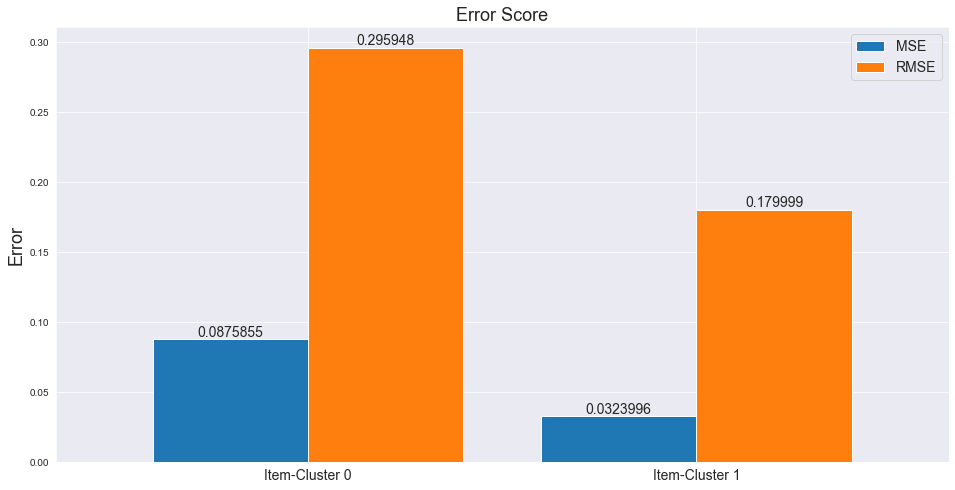

In [74]:
# mse_scores = [i0_mse, i1_mse, i2_mse]
# rmse_scores = [i0_rmse, i1_rmse, i1_rmse]
# model_names = ['Item-Cluster 0', 'Item-Cluster 1', 'Item-Cluster 2']

mse_scores = [i0_mse, i1_mse]
rmse_scores = [i0_rmse, i1_rmse]
model_names = ['Item-Cluster 0', 'Item-Cluster 1']

df_error = pd.DataFrame({'MSE': mse_scores,
                   'RMSE': rmse_scores})
df_error['model'] = model_names
fig = df_error.plot(x='model', y=['MSE', 'RMSE'],
                    kind='bar', figsize=(16, 8), width=0.8)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.bar_label((fig.containers[1]), label_type='edge', fontsize=14)
fig.set_xlabel("")
fig.set_ylabel('Error', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.legend(fontsize=14)
plt.xticks(rotation=0)

fig.set_title('Error Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 41. Bar Plot Comparing Error Scores between Recommender System Specific to Item Profile Clusters</center>
</span>

#### Coverage Score

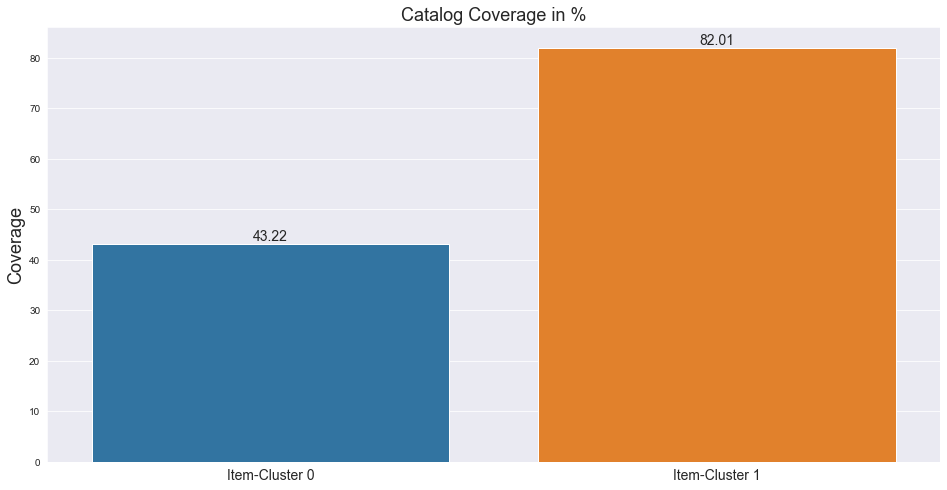

In [75]:
# plot of prediction coverage
# coverage_scores = [i0_coverage, i1_coverage, i2_coverage]
# model_names = ['Item-Cluster 0', 'Item-Cluster 1', 'Item-Cluster 2']

coverage_scores = [i0_coverage, i1_coverage]
model_names = ['Item-Cluster 0', 'Item-Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=coverage_scores)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.set_ylabel('Coverage', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Catalog Coverage in %', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 42. Bar Plot Comparing Coverage Scores between Recommender System Specific to Item Profile Clusters</center>
</span>

#### Novelty Score

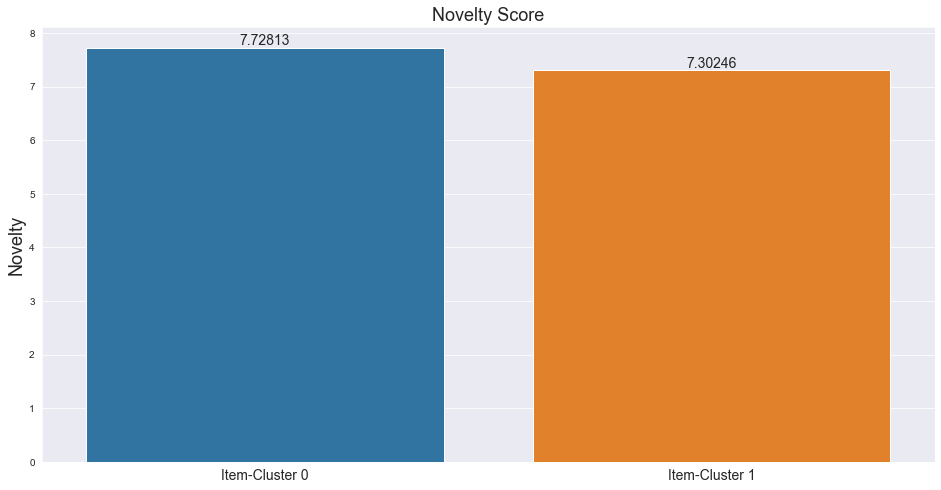

In [76]:
items0 = item_cluster_0["user_id"].value_counts()
items0 = items0.index.tolist()

items1 = item_cluster_1["user_id"].value_counts()
items1 = items1.index.tolist()

nov1 = item_cluster_0.recipe_id.value_counts()
pop1 = dict(nov)

nov2 = item_cluster_1.recipe_id.value_counts()
pop2 = dict(nov)

# pop
i0_novelty,i0_mselfinfo_list = recmetrics.novelty(i0_recs, pop1,
                                                  len(items0), 10)
i1_novelty,i1_mselfinfo_list = recmetrics.novelty(i1_recs, pop2,
                                                  len(items1), 10)

novelty_scores = [i0_novelty, i1_novelty]
model_names = ['Item-Cluster 0', 'Item-Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=novelty_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Novelty', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Novelty Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 43. Bar Plot Comparing Novelty Scores between Recommender System Specific to Item Profile Clusters</center>
</span>

#### Personalization Score

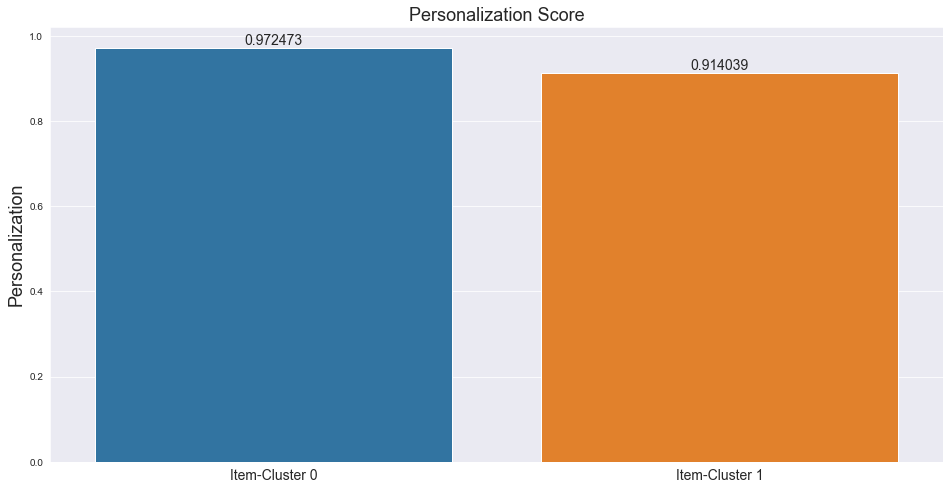

In [77]:
i0_personal = recmetrics.personalization(predicted=i0_recs)
i1_personal = recmetrics.personalization(predicted=i1_recs)

personal_scores = [i0_personal, i1_personal]
model_names = ['Item-Cluster 0', 'Item-Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=personal_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Personalization', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Personalization Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 44. Bar Plot Comparing Personalization Scores between Recommender System Specific to Item Profile Clusters</center>
</span>

#### Intra-list Similarity Score

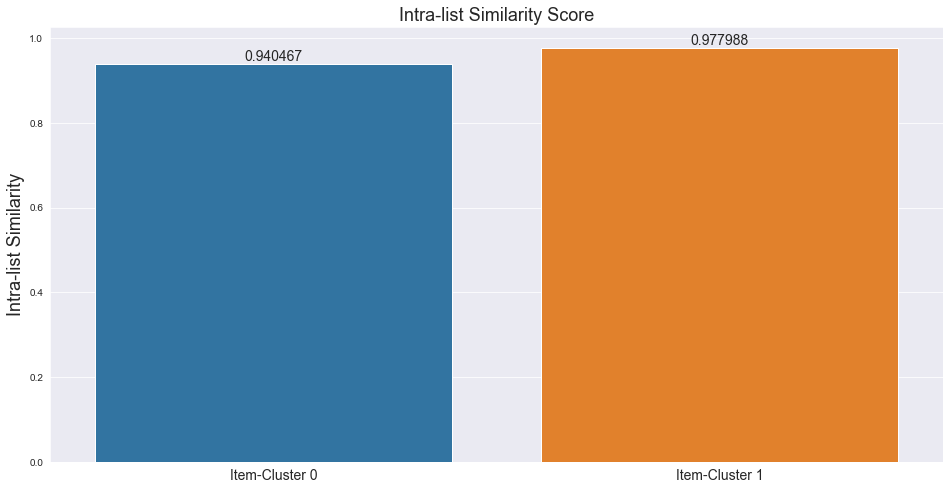

In [78]:
rated_recipe0 = item_cluster_0['recipe_id'].tolist()
item_mat_0 = df_dessert_final.loc[df_dessert_final.index.isin(rated_recipe0)]

rated_recipe1 = item_cluster_1['recipe_id'].tolist()
item_mat_1 = df_dessert_final.loc[df_dessert_final.index.isin(rated_recipe1)]

i0_intra = recmetrics.intra_list_similarity(i0_recs, item_mat_0)
i1_intra = recmetrics.intra_list_similarity(i1_recs, item_mat_1)

intra_scores = [i0_intra, i1_intra]
model_names = ['Item-Cluster 0', 'Item-Cluster 1']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=intra_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Intra-list Similarity', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Intra-list Similarity Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 45. Bar Plot Comparing Intra-list Similarity Scores between Recommender System Specific to Item Profile Clusters</center>
</span>

#### Metrics Radar Plot Summary

In [79]:
# recmetrics.metrics_plot(model_names=model_names,
#              coverage_scores=coverage_scores,
#              personalization_scores=personal_scores,
#              intra_list_similarity_scores = intra_scores)

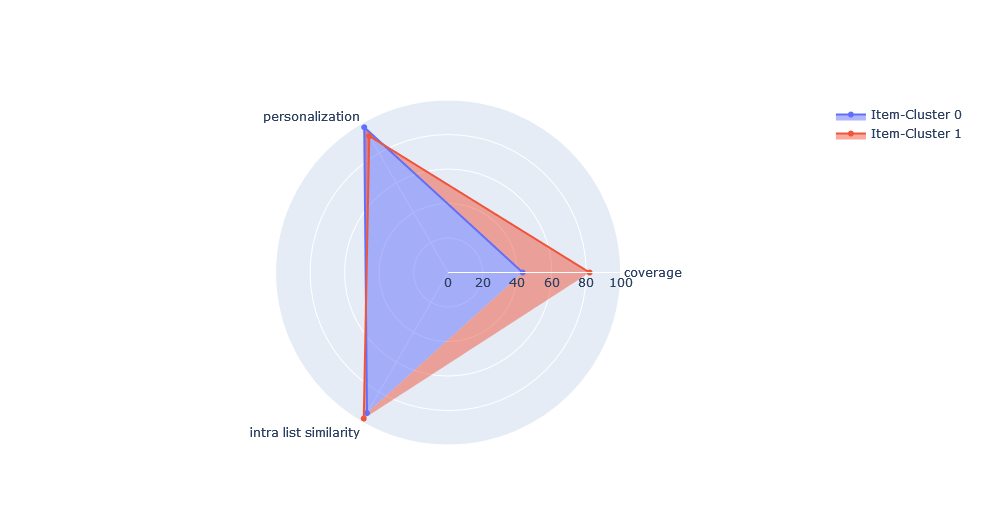

<span style="font-size: 12px">
    <center>Figure 46. Radar Plot Comparing Scores between Recommender System Specific to Item Profile Clusters</center>
</span>

## Based on User Preference per Cluster

We also make recommendations based on user preference. This is a variation of a combined implementation of clustering and collaborative filtering. Why variation? Because there are many ways to do a combined implementation of clustering and collaborative filtering. 

Why do we want this?

Combining clustering of both users and items with recommender systems can lead to better recommendations for users in several ways:

- **Improved accuracy**: Clustering users and items can help identify patterns in user behavior and preferences, as well as in the characteristics of the items being recommended. By leveraging this information, recommender systems can make more accurate recommendations that are tailored to the specific needs and preferences of individual users.

- **Increased coverage**: Clustering can help identify items that may be of interest to users who have not yet interacted with them. By grouping similar items, recommender systems can recommend items that users may not have otherwise discovered, expanding the overall coverage of the system.

- **Increased diversity**: Recommender systems can suffer from the problem of over-specialization, where users are recommended the same types of items over and over again. By clustering items and users, recommender systems can identify diverse sets of recommendations that still meet users' needs and preferences.

- **Improved scalability**: Clustering can help with the scalability of recommender systems by reducing the dimensionality of the data being processed. This can make it easier and faster to generate recommendations, especially when dealing with large datasets.

### Recommendation for Users who Like Cluster 0 of Desserts

In [80]:
item_index_0 = df_dessert_cluster.loc[df_dessert_cluster.cluster == 0].index
item_cluster_0 = df_user_ratings[item_index_0].reset_index()\
                                .melt('user_id', var_name='recipe_id',
                                      value_name='rating').dropna()

cluster0_like = item_cluster_0.loc[item_cluster_0['rating'] >= 4]\
                                                        ['user_id'].unique()
item_cluster_0 = item_cluster_0.loc[item_cluster_0['user_id']\
                                    .isin(cluster0_like)]

df_melt = item_cluster_0.copy()
rating_scale = (0,5)
method = SVD(random_state=69)
user_list = item_cluster_0['user_id'].unique()[0:5]

up0_rec, up0_pred = recsys(df_melt, rating_scale, method, user_list, df_name)
display(up0_rec)

126440  \
                                                  Likes   
Top1                         microwave scalloped apples   
Top2               christmas rum balls or bourbon balls   
Top3                          austrian strawberry torte   
Top4  chocolate chip cannoli filling  w kahlua   cre...   
Top5   authentic no refrigeration bakery frosting icing   

                                                      \
                                          Recommends   
Top1                         banana orange ice cream   
Top2                                lemon jello cake   
Top3                         raspberry sherbet punch   
Top4  dynamite oatmeal chocolate chip raisin cookies   
Top5               oatmeal chocolate chip cookies ii   

                                          104295  \
                                           Likes   
Top1      no bake honey   oat peanut butter bars   
Top2                    molasses oatmeal cookies   
Top3                        banana tahini malted   
Top4                        chocolate madeleines   
Top5  weight watchers 1 point ice cream sandwich   

                                       \
                           Recommends   
Top1                     mocha mousse   
Top2     diabetic peanut butter balls   
Top3  chocolate cream cheese frosting   
Top4               a jamaican goddess   
Top5               sara s 5 cup salad   

                                       176615                               \
                                        Likes                   Recommends   
Top1                     lemon sour cream pie        sour cream raisin pie   
Top2                         almost apple pie       quick n easy fruit dip   
Top3    tapioca pudding  using minute tapioca               rhubarb pie ii   
Top4      kittencal s easy creamy white glaze  coconut condensed milk cake   
Top5  the best oatmeal chocolate chip cookies    apple and rhubarb crumble   

                                    494084  \
                                     Likes   
Top1            door county cherry dessert   
Top2    healthy for them  yogurt popsicles   
Top3           decorator buttercream icing   
Top4  simple mint chocolate chip ice cream   
Top5                  graham cracker crust   

                                                  \
                                      Recommends   
Top1                         gluten free waffles   
Top2                                   shortcake   
Top3                         strawberry popsicle   
Top4                 rolo prailine pretzel bites   
Top5  girl scout chocolate mint cookies  copycat   

                                                 56251   \
                                                  Likes   
Top1                       ultimate chocolate chip bars   
Top2                    lemon pineapple can can dessert   
Top3                            sweet lite fluffy stuff   
Top4                      peanut butter no bake cookies   
Top5  pink stuff     cherry pie filling  pineapple d...   

                                                
                                    Recommends  
Top1                    quick n easy fruit dip  
Top2  quick and easy no bake chocolate cookies  
Top3                very rich hot buttered rum  
Top4                  microwave peanut brittle  
Top5                    peanut butter blossoms

<span style="font-size: 12px">
    <center>Table 26. Overview of Likes and Recommendation of Users who Like Cluster 0 of Item Profile</center>
</span>

In [81]:
df_up0_pred = pd.DataFrame(up0_pred)
df_up0_pred.drop("details", inplace=True, axis=1)
df_up0_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_up0_pred.head()
up0_mse = recmetrics.mse(df_up0_pred.actual, df_up0_pred.user_predictions)
up0_rmse = recmetrics.rmse(df_up0_pred.actual, df_up0_pred.user_predictions)
print("MSE: ", up0_mse)
print("RMSE: ", up0_rmse)

MSE:  0.08293727504090397
RMSE:  0.28798832448712913


In [82]:
up0_model = df_up0_pred.pivot_table(index='user_id', columns='recipe_id',
                                    values='user_predictions').fillna(0)

df_up0_pred = df_up0_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_up0_pred = df_up0_pred.set_index("user_id")

up0_recs = [] = []
for user in df_up0_pred.index:
    up0_predictions = get_users_predictions(user, 10, up0_model)
    up0_recs.append(up0_predictions)
        
df_up0_pred['user_predictions'] = up0_recs

catalog = df_melt.recipe_id.unique().tolist()
up0_coverage = recmetrics.prediction_coverage(up0_recs, catalog)
print("Coverage: ", up0_coverage)

Coverage:  43.02


### Recommendation for Users who Like Cluster 1 of Desserts

In [83]:
item_index_1 = df_dessert_cluster.loc[df_dessert_cluster.cluster == 1].index
item_cluster_1 = df_user_ratings[item_index_1].reset_index()\
                                .melt('user_id', var_name='recipe_id',
                                      value_name='rating').dropna()

cluster1_like = item_cluster_1.loc[item_cluster_1['rating'] >= 4]\
                                                        ['user_id'].unique()
item_cluster_1 = item_cluster_1.loc[item_cluster_1['user_id']\
                                    .isin(cluster1_like)]

df_melt = item_cluster_1.copy()
rating_scale = (0,5)
method = SVD(random_state=69)
user_list = item_cluster_1['user_id'].unique()[0:5]

up1_rec, up1_pred = recsys(df_melt, rating_scale, method, user_list, df_name)
display(up1_rec)

68526                                        \
                  Likes                           Recommends   
Top1         wacky cake                 golden sugar cookies   
Top2  grape nut pudding         quick and easy cranberry pie   
Top3               None    easy as microwave chocolate fudge   
Top4               None  chocolate peanut butter frosting  2   
Top5               None             canadian brown sugar pie   

                 453856                                \
                  Likes                    Recommends   
Top1         wacky cake  black coffee  chocolate cake   
Top2  fall pumpkin cake         poppy seed pound cake   
Top3               None              never fail fudge   
Top4               None             sour cream pastry   
Top5               None              perfect plum pie   

                              814629                                         \
                               Likes                             Recommends   
Top1                      wacky cake            bourbon chocolate pecan pie   
Top2         sweet potato pie my eye  veronica s lemon buttercream frosting   
Top3  10 minute german chocolate pie                sand castle brownie mix   
Top4                            None      pumpkin chocolate chip bundt cake   
Top5                            None           quick and easy cranberry pie   

                             204024  \
                              Likes   
Top1        sand castle brownie mix   
Top2  pumpkin pie   simply the best   
Top3                5 min ice cream   
Top4             100 chocolate cake   
Top5                           None   

                                                         \
                                             Recommends   
Top1                             maraschino cherry loaf   
Top2  lemon pudding filled angel food cake  3 ingred...   
Top3      butterscotch cake   the best you ll ever make   
Top4                                        fudge icing   
Top5                               berry berry cool pie   

                             452940                                
                              Likes                    Recommends  
Top1          cocada  coconut candy          star anise ice cream  
Top2       frosty peach pie supreme                   mom s icing  
Top3  250 00 chocolate chip cookies        sarah s  m   m cookies  
Top4                           None  bisquick chocolate chip bars  
Top5                           None  peppermint buttercream icing

<span style="font-size: 12px">
    <center>Table 27. Overview of Likes and Recommendation of Users who Like Cluster 1 of Item Profile</center>
</span>

In [84]:
df_up1_pred = pd.DataFrame(up1_pred)
df_up1_pred.drop("details", inplace=True, axis=1)
df_up1_pred.columns = ['user_id', 'recipe_id', 'actual', 'user_predictions']
df_up1_pred.head()
up1_mse = recmetrics.mse(df_up1_pred.actual, df_up1_pred.user_predictions)
up1_rmse = recmetrics.rmse(df_up1_pred.actual, df_up1_pred.user_predictions)
print("MSE: ", up1_mse)
print("RMSE: ", up1_rmse)

MSE:  0.021317368238131826
RMSE:  0.14600468567183666


In [85]:
up1_model = df_up1_pred.pivot_table(index='user_id', columns='recipe_id',
                                    values='user_predictions').fillna(0)

df_up1_pred = df_up1_pred.copy().groupby('user_id', as_index=False)\
                    ['recipe_id'].agg({'actual': (lambda x: list(set(x)))})
df_up1_pred = df_up1_pred.set_index("user_id")

up1_recs = [] = []
for user in df_up1_pred.index:
    up1_predictions = get_users_predictions(user, 10, up1_model)
    up1_recs.append(up1_predictions)
        
df_up1_pred['user_predictions'] = up1_recs

catalog = df_melt.recipe_id.unique().tolist()
up1_coverage = recmetrics.prediction_coverage(up1_recs, catalog)
print("Coverage: ", up1_coverage)

Coverage:  89.21


### Comparison of Evaluation Metrics

#### Error Score

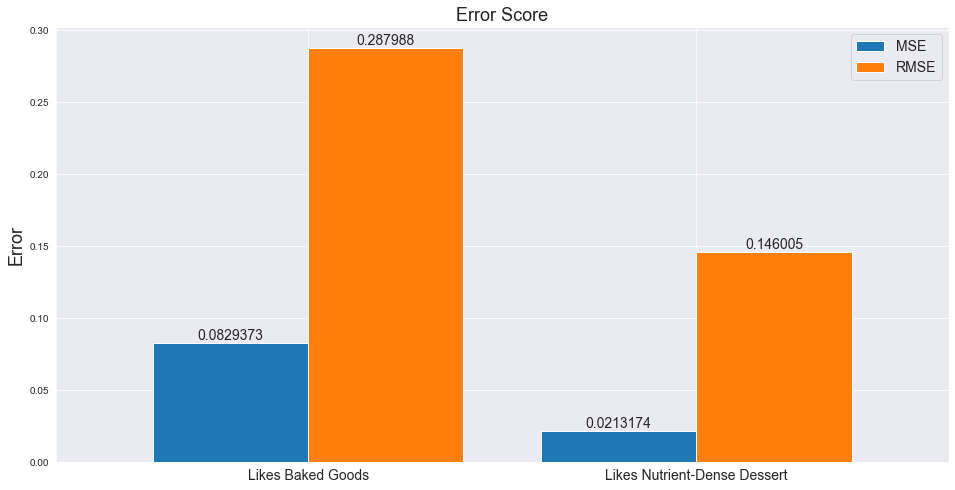

In [86]:
mse_scores = [up0_mse, up1_mse]
rmse_scores = [up0_rmse, up1_rmse]
model_names = ['Likes Baked Goods', 'Likes Nutrient-Dense Dessert']

df_error = pd.DataFrame({'MSE': mse_scores,
                   'RMSE': rmse_scores})
df_error['model'] = model_names
fig = df_error.plot(x='model', y=['MSE', 'RMSE'],
                    kind='bar', figsize=(16, 8), width=0.8)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.bar_label((fig.containers[1]), label_type='edge', fontsize=14)
fig.set_xlabel("")
fig.set_ylabel('Error', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.legend(fontsize=14)
plt.xticks(rotation=0)

fig.set_title('Error Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 47. Bar Plot Comparing Error Scores between Recommender System Specific to Users who Like a Specific Item Cluster</center>
</span>

#### Coverage Score

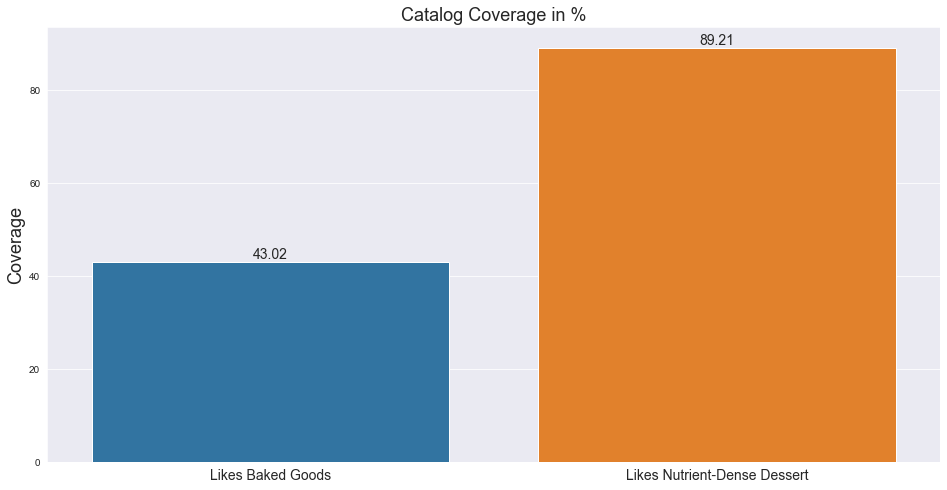

In [87]:
coverage_scores = [up0_coverage, up1_coverage]
model_names = ['Likes Baked Goods', 'Likes Nutrient-Dense Dessert']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=coverage_scores)
fig.bar_label((fig.containers[0]), label_type='edge', fontsize=14)
fig.set_ylabel('Coverage', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Catalog Coverage in %', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 48.  Bar Plot Comparing Coverage Scores between Recommender System Specific to Users who Like a Specific Item Cluster</center>
</span>

#### Novelty Score

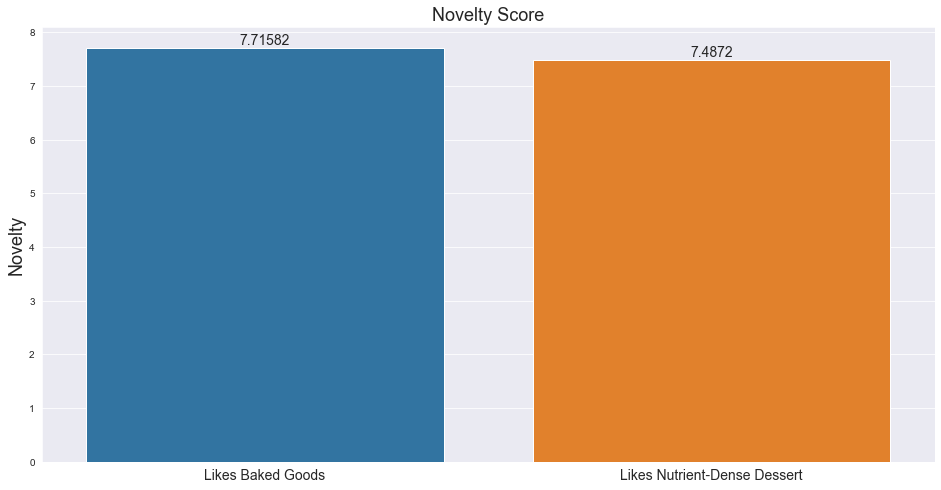

In [88]:
items0 = item_cluster_0["user_id"].value_counts()
items0 = items0.index.tolist()

items1 = item_cluster_1["user_id"].value_counts()
items1 = items1.index.tolist()

nov1 = item_cluster_0.recipe_id.value_counts()
pop1 = dict(nov)

nov2 = item_cluster_1.recipe_id.value_counts()
pop2 = dict(nov)


# pop
up0_novelty,up0_mselfinfo_list = recmetrics.novelty(up0_recs, pop1,
                                                    len(items0), 10)
up1_novelty,up1_mselfinfo_list = recmetrics.novelty(up1_recs, pop2,
                                                    len(items1), 10)

novelty_scores = [up0_novelty, up1_novelty]
model_names = ['Likes Baked Goods', 'Likes Nutrient-Dense Dessert']


fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=novelty_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Novelty', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Novelty Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 49.  Bar Plot Comparing Novelty Scores between Recommender System Specific to Users who Like a Specific Item Cluster</center>
</span>

#### Perosonalization Score

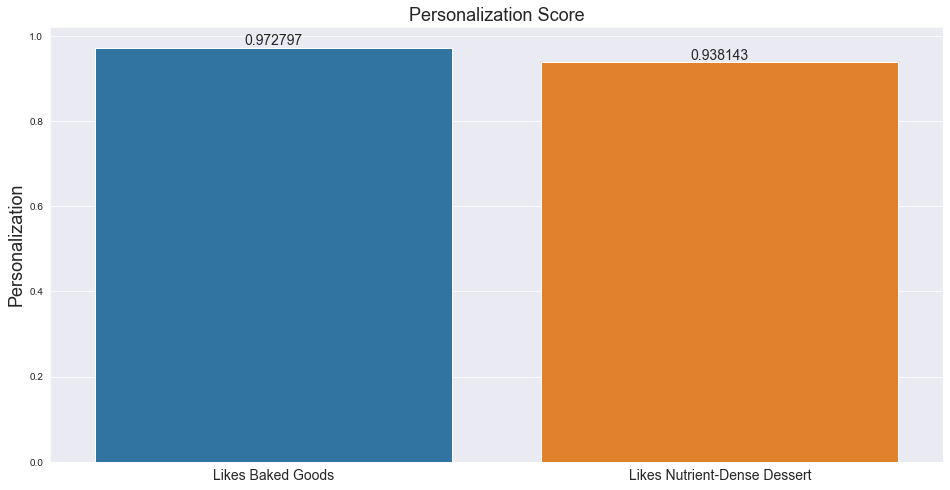

In [89]:
up0_personal = recmetrics.personalization(predicted=up0_recs)
up1_personal = recmetrics.personalization(predicted=up1_recs)

personal_scores = [up0_personal, up1_personal]
model_names = ['Likes Baked Goods', 'Likes Nutrient-Dense Dessert']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=personal_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Personalization', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Personalization Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 50.  Bar Plot Comparing Personalization Scores between Recommender System Specific to Users who Like a Specific Item Cluster</center>
</span>

#### Intra-list Similarity Score

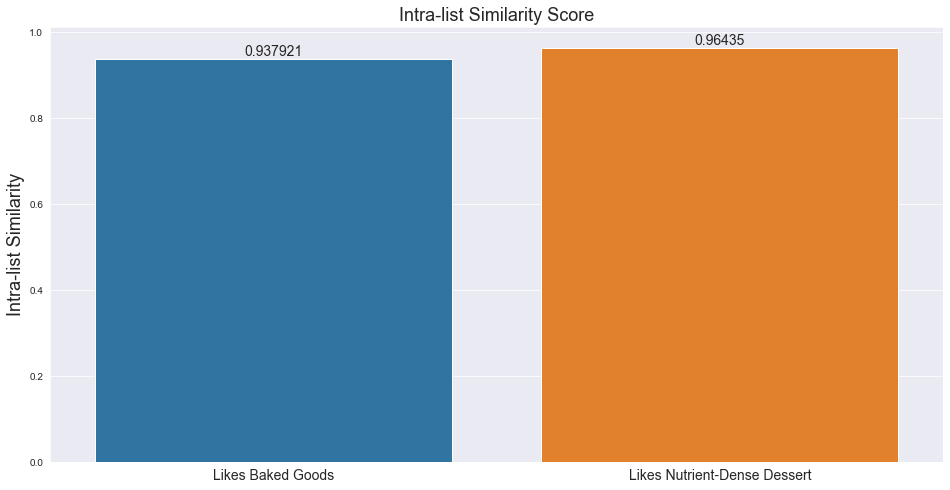

In [90]:
rated_recipe0 = item_cluster_0['recipe_id'].tolist()
item_mat_0 = df_dessert_final.loc[df_dessert_final.index.isin(rated_recipe0)]

rated_recipe1 = item_cluster_1['recipe_id'].tolist()
item_mat_1 = df_dessert_final.loc[df_dessert_final.index.isin(rated_recipe1)]


up0_intra = recmetrics.intra_list_similarity(up0_recs, item_mat_0)
up1_intra = recmetrics.intra_list_similarity(up1_recs, item_mat_1)

intra_scores = [up0_intra, up1_intra]
model_names = ['Likes Baked Goods', 'Likes Nutrient-Dense Dessert']

fig = plt.figure(figsize=(16, 8))
fig = sns.barplot(x=model_names, y=intra_scores)
fig.bar_label(fig.containers[0], label_type='edge', fontsize=14)
fig.set_ylabel('Intra-list Similarity', fontsize=18)
fig.set_xticklabels(model_names,fontsize=14)
fig.set_title('Intra-list Similarity Score', fontsize=18);

<span style="font-size: 12px">
    <center>Figure 51.  Bar Plot Comparing Intra-list Similarity Scores between Recommender System Specific to Users who Like a Specific Item Cluster</center>
</span>

#### Metrics Radar Plot Summary

In [91]:
# recmetrics.metrics_plot(model_names=model_names,
#              coverage_scores=coverage_scores,
#              personalization_scores=personal_scores,
#              intra_list_similarity_scores = intra_scores)

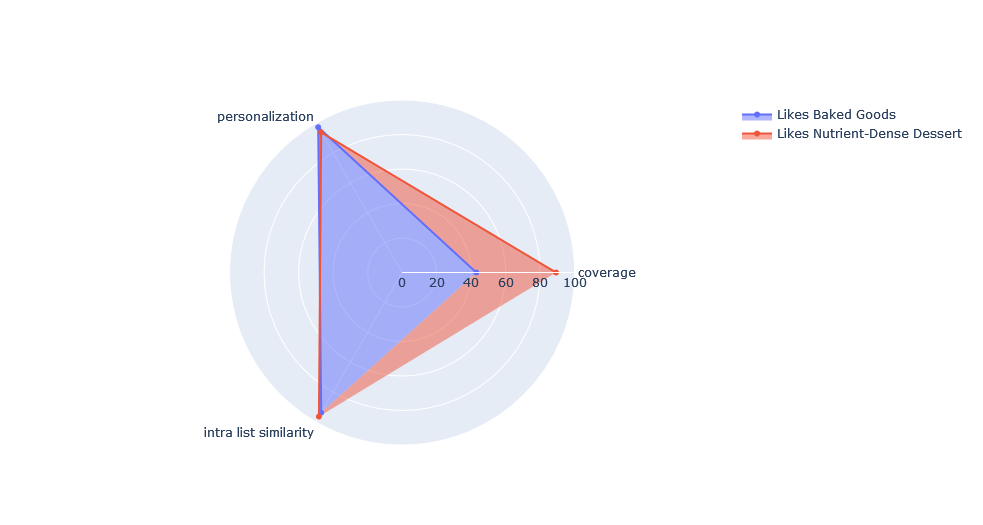

<span style="font-size: 12px">
    <center>Figure 52.  Radar Plot Comparing Scores between Recommender System Specific to Users who Like a Specific Item Cluster</center>
</span>

### Recommendation for clustered user and items

Another variation of a combined implementation of clustering and collaborative filtering is by changing the utility matrix to have rows as cluster labels of users and columns as cluster labels of items. This can be beneficial in several ways:

- **Reduced dimensionality**: By clustering users and items, the number of rows and columns in the utility matrix is reduced, which can help with the scalability of the recommender system. This can be particularly useful when dealing with large datasets where the full utility matrix may be too large to store or process efficiently.

- **Improved accuracy**: Clustering users and items can help to identify patterns in user behavior and preferences, as well as in the characteristics of the items being recommended. By grouping similar users and items, the recommender system can make more accurate recommendations that are tailored to the specific needs and preferences of each user cluster and item cluster.

- **Increased diversity**: Clustering users and items can also help to increase the diversity of the recommendations being made. By identifying similar users and items within clusters, the recommender system can recommend a more diverse set of items to each user cluster.

- **Better handling of sparsity**: When dealing with sparse data, clustering can help to identify latent relationships between users and items that may not be immediately obvious in the raw data. This can lead to better recommendations, even when there are only a few interactions between users and items.

In [92]:
cluster_label_user2 = KMeans(50, random_state=1337).fit_predict(user_new_svd)
df_user_cluster2 = df_user_ratings.copy()
df_user_cluster2['cluster_user'] = cluster_label_user2


cluster_label_item2 = KMeans(50, random_state=1337).fit_predict(item_new_svd)
df_dessert_cluster2 = df_dessert_final.copy()
df_dessert_cluster2['cluster_item'] = cluster_label_item2


df_cluster = df_user_cluster2.reset_index().melt(['cluster_user','user_id'],
                                                 var_name='recipe_id',
                                                 value_name='rating').dropna()
df_cluster = df_cluster.groupby(['cluster_user', 
                                 'recipe_id'])['rating'].mean().reset_index()
df_cluster = df_cluster.merge(df_dessert_cluster2.reset_index()[['id',
                                                            'cluster_item']],
                              left_on='recipe_id', right_on='id')
df_cluster = df_cluster.drop(['recipe_id', 'id'], axis=1)
df_cluster = df_cluster.groupby(['cluster_user', 'cluster_item'])\
                                            ['rating'].mean().reset_index()
df_cluster.pivot_table(values='rating', index='cluster_user',
                       columns='cluster_item')

cluster_item,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
cluster_user,,,,,,,,,,,,,,,,,,,,,
0,NaN,NaN,4.000000,NaN,NaN,5.000000,NaN,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,4.333333,NaN,NaN
1,NaN,3.750000,4.000000,NaN,5.000000,5.000000,4.400000,NaN,5.000000,5.000000,...,3.600000,NaN,4.666667,4.833333,NaN,4.000000,5.000000,5.000000,4.000000,5.000000
2,NaN,NaN,4.125641,NaN,NaN,5.000000,5.000000,5.000000,4.000000,4.500000,...,NaN,5.000000,NaN,4.800000,NaN,5.000000,5.000000,4.833333,4.000000,NaN
3,NaN,5.000000,4.928571,NaN,NaN,5.000000,4.666667,4.750000,4.000000,5.000000,...,4.600000,5.000000,NaN,4.857143,NaN,5.000000,5.000000,4.400000,4.208333,5.000000
4,NaN,5.000000,NaN,NaN,4.500000,5.000000,3.666667,4.666667,4.666667,5.000000,...,NaN,5.000000,4.666667,5.000000,NaN,NaN,5.000000,5.000000,4.400000,5.000000
5,NaN,5.000000,4.654762,5.0,4.750000,5.000000,4.500000,5.000000,4.500000,4.333333,...,4.714286,5.000000,5.000000,4.125000,5.000000,4.500000,4.333333,2.500000,4.500000,5.000000
6,3.875000,4.428571,4.308761,NaN,4.110465,4.783333,4.472789,4.552083,4.380296,4.453125,...,4.660377,4.686508,4.465116,4.421875,4.476190,4.526316,4.483871,4.575758,4.344697,4.534483
7,NaN,5.000000,4.000000,NaN,4.500000,5.000000,5.000000,5.000000,4.500000,4.000000,...,5.000000,5.000000,NaN,5.000000,NaN,NaN,NaN,5.000000,NaN,5.000000
8,5.000000,4.666667,3.250000,3.0,5.000000,4.750000,4.666667,5.000000,NaN,3.750000,...,4.333333,2.500000,3.333333,3.333333,5.000000,4.500000,4.800000,NaN,4.500000,4.800000


<span style="font-size: 12px">
    <center>Table 28. Overview of Utility Matrix Clustering Both User and Item Profiles</center>
</span>

In [93]:
df_melt = df_cluster.copy()
rating_scale = (0,5)
method = SVD(random_state=69)

df_rate = df_cluster.pivot_table(values='rating', index='cluster_user',
                                 columns='cluster_item')
user_list = df_rate[df_rate.isnull().any(axis=1)].index

reader = Reader(rating_scale=rating_scale)
dataset = Dataset.load_from_df(df_melt, reader)
method.fit(dataset.build_full_trainset())
predictions = method.test(method.trainset.build_anti_testset())

df_reco_user = pd.DataFrame()
for user in user_list: # Get reco for N users
    top_n = []
    for uid, iid, true_r, est, _ in predictions:
        if uid == user:
            top_n.append((iid, est))
    # Get top N reco
    reco_list = sorted(top_n, key=lambda x: (-x[1], x[0]))[:10] 
    top = [i[0] for i in reco_list]
    reco = df_cluster.loc[top].reset_index(drop=True)\
                                            .rename(columns={"name": user}).T
    x = df_cluster.loc[top].reset_index(drop=True)['cluster_item']\
                                                                .to_list()[:5]
    likes = df_rate.loc[user].dropna().sort_values(ascending=False).index
    y = df_melt.loc[likes].reset_index(drop=True)['cluster_item']\
                                                                .to_list()[:5]
    assets = [user]
    Asset_feature = ['Likes', 'Recommends']
    index = ['Top1', 'Top2', 'Top3', 'Top4', 'Top5']

    midx = pd.MultiIndex.from_product([assets, Asset_feature])
    reco = pd.DataFrame([y,x], index=midx, columns=index).T
    df_reco_user = pd.concat([df_reco_user, reco], axis=1)

df_reco_user

0                1                2                3              \
     Likes Recommends Likes Recommends Likes Recommends Likes Recommends   
Top1    27         17    48         17    20         17     5         27   
Top2    13         44    45         18    11          5     5         21   
Top3    27          4    25         38    43         32    45         39   
Top4    35          5    11          4    30         44    43         18   
Top5    42         28    28          6    28         29    38         19   

        4              ...    45               46               47             \
     Likes Recommends  ... Likes Recommends Likes Recommends Likes Recommends   
Top1     5         30  ...    26         22    47          5   2.0       17.0   
Top2    17         28  ...    39          6    22         17   1.0       18.0   
Top3    46         13  ...    38         17    26         18  45.0        5.0   
Top4    45         18  ...    35         45    30         45  42.0        NaN   
Top5    40         27  ...    34         13    32         47  25.0        NaN   

        48               49             
     Likes Recommends Likes Recommends  
Top1     5         20    22         17  
Top2    15          1    19         44  
Top3    47         30    45         18  
Top4    40         47    43         30  
Top5    39         27    38         21  

[5 rows x 98 columns]

<span style="font-size: 12px">
    <center>Table 29. Overview of Likes and Recommendation for a Recommender System with Clustering of Both User and Item Profiles</center>
</span>

# Results and Discussions

<span style="font-size: 20px"><b>Why is dimensionality reduction necessary?</b></span>

Dimensionality reduction is necessary for several reasons:

1. **Computational Efficiency** - By reducing the number of dimensions, the computational cost can be reduced significantly.
2. **Noise Reduction** - High-dimensional data often contains noise points and redundant features that affect the quality of clustering.
3. **Curse of Dimensionality** - As the number of dimensions in data increases, the more difficult it is to find meaningful patterns. Dimensionality reductions help in alleviating this.
4. **Memory Constraints** - It requires a large amount of memory to store and process high-dimensional data. Reducing the number of dimensions makes it easier to work around the memory requirements.
5. **Data Visualization** - It is difficult to visualize data in high dimensions.

<span style="font-size: 20px"><b>Explain the rationale behind the choice of dimensionality reduction technique.</b></span>

There are several dimensionality reduction techniques available which can be applied to data, below are some examples:

1. Principal Component Analysis (PCA)
2. Singular Vector Decomposition (SVD)

However, the choice of technique came down to using SVD. SVD is generally better for sparse data than PCA. It can handle matrices with missing or zero values and can also reduce the dimensionality in data without losing important information. 

SVD is the more flexible and robust method, particularly for sparse data.

Since we are working with a utility matrix composed of food ratings, which is classified as sparse data, then SVD is the perfect technique to apply.

<span style="font-size: 20px"><b>How many singular vectors were retained?</b></span>

Below is the summary of the number of singular vectors retained for each dataset.

**User Rating Matrix:**
- 539 Singular Vectors retained
- 80% Cumulative Variance Explained

**Item Profile Matrix:**
- 31 Singular Vectors retained
- 80% Cumulative Variance Explained

<span style="font-size: 20px"><b>What features were used for the item profile matrix?</b></span>

For the item profile matrix, we used the following features:
- minutes - Minutes to prepare the recipe
- n_steps - Number of steps in the recipe
- nutrition - Nutrition information
- ingredients - List of ingredient names

The ingredients list was vectorized to represent the sequence of characters or words in a numerical format that the models can understand.

<span style="font-size: 20px"><b>What clustering algorithms/techniques were used?</b></span>

For clustering, we have decided to perform the following techniques:
Note: we only showed three clustering techniques in the main body. The other techniques have been moved over to the appendices.

**1. Representative-based Clustering**
 - K-means
 - K-medoids
 
**2. Hierarchical Clustering**
 - Single Linkage
 - Average Linkage
 - Complete Linkage
 - Ward's Linkage
 
**3. Density-based Clustering**
 - Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
 - Ordering points to identify the clustering structure (OPTICS)
 
**4. Probabilistic Clustering**
 - Gaussian Mixture

<span style="font-size: 20px"><b>
Explain the rationale behind the choice of the clustering algorithm.</b></span>

For our clustering technique, we ultimately decided to use K-means clustering as it provides the following advantages:

1. **Highly interpretable**
2. **Efficiency (Fast run time)**
3. **Simple**
4. **Scalable**
5. **Robust**

<span style="font-size: 20px"><b>How did we choose the optimate k number of clusters?</b></span>

We performed hyperparameter tuning using a simple grid-search algorithm where we perform clustering using a range of values to search for the best number of clusters.

We must take note that in selecting the optimal number of clusters, we must rely on the internal validation scores instead of the plot visualization. The plot only represents a relatively small amount of information, hence judging the clusters visually can lead to poor conclusions.

Here is a summary of the scores:

1. **SSE** - We want to look for the elbow. Inconclusive, all scores are approximately the same.
2. **Calinski-Harabasz Index** - We want the highest score. Inconclusive, all scores are approximately the same.
3. **Silhouette Coefficient** - We want a score closest to 0.5. Inconclusive, all scores are approximately the same.
4. **Davies-Bouldin Index** - We want a score that is close to zero, but not zero. k=2 has a DB index closest to zero.

Using the DB index, we identified that our optimal number of clusters is k=2.

<span style="font-size: 20px"><b>How did we label the clusters?</b></span>

The clusters were labeled using a novel two-step method.  A classifier is first trained to predict the cluster labels, then the Single Feature Introduction Test (SFIT) method is run on the model to identify the statistically significant features that characterize each cluster.

To perform classification on the clusters, we trained a 3-hidden-layer neural network that has ReLU activation functions, a first hidden size of 100, a second hidden size of 50, and a third hidden size of 25. The network is trained for at most 50 epochs using the Adam optimizer which has pruning capabilities.

After running the classification, we perform the Single Feature Introduction Test (SFIT) on the trained network by only using the data for a specific cluster, and returning a cluster's most important features.

Here are the five most important features of each cluster:

**Cluster 0**
- calories
- sodium_pvd
- sat_fat_pvd
- carbs_pvd
- protein_pvd

**Cluster 1**
- calories
- flour
- sat_fat_pvd
- eggs
- chocolate chips

These features are what separate one cluster from the other. However, the results do not tell us exactly why these features are considered the most important. It does not tell us the feature's abundance or lack thereof.

Since we are comparing only two clusters, it is likely to get some common significant features for both clusters. In our case, we got calories and saturated fat as commonly significant features. This could mean that for these features, both clusters are likely to demonstrate a significant difference in their mean or median.

To augment our results from the SFIT method, we can check the values for each of these features for both clusters. If you remember, earlier, we took a look at the mean/median of calories and saturated fat for both features, and truly, these clusters are significantly different in terms of calories and saturated fat.

**Recap:**

**Cluster 0**
1. Average calories is approximately 332 (Low-calorie dessert)
2. Average sugar content is approximately 126 (Low sugar dessert)
3. Average carbohydrate content is approximately 15 (Low carb dessert)

**Cluster 1**
1. Average calories is approximately 3,551 (High-calorie dessert)
2. Average sugar content is approximately 1,333 (High sugar dessert)
3. Average carbohydrate content is approximately 157 (High carb dessert)

Now that we have this information, we can then label our clusters. 

- **Cluster 0** - Low-fat Dessert
- **Cluster 1** - High-fat Dessert


<span style="font-size: 20px"><b>What is a recommender system?</b></span>

A recommender system is an information filtering system that predicts and recommends items to users based on their preferences, interests, and past behavior. The goal of a recommender system is to provide personalized recommendations that are useful and relevant to the user.

<span style="font-size: 20px"><b>Why is a recommender system important?</b></span>

A recommender system is important for several reasons:
1. **Personalization** - Recommendations are made to a user based on their preferences, interests, and past behaviors. This increases the likelihood that a user will continue using the platform or service.
2. **Discoverability** - Recommender systems help users discover new items or content that they may not have found otherwise.
3. **Reduced Analysis Paralysis** - Recommender systems help a user steer away from analysis paralysis which is the inability to decide due to overthinking a problem.


<span style="font-size: 20px"><b>What type of recommender systems were tried out?</b></span>

There are many types of recommender systems and we can go all day talking about them. However, for this study, we only chose to run and test three types namely:

1. User-based Collaborative Filtering
2. Item-based Collaborative Filtering
3. Latent Factor-based Collaborative Filtering

<span style="font-size: 20px"><b>Explain the rationale behind the choice of recommender system.</b></span>

Each of the three collaborative filtering methods offers its own sets of advantages and disadvantages. It's hard to rank the three in terms of their qualitative aspects. However, by using evaluation metrics, we can easily choose the best recommender system that would perfectly fit the use case. The choice of recommender system was ultimately based on the evaluation metrics. 

<span style="font-size: 20px"><b>How did we evaluate the performance of the recommender system?</b></span>

The performance of the recommender systems was evaluated based on the following metrics:

1. **MSE and RMSE** - *Lower is better*. This measures the accuracy of the recommendations made by the system.
2. **Coverage** - *Higher is better*. This measures the proportion of items in the catalog that are recommended by the system. A high coverage indicates that the system can recommend a large number of items.
3. **Novelty** - *Contextual*. This measures the novelty of the recommendations made by the system. A high novelty indicates that the system recommends items that the user has not seen before. Users however may prefer a more balanced novelty.
4. **Personalization** - *Higher is better*. This measures how personalized the recommendations are for each user. A high personalization metric indicates that the recommendations are tailored to the individual user's preferences and needs, rather than being generic or popular recommendations.
5. **Intra-list Similarity** - *Higher is better*. This measures the similarity between the items in a list of recommendations. A low intra-list similarity metric indicates that the recommendations are diverse and cover a wide range of items, while a high intra-list similarity metric indicates that the recommendations are similar to each other and may not offer much variety (this is desirable).

<span style="font-size: 20px"><b>What libraries were used to create the recommender systems?</b></span>

For this study, we used the *Scikit-Surprise* Library. The scikit-surprise library is a popular Python library for building recommender systems using collaborative filtering techniques. We algorithms we decided to use user-based kNN, item-based kNN, and SVD.

1. User-based kNN
2. Item-based kNN
3. SVD (Latent Factor)

In conjunction, we also used the *recmetrics* library, which is a python library of evaluation metrics and diagnostic tools for recommender systems. Recmetrics accepts the predictions from the scikit-surprise library and returns metrics such as:

1. MSE and RMSE
2. Coverage
3. Novelty
4. Personalization
5. Intra-list Similarity

<span style="font-size: 20px"><b>What problems did we encounter with dimensionality reduction?</b></span>

The following were the problems encountered during the implementation of dimensionality reduction:

- Since the reduced data still contained a high number of dimensions (539 and 31) we could not rely on the visualizations produced by projecting the first two singular vectors. Normally, the first two singular vectors should contain most of the information, in this case however, it was not enough for us to completely rely on the 2D plot.

- The internal validation scores do not have a common majority top-ranked k number of clusters. Instead, you will have to use your judgment and use the information provided by the internal validation scores to decide the optimal number of clusters.

<span style="font-size: 20px"><b>What problems did we encounter with clustering?</b></span>

The following were the problems encountered during the implementation of clustering:

- Some clustering methods took a long time to run. This is true, especially for density-based clustering.
- Some metrics like BIC and gradient of BIC are hard to interpret.
- On top of the long run times, the slow grid search algorithm also added fuel to the flames.

<span style="font-size: 20px"><b>What problems did we encounter with the implementation of the recommender system?</b></span>

- User-based collaborative filtering can potentially funnel recommendations. This phenomenon causes the recommendations to be almost identical for all users. Although this can be remedied by setting minimum support for commonly rated items.
- Learning the scikit-surprise library is not as easy as plug and play. It can take some time to understand the code syntax.
- The scikit-surprise library only includes metrics such as RMSE, MSE, MAE, and FCP (Fraction of Concordant Pairs). If you want to use other metrics, you would have to do your implementation of the metric algorithm.

# Conclusion

1. Among the collaborative filtering techniques used, the best-performing one was latent-factor-based collaborative filtering. The algorithm was able to capture the complex relationships between users and items and it was able to make more accurate predictions than the user-based and item-based approaches.

2. User-based collaborative filtering can potentially funnel recommendations. This phenomenon causes the recommendations to be almost identical for all users.

3. The SFIT method does not work well with datasets having numerous features.

4. The internal validation scores should hold more weight than visual appeal in two-dimensional space when deciding on the optimal number of clusters. This is especially true for data of high dimensionality.

5. Data transformation should be performed user-wise, and not item-wise.

6. The latent-based recommender system was able to address the inherent problem being complained of by Chef Almond:
  - A need for a more personalized recommendation - The LF-based recommender system had the highest personalization score.
  - Recipe recommendations that are not contained to certain predictions only - The LF-based recommender system had the highest coverage.
  - The ability to balance out expected and unexpected recommendations - The LF-based recommender system had a more balance novelty score.
  - Recommendations that are similar - The LF-based recommender system had a high intra-list similarity score.
  
7. The choice of the clustering method depends on several factors, such as the nature of the data, the desired clustering outcome, and the resources available.

8. Choosing the best number of clusters should not be based on the clustering that has the best visual appeal.

# Recommendations

1. This study can be further improved through the application of other clustering techniques and algorithms which could potentially reveal more meaningful insights from our data. See below for some examples of other clustering techniques and algorithms:
  - **Model-based Clustering** -This type of clustering assumes that data is a mixture of probabilistic models.
  - **Subspace Clustering** - This type of clustering finds clusters in subspaces of the feature space rather than the entire feature space.
  - **Spectral Clustering** - This type of clustering is a graph-based clustering that represents data as a graph and then applies graph theory to partition the graph into clusters.
  - **Fuzzy Clustering** - This type of clustering allows for a degree of uncertainty or "fuzziness" in assigning data points into clusters.
  - **Constrained Clustering** - This type of clustering allows users to specify constraints or conditions that must be satisfied by the clustering solution.
  - **Deep Clustering** - This type of clustering uses deep learning techniques, such as neural networks, to cluster data in an unsupervised manner.
  - **Ensemble Clustering** - This type of clustering uses multiple clustering algorithms or multiple runs of the same algorithm to produce a final clustering solution. 
  - **Self-Organizing Maps (SOM)** - This type of clustering uses a neural network approach to create a low-dimensional representation of the data. 
  - **Affinity Propagation** - This type of clustering algorithm is based on the concept of "message passing" between data points to find the cluster representatives.
  - **Mean-Shift Clustering** - This type of clustering algorithm is a non-parametric, density-based method that works by shifting "mean" points toward areas of high data density.
  
2. Perform Content-based Collaborative Filtering to Capture the contributions of the ingredients as the features of each recipe profile.

3. Try out other algorithms from the scikit-Surprise Library to explore possible algorithms that better fit the dataset such as:
 - **random_pred.NormalPredictor** - Algorithm predicting a random rating based on the distribution of the training set, which is assumed to be normal.

 - **baseline_only.BaselineOnly** - Algorithm predicting the baseline estimate for a given user and item.

 - **knns.KNNBasic** - A basic collaborative filtering algorithm.

 - **knns.KNNWithMeans** - A basic collaborative filtering algorithm, taking into account the mean ratings of each user.

 - **knns.KNNWithZScore** - A basic collaborative filtering algorithm, taking into account the z-score normalization of each user.

 - **knns.KNNBaseline** - A basic collaborative filtering algorithm taking into account a baseline rating.

 - **matrix_factorization.SVD** - The famous SVD algorithm, as popularized by Simon Funk during the Netflix Prize.

 - **matrix_factorization.SVDpp** - The SVD++ algorithm, an extension of SVD taking into account implicit ratings.

 - **matrix_factorization.NMF** - A collaborative filtering algorithm based on Non-negative Matrix Factorization.

 - **slope_one.SlopeOne** - A simple yet accurate collaborative filtering algorithm.

 - **co_clustering.CoClustering** - A collaborative filtering algorithm based on co-clustering
 
4. Explore the batch recommender system. This can be done by clustering both the users and items where their labels will serve as the rows and columns, respectively. The cluster mean will be used as the value for the utility matrix. This implementation will dramatically reduce the run time as the recommendations will be the same for each cluster.

5. Combine the frequent itemset mining with recommender systems. By doing so, we can use the association rules to generate recommendations for the users. This can potentially provide better user recommendations.

6. Explore other food categories like main dish, French, or 30-minute dish. This can also be applied to other types of food or desserts.

7. Recommender systems are considered domain-agnostic and may be applied to other fields such as media, retail, clothing, and transportation.

8. Another way to make the study more interesting is to reveal clusters within clusters. Although more complex at the onset, it can potentially lead to more meaningful insights.

# References

[1] Hunter. (2020, March). New survey reveals the pandemic’s impact on Americans’ eating behaviors [Press release]. Retrieved from https://www.hunterpr.com/newsroom/new-survey-reveals-the-pandemics-impact-on-americans-eating-behaviors/

[2] International Food Information Council. (2020). 2020 Food & Health Survey: COVID-19 Pandemic’s Impact on Food and Health. Retrieved from https://foodinsight.org/2020-food-and-health-survey/

[3] Food.com. (n.d.). Retrieved March 11, 2023, from https://www.food.com/

[4] Koren, Y., Bell, R., & Volinsky, C. (2009). Matrix factorization techniques for recommender systems. Computer, 42(8), 30-37. doi: 10.1109/MC.2009.263

[5] Leskovec, J., Rajaraman A.,  and Ullman J. (2011). Mining of Massive Datasets. Retrieved from http://infolab.stanford.edu/~ullman/mmds/book.pdf (p. 326).

[6] Lavorini, V. (2018, November 22). Gaussian mixture model clusterization: How to select the number of components (clusters). Towards Data Science. https://towardsdatascience.com/gaussian-mixture-model-clusterization-how-to-select-the-number-of-components-clusters-553bef45f6e4

[7] DiFrancesco, V. (2021, February 25). Gaussian Mixture Models for Clustering. A beginner’s guide for expanding your clustering knowledge beyond K-Means. https://towardsdatascience.com/gaussian-mixture-models-for-clustering-3f62d0da675

[8] Deutschman, Z. (2023, January 24). Recommender Systems: Machine Learning Metrics and Business Metrics https://neptune.ai/blog/recommender-systems-metrics.

[9] Longo, C. (2018, November 23). Evaluation Metrics for Recommender Systems. Towards Data Science. https://towardsdatascience.com/evaluation-metrics-for-recommender-systems-df56c6611093

[10] Zhou, T., Kuscsik, Z., Liu, J. G., Medo, M., Wakeling, J. R., & Zhang, Y. C. (2010). Solving the apparent diversity-accuracy dilemma of recommender systems. Proceedings of the National Academy of Sciences, 107(10), 4511-4515. https://arxiv.org/pdf/0808.2670.pdf

[11] Ge, M., Delgado-Battenfeld, C., & Jannach, D. (2010, September). Beyond accuracy: evaluating recommender systems by coverage and serendipity. In Proceedings of the fourth ACM conference on Recommender systems (pp. 257-260). ACM.

[12] Lendave, V. (2021, October 24). How to Measure the Success of a Recommendation System? Analytics India Magazine. https://analyticsindiamag.com/how-to-measure-the-success-of-a-recommendation-system/

[13] Longo, C. (2021). Recmetrics. A python library of evaluation metrics and diagnostic tools for recommender systems. GitHub. https://github.com/statisticianinstilettos/recmetrics

[14] Horel, E., Giesecke, K., Storchan, V., Chittar, N. (2020). Explainable Clustering and Application to Wealth
Management Compliance. https://arxiv.org/pdf/1909.13381.pdf

[15] Horel, E., Giesecke, K. (2019). Computationally Efficient Feature Significance and Importance for Machine Learning Models. https://arxiv.org/pdf/1905.09849.pdf

[16] Agrawal, S. (2021). Recommendation System - Understanding The Basic Concepts. What Is Recommendation System? https://www.analyticsvidhya.com/blog/2021/07/recommendation-system-understanding-the-basic-concepts/

# Appendix

## Exhibit 1. Choosing the Clustering Method for Users

### Representative-based Clustering 

#### K-means Clustering

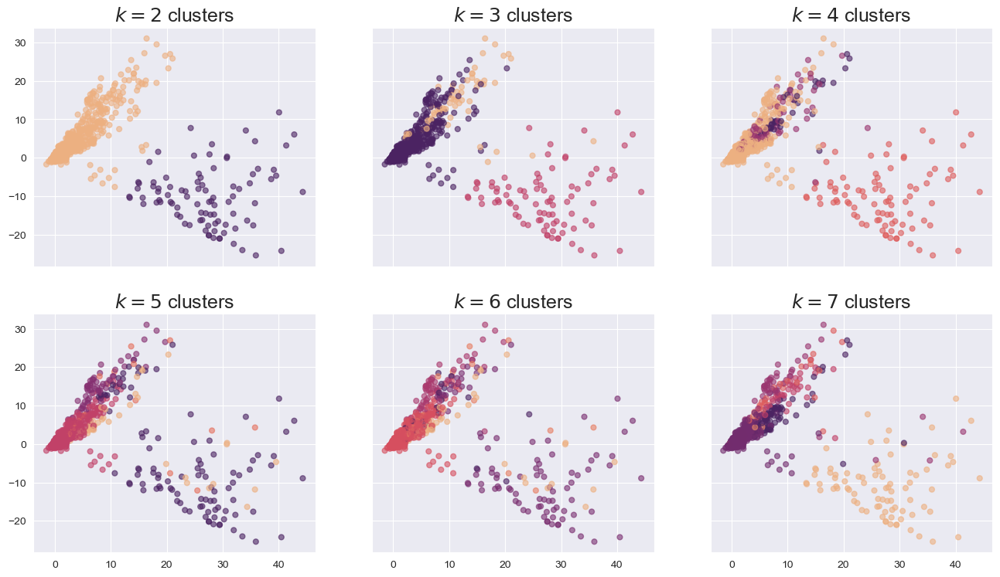

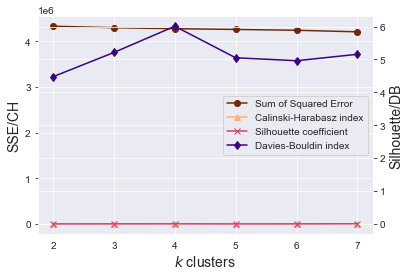

In [94]:
# KMeans

res_users = cluster_range(X_svd_user, KMeans(random_state=1337), 2, 7)
plot_clusters(X_svd_user, res_users['ys'], res_users['centers']);

plot_internal(res_users['inertias'], res_users['chs'], res_users['scs'],
              res_users['dbs']);

#### K-Medoids Clustering

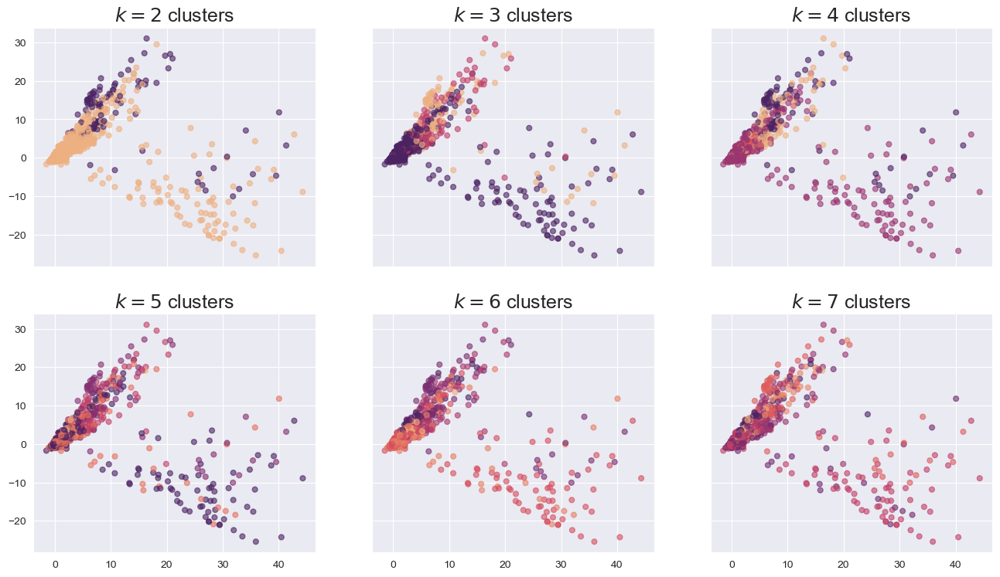

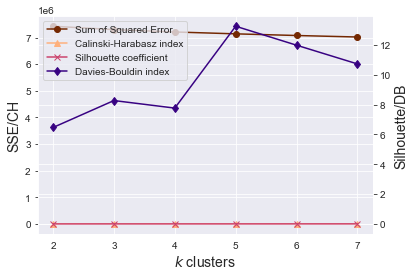

In [95]:
# # KMedoid

res_users2 = cluster_range_kmedoids(X_svd_user, 2, 7)
plot_clusters(X_svd_user, res_users2['ys'], res_users2['centers']);

plot_internal(res_users2['inertias'], res_users2['chs'], res_users2['scs'],
              res_users2['dbs']);

### Hierarchical Clustering

#### Single Linkage

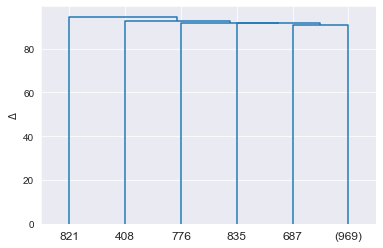

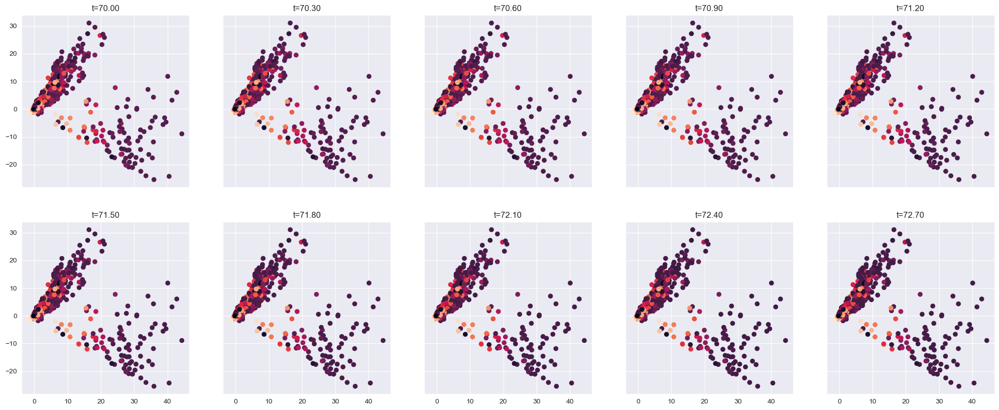

In [96]:
# Single
Y = linkage(X_svd_user, method='single')

plot1(Y);

cost = np.arange(70, 73, 0.3)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_user = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1],
                             c=y_predict_user)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=y_predict_user)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

#### Average Linkage

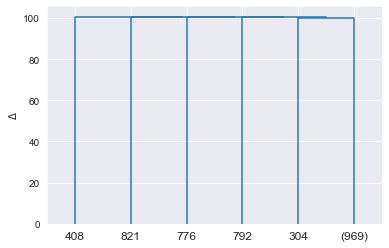

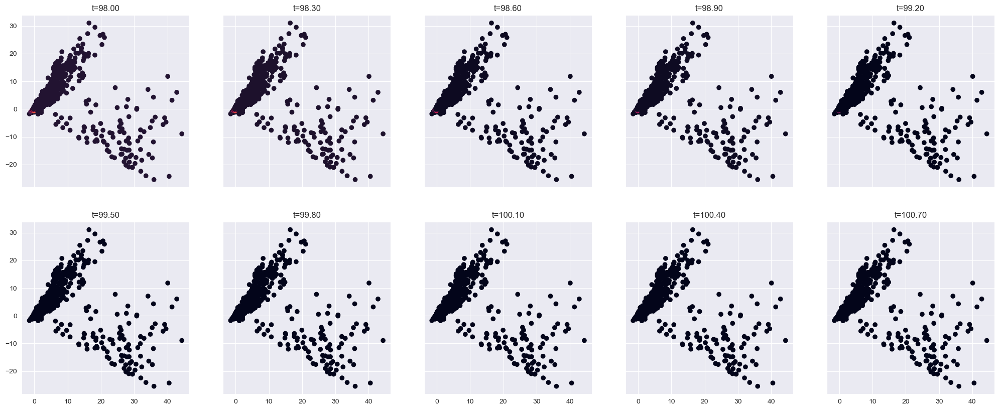

In [97]:
# Average
Y = linkage(X_svd_user, method='average')

plot1(Y);

cost = np.arange(98, 101, .3)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_user = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1],
                             c=y_predict_user)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=y_predict_user)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

#### Complete Linkage

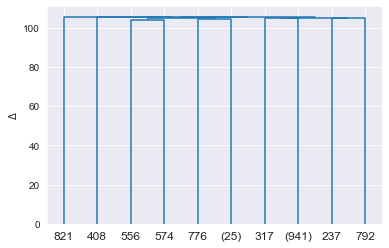

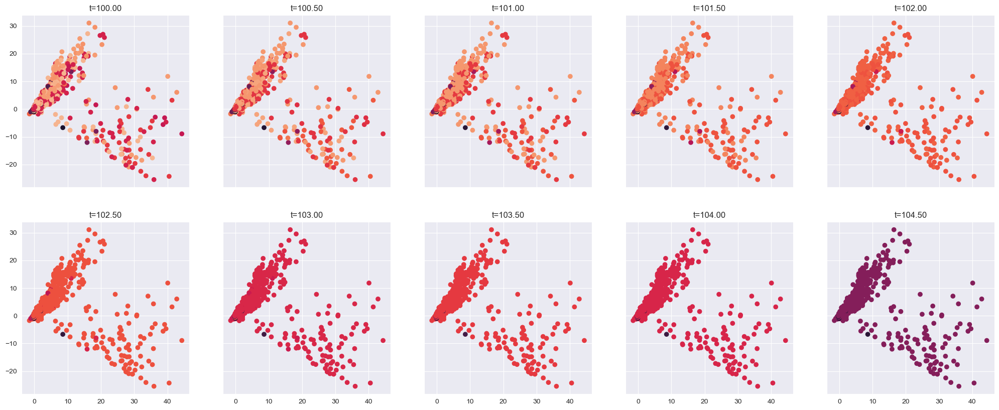

In [98]:
# Complete
Y = linkage(X_svd_user, method='complete')

plot1(Y);

cost = np.arange(100, 105, .5)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_user = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1],
                             c=y_predict_user)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=y_predict_user)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

#### Ward's Linkage

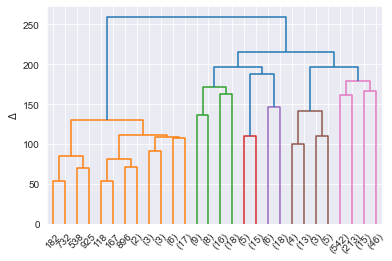

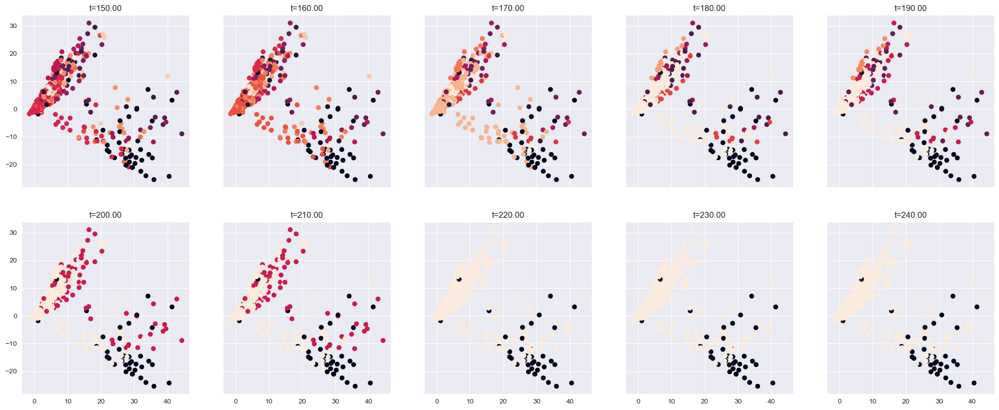

In [99]:
# Ward
Y = linkage(X_svd_user, method='ward')

plot1(Y);

cost = np.arange(150, 250, 10)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_user = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1],
                             c=y_predict_user)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=y_predict_user)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

### Density-based Clustering

#### DBSCAN

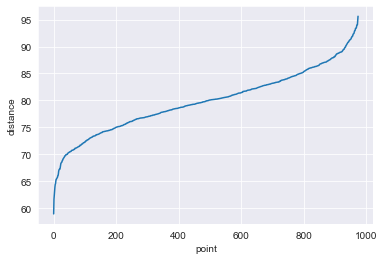

In [100]:
plt.plot(ave_nn_dist(5, X_svd_user))
plt.xlabel('point')
plt.ylabel('distance');

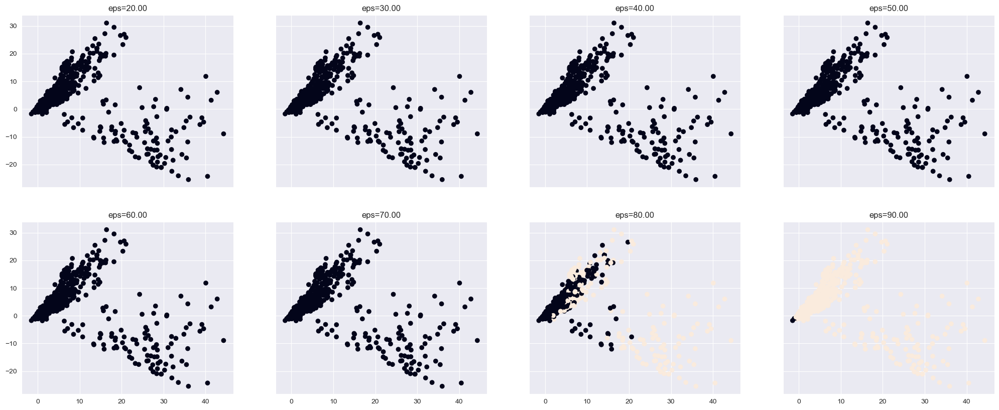

In [101]:
epss = np.arange(20, 100, 10)
min_pts = 50
dbcvs = []
fig, ax = plt.subplots(2, len(epss)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, eps in enumerate(epss):
    dbscan = DBSCAN(eps=eps, min_samples=min_pts)
    cluster_labels = dbscan.fit_predict(X_svd_user)
    if index < (len(epss)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1], c=cluster_labels)
        ax[0][index].set_title(f'eps={eps:.2f}')
    else:
        ax[1][index-len(epss)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=cluster_labels)
        ax[1][index-len(epss)//2].set_title(f'eps={eps:.2f}')


#### OPTICS

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:15<00:00,  3.86s/it]


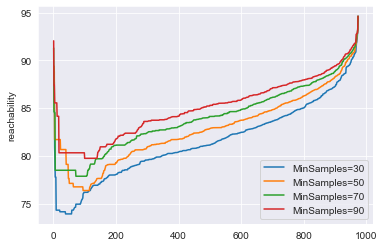

In [102]:
for ms in tqdm(np.arange(30, 100, 20)):
    optics = OPTICS(min_samples=ms)
    optics.fit(X_svd_user)
    plt.plot(optics.reachability_[optics.ordering_], label=f'MinSamples={ms}')
    plt.ylabel('reachability')
    plt.legend(loc='best');

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 284.66it/s]


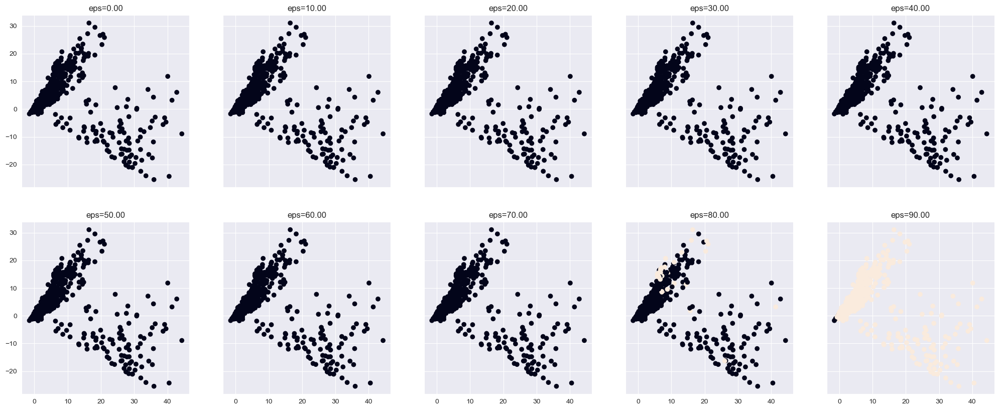

In [103]:
epss = np.arange(0, 100, 10)
fig, ax = plt.subplots(2, len(epss)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))

for index, eps in enumerate(tqdm(epss)):
    cluster_labels = cluster_optics_dbscan(
                        reachability=optics.reachability_,
                        core_distances=optics.core_distances_,
                        ordering=optics.ordering_,
                        eps=eps
                        )
    if index < (len(epss)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1],
                             c=cluster_labels)
        ax[0][index].set_title(f'eps={eps:.2f}')
    else:
        ax[1][index-len(epss)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=cluster_labels)
        ax[1][index-len(epss)//2].set_title(f'eps={eps:.2f}')

### Probabilistic Clustering Method

#### Gaussian Mixture Clustering

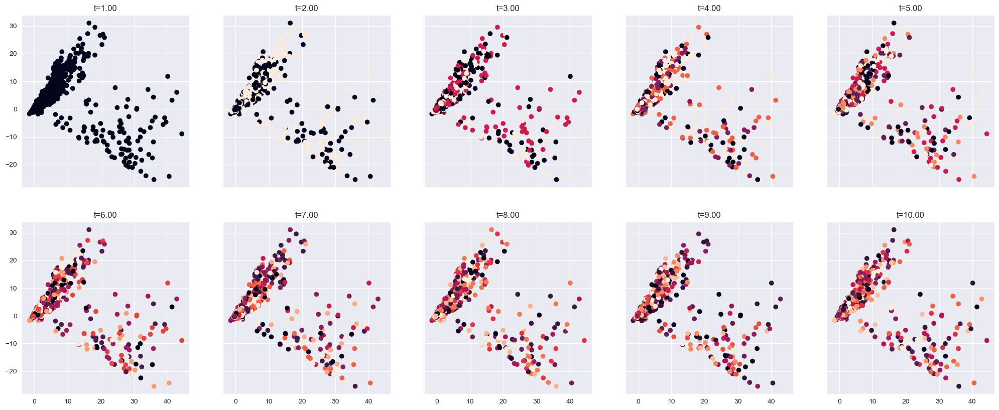

In [104]:
cost = range(1, 11)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))

for index, t in enumerate(cost):
    y_predict_dessert = GMM(n_components=t,
                                        init_params='random',
                                        covariance_type='full',
                                        tol=1e-2,
                                        max_iter=100,
                                        n_init=1).fit_predict(X_svd_user)
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_user[:,0], X_svd_user[:,1],
                             c=y_predict_dessert)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_user[:,0], X_svd_user[:,1],
                                          c=y_predict_dessert)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

## Exhibit 2. Choosing the Clustering Method for Items

### Representative-based Clustering

#### K-means Clustering

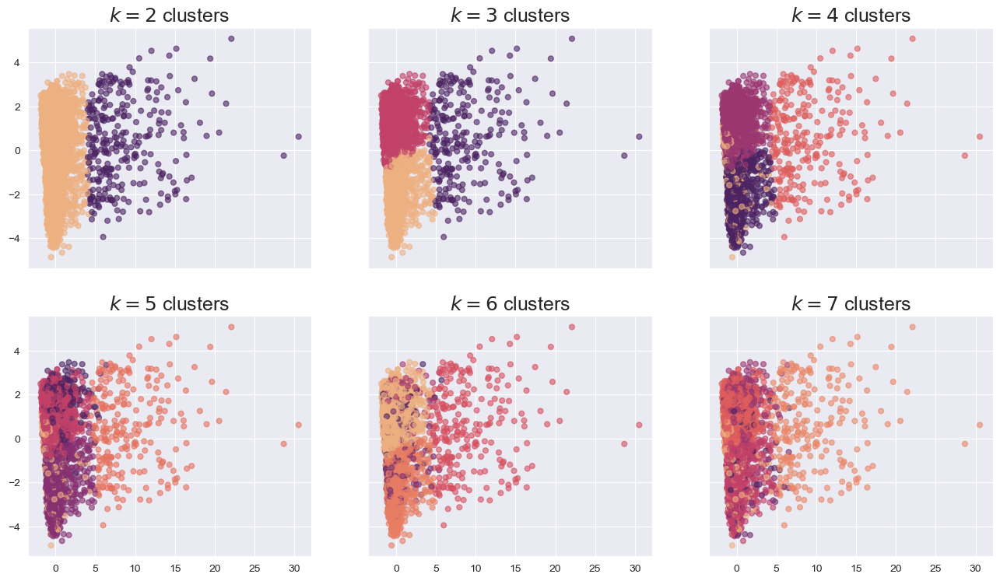

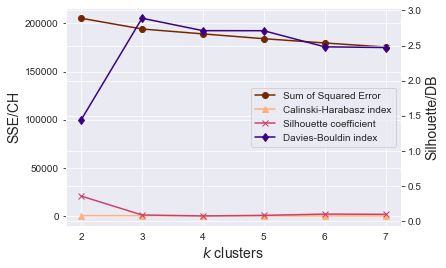

In [105]:
# KMeans

res_item = cluster_range(X_svd_item, KMeans(random_state=1337), 2, 7)
plot_clusters(X_svd_item, res_item['ys'], res_item['centers']);

plot_internal(res_item['inertias'], res_item['chs'], res_item['scs'],
              res_item['dbs']);

#### K-medoids Clustering

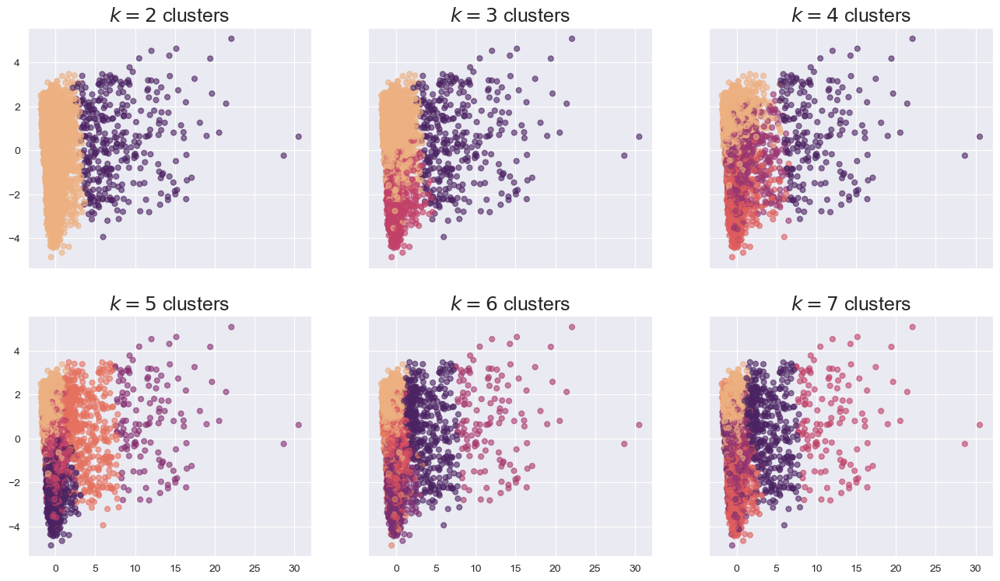

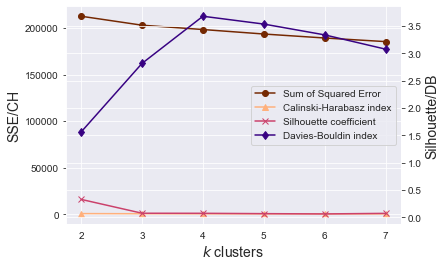

In [106]:
res_item2 = cluster_range_kmedoids(X_svd_item, 2, 7)
plot_clusters(X_svd_item, res_item2['ys'], res_item2['centers']);

plot_internal(res_item2['inertias'], res_item2['chs'], res_item2['scs'],
              res_item2['dbs']);

### Hierarchical Clustering

#### Single Linkage

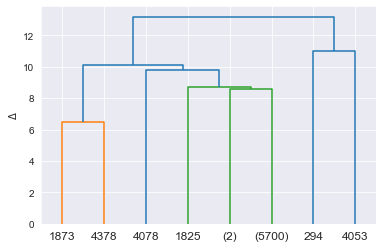

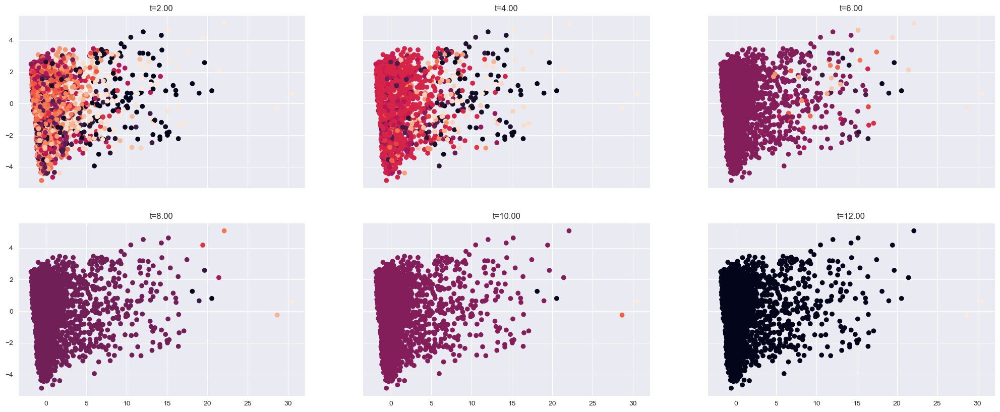

In [107]:
# Single
Y = linkage(X_svd_item, method='single')

plot1(Y);

cost = np.arange(2, 14, 2)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_item = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=y_predict_item)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=y_predict_item)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

#### Average Linkage

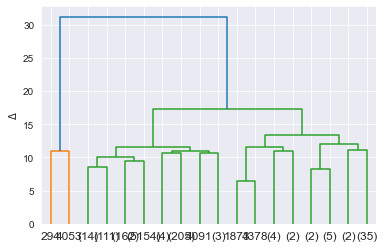

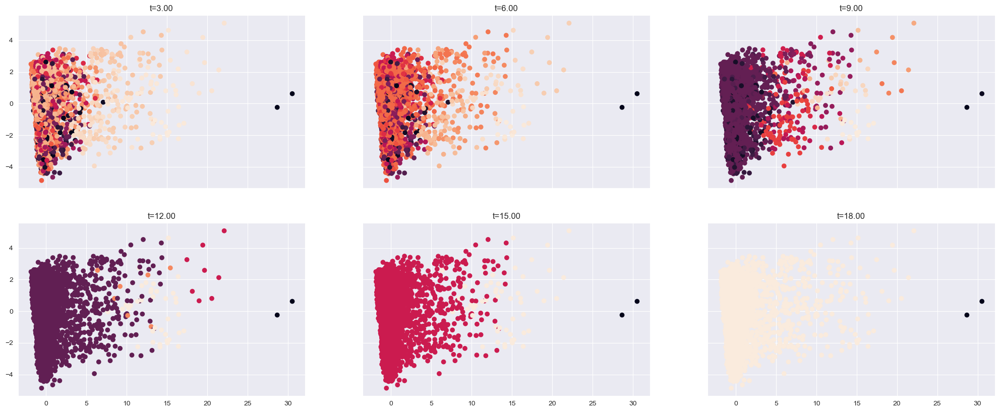

In [108]:
# Average
Y = linkage(X_svd_item, method='average')

plot1(Y);

cost = np.arange(3, 21, 3)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_item = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=y_predict_item)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=y_predict_item)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

#### Complete Linkage

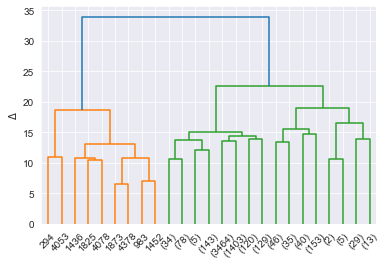

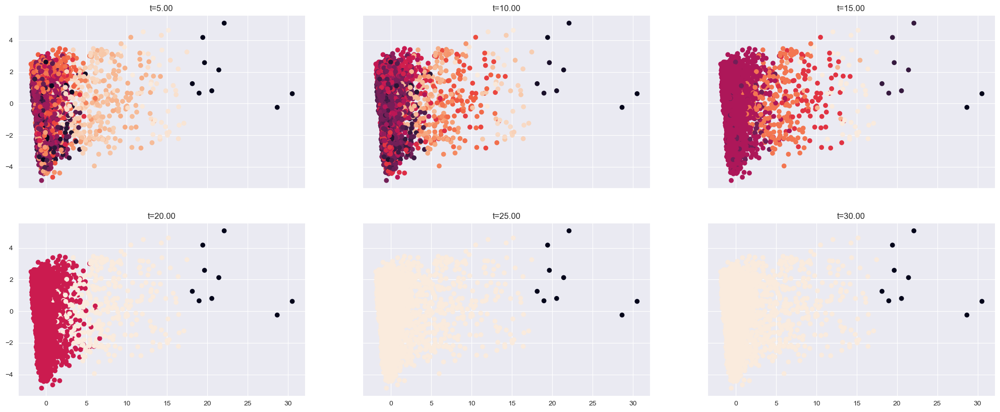

In [109]:
# Complete
Y = linkage(X_svd_item, method='complete')

plot1(Y);

cost = np.arange(5, 35, 5)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_item = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=y_predict_item)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=y_predict_item)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

#### Ward's Linkage

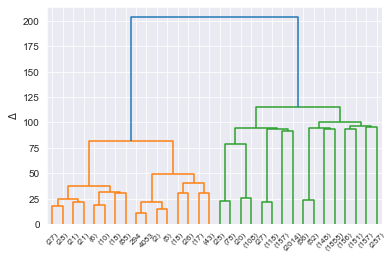

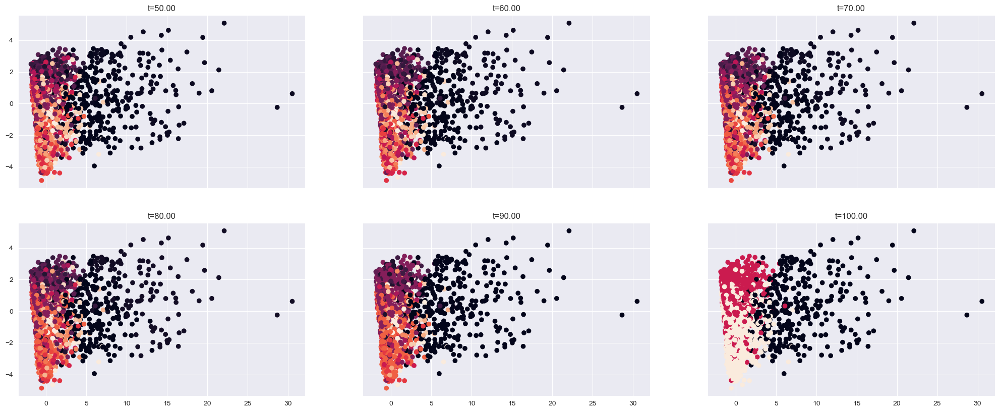

In [110]:
# Ward
Y = linkage(X_svd_item, method='ward')

plot1(Y);

cost = np.arange(50, 110, 10)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, t in enumerate(cost):
    y_predict_item = fcluster(Y, t=t, criterion='distance')
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=y_predict_item)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=y_predict_item)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')

### Density-based Clustering

#### DBSCAN

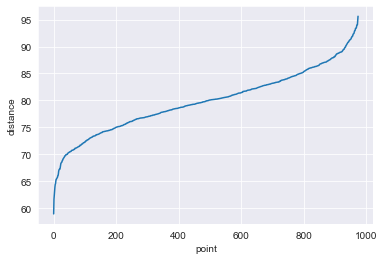

In [111]:
plt.plot(ave_nn_dist(5, X_svd_user))
plt.xlabel('point')
plt.ylabel('distance');

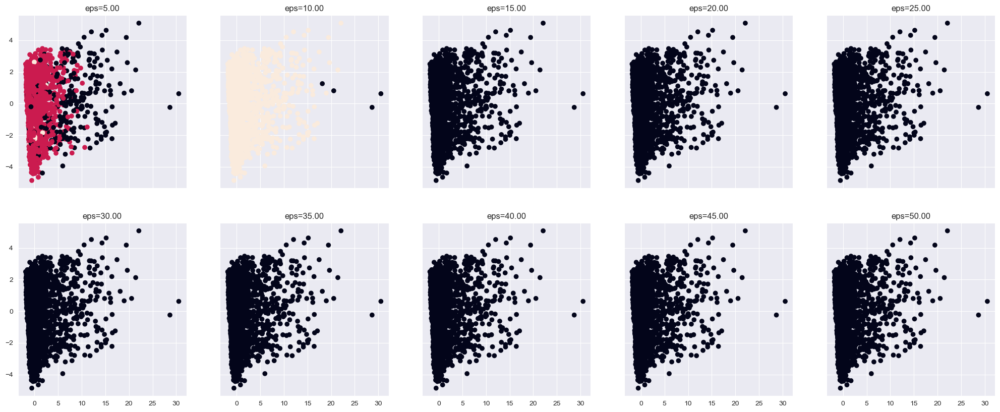

In [112]:
epss = np.arange(5, 55, 5)
min_pts = 10
dbcvs = []
fig, ax = plt.subplots(2, len(epss)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))
for index, eps in enumerate(epss):
    dbscan = DBSCAN(eps=eps, min_samples=min_pts)
    cluster_labels = dbscan.fit_predict(X_svd_item)
    if index < (len(epss)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=cluster_labels)
        ax[0][index].set_title(f'eps={eps:.2f}')
    else:
        ax[1][index-len(epss)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=cluster_labels)
        ax[1][index-len(epss)//2].set_title(f'eps={eps:.2f}')
        

#### OPTICS

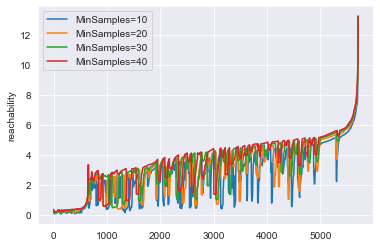

In [113]:
for ms in np.arange(10, 50, 10):
    optics = OPTICS(min_samples=ms)
    optics.fit(X_svd_item)
    plt.plot(optics.reachability_[optics.ordering_], label=f'MinSamples={ms}')
    plt.ylabel('reachability')
    plt.legend(loc='best');

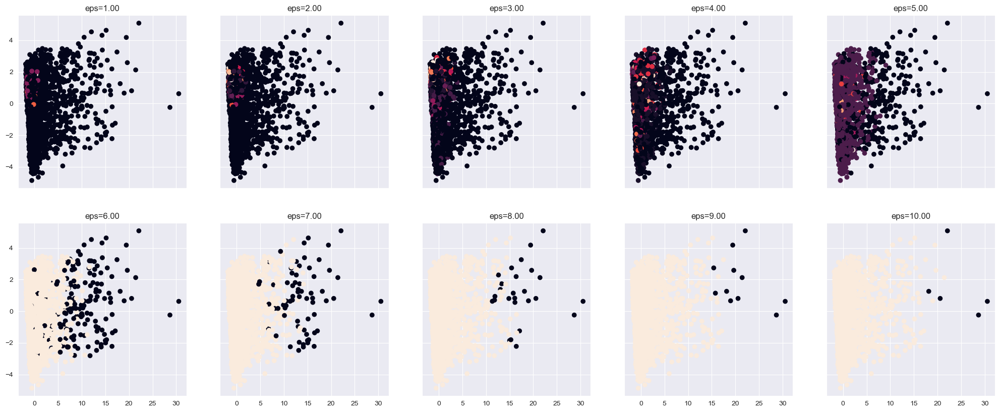

In [114]:
epss = np.arange(1, 11, 1)
fig, ax = plt.subplots(2, len(epss)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))

for index, eps in enumerate(epss):
    cluster_labels = cluster_optics_dbscan(
                        reachability=optics.reachability_,
                        core_distances=optics.core_distances_,
                        ordering=optics.ordering_,
                        eps=eps
                        )
    if index < (len(epss)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=cluster_labels)
        ax[0][index].set_title(f'eps={eps:.2f}')
    else:
        ax[1][index-len(epss)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=cluster_labels)
        ax[1][index-len(epss)//2].set_title(f'eps={eps:.2f}')

### Probabilistic Clustering

#### Gaussian Mixture

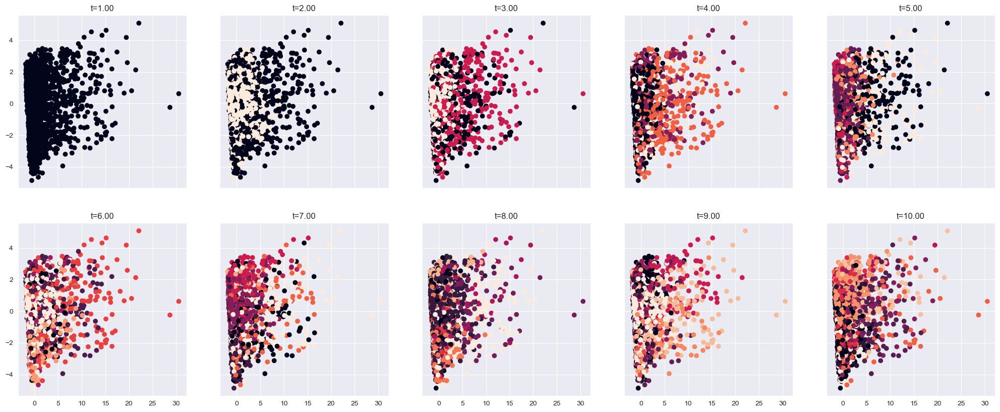

In [115]:

cost = range(1, 11)
fig, ax = plt.subplots(2, len(cost)//2, dpi=100, sharex=True, sharey=True, 
                           figsize=(25,10))

for index, t in enumerate(cost):
    y_predict_dessert = GMM(n_components=t,
                                        init_params='random',
                                        covariance_type='full',
                                        tol=1e-2,
                                        max_iter=100,
                                        n_init=1).fit_predict(X_svd_item)
    if index < (len(cost)//2):
        ax[0][index].scatter(X_svd_item[:,0], X_svd_item[:,1],
                             c=y_predict_dessert)
        ax[0][index].set_title(f't={t:.2f}')
    else:
        ax[1][index-len(cost)//2].scatter(X_svd_item[:,0], X_svd_item[:,1],
                                          c=y_predict_dessert)
        ax[1][index-len(cost)//2].set_title(f't={t:.2f}')